# 클러스터링

In [1]:
import pandas as pd
import math
import numpy as np
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
dataPath = '../../data/'
df = pd.read_csv(f'{dataPath}/processed/distance_df/31_0.999.csv')
#df = pd.read_csv('./makeDataset/dataset/no_NaN_dataset_final.csv')

#df = df.drop(['Unnamed: 0'], axis=1) #이삭이의 데이터를 돌리때는 필요합니다..

In [3]:
col = ['총인구수(명)','유치원 수', '초등학교 수', '출생건수', '사망건수', '혼인건수', '이혼건수', '학령인구(명)', '총인구수-학령인구(명)']

new_df = df.copy()

In [4]:
new_df = new_df.drop(['연도'],axis=1, inplace=False)

new_df

,행정구역(시도),행정구역(시군구),총인구수(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명),총인구수-학령인구(명),행정구역
0,서울특별시,종로구,170795.692385,17.022537,14.010845,1109.477804,852.694270,1012.623666,396.456493,29164,141588.857080,서울특별시 종로구
1,서울특별시,중구,133082.052802,13.026904,12.013005,1172.410002,671.889758,1050.589448,378.475413,19628,113400.649423,서울특별시 중구
2,서울특별시,용산구,245006.912106,19.021620,15.010422,2313.389756,1086.465502,1784.941162,528.338542,37318,207651.269059,서울특별시 용산구
3,서울특별시,성동구,309184.241184,31.009008,20.004861,2886.721647,1226.377399,2306.361662,672.211435,51562,257599.756823,서울특별시 성동구
4,서울특별시,광진구,375523.110954,41.999156,22.004677,3366.685849,1290.351565,2672.281749,811.108292,67422,308085.717129,서울특별시 광진구
...,...,...,...,...,...,...,...,...,...,...,...,...
2894,경상남도,함양군,37708.000158,11.999515,12.999610,76.018288,667.929759,90.002151,60.001757,4135,33572.760439,경상남도 함양군
2895,경상남도,거창군,60364.723511,15.996717,16.997353,174.903034,803.933792,162.921592,93.966739,8548,51821.749256,경상남도 거창군
2896,경상남도,합천군,42142.448487,14.997508,16.996525,97.021975,898.780260,89.007830,71.005165,3385,38756.125660,경상남도 합천군
2897,제주특별자치도,제주시,493080.381000,73.971000,68.976000,2764.067000,3279.244000,2032.650000,1101.360000,84346,408790.553000,제주특별자치도 제주시


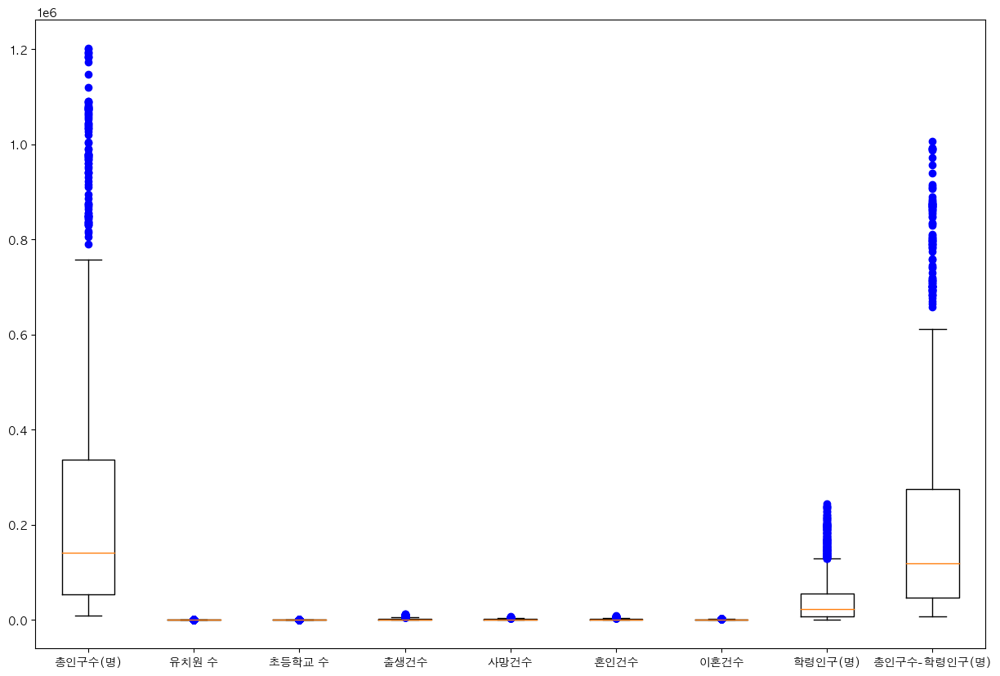

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams["font.family"] = "AppleGothic"
plt.rcParams['axes.unicode_minus'] = False

fig, ax = plt.subplots(figsize=(15, 10))
plt.boxplot([new_df[col[i]] for i in range(len(col))], sym='bo')
plt.xticks(range(1, len(col) + 1), col)

plt.show()

In [6]:
for col_name in col:
    mask_positive = new_df[col_name] >= 0
    mask_negative = ~mask_positive

    # 양수에 대해서는 로그 변환
    new_df.loc[mask_positive, col_name] = np.log1p(new_df.loc[mask_positive, col_name])

    # 음수에 대해서는 음수로 변환 후 로그 변환
    new_df.loc[mask_negative, col_name] = -np.log1p(-new_df.loc[mask_negative, col_name])

print(new_df.isnull().sum())

행정구역(시도)        0
행정구역(시군구)       0
총인구수(명)         0
유치원 수           0
초등학교 수          0
출생건수            0
사망건수            0
혼인건수            0
이혼건수            0
학령인구(명)         0
총인구수-학령인구(명)    0
행정구역            0
dtype: int64


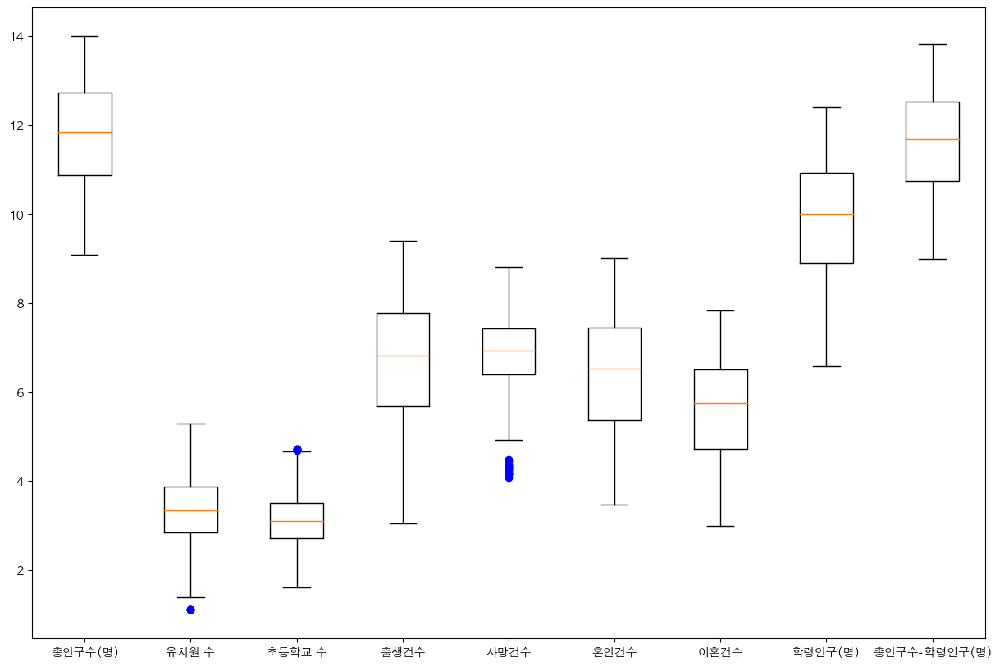

In [7]:
fig, ax = plt.subplots(figsize=(15, 10))
plt.boxplot([new_df[col[i]] for i in range(len(col))], sym='bo')
plt.xticks(range(1, len(col) + 1), col)

plt.show()

In [8]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples

In [9]:
X_features = new_df[col].values

In [10]:
# 정규 분포로 다시 스케일링하기
from sklearn.preprocessing import StandardScaler

X_features_scaled = StandardScaler().fit_transform(X_features)

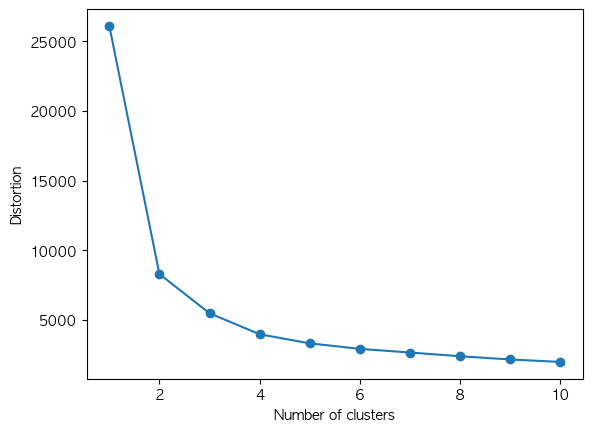

In [11]:
distortions = []

for i in range(1, 11):
    kmeans_i = KMeans(n_clusters=i, random_state=0)  # 모델 생성
    kmeans_i.fit(X_features_scaled)   # 모델 훈련
    distortions.append(kmeans_i.inertia_)
    
plt.plot(range(1,11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

In [12]:
kmeans = KMeans(n_clusters=4, random_state=0, n_init=10) # 모델 생성

# 모델 학습과 결과 예측(클러스터 레이블 생성)
Y_labels = kmeans.fit_predict(X_features_scaled) 

In [13]:
new_df['ClusterLabel'] = Y_labels

new_df.head()

,행정구역(시도),행정구역(시군구),총인구수(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명),총인구수-학령인구(명),행정구역,ClusterLabel
0,서울특별시,종로구,12.048229,2.891623,2.708773,7.012546,6.749573,6.921287,5.985085,10.280725,11.860690,서울특별시 종로구,0
1,서울특별시,중구,11.798729,2.640977,2.565949,7.067669,6.511582,6.958058,5.938790,9.884763,11.638691,서울특별시 중구,0
2,서울특별시,용산구,12.409046,2.996813,2.773240,7.746901,6.991605,7.487701,6.271628,10.527258,12.243620,서울특별시 용산구,3
3,서울특별시,성동구,12.641696,3.466017,3.044754,7.968223,7.112635,7.743860,6.512059,10.850560,12.459166,서울특별시 성동구,3
4,서울특별시,광진구,12.836078,3.761180,3.135698,8.121981,7.163445,7.891062,6.699634,11.118741,12.638137,서울특별시 광진구,3


In [14]:
from matplotlib import cm

def silhouetteViz(n_cluster, X_features): 
    
    kmeans = KMeans(n_clusters=n_cluster, random_state=0,n_init=10)
    Y_labels = kmeans.fit_predict(X_features)
    
    silhouette_values = silhouette_samples(X_features, Y_labels, metric='euclidean')

    y_ax_lower, y_ax_upper = 0, 0
    y_ticks = []

    for c in range(n_cluster):
        c_silhouettes = silhouette_values[Y_labels == c]
        c_silhouettes.sort()
        y_ax_upper += len(c_silhouettes)
        color = cm.jet(float(c) / n_cluster)
        plt.barh(range(y_ax_lower, y_ax_upper), c_silhouettes,
                 height=1.0, edgecolor='none', color=color)
        y_ticks.append((y_ax_lower + y_ax_upper) / 2.)
        y_ax_lower += len(c_silhouettes)
    
    silhouette_avg = np.mean(silhouette_values)
    plt.axvline(silhouette_avg, color='red', linestyle='--')
    plt.title('Number of Cluster : '+ str(n_cluster)+'\n' \
              + 'Silhouette Score : '+ str(round(silhouette_avg,3)))
    plt.yticks(y_ticks, range(n_cluster))   
    plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.ylabel('Cluster')
    plt.xlabel('Silhouette coefficient')
    plt.tight_layout()
    plt.show()

In [15]:
def clusterScatter(n_cluster, X_features): 
    c_colors = []
    kmeans = KMeans(n_clusters=n_cluster, random_state=0, n_init=10)
    Y_labels = kmeans.fit_predict(X_features)

    for i in range(n_cluster):
        c_color = cm.jet(float(i) / n_cluster) #클러스터의 색상 설정
        c_colors.append(c_color)
        #클러스터의 데이터 분포를 동그라미로 시각화
        plt.scatter(X_features[Y_labels == i,0], X_features[Y_labels == i,1],
                     marker='o', color=c_color, edgecolor='black', s=50, 
                     label='cluster '+ str(i))       
    
    #각 클러스터의 중심점을 삼각형으로 표시
    for i in range(n_cluster):
        plt.scatter(kmeans.cluster_centers_[i,0], kmeans.cluster_centers_[i,1], 
                    marker='^', color=c_colors[i], edgecolor='w', s=200)
        
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

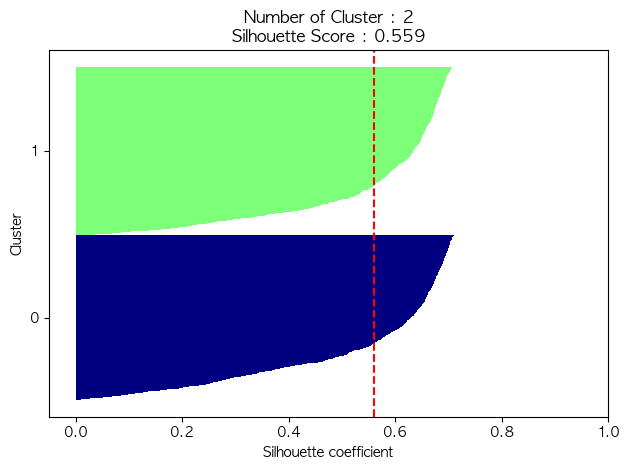

In [16]:
silhouetteViz(2, X_features_scaled) #클러스터 3개인 경우의 실루엣 score 및 각 클러스터 비중 시각화

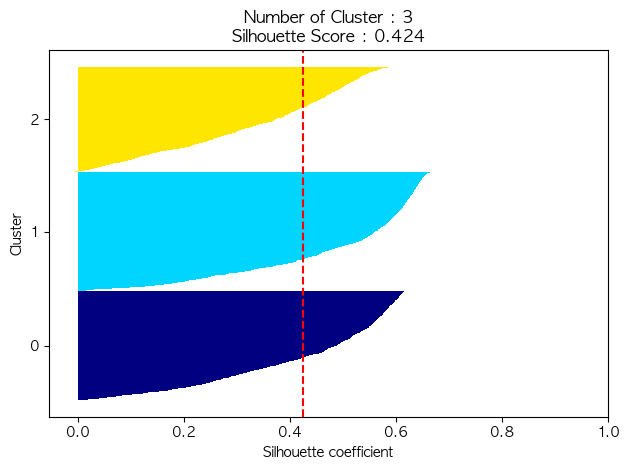

In [17]:
silhouetteViz(3, X_features_scaled) #클러스터 3개인 경우의 실루엣 score 및 각 클러스터 비중 시각화

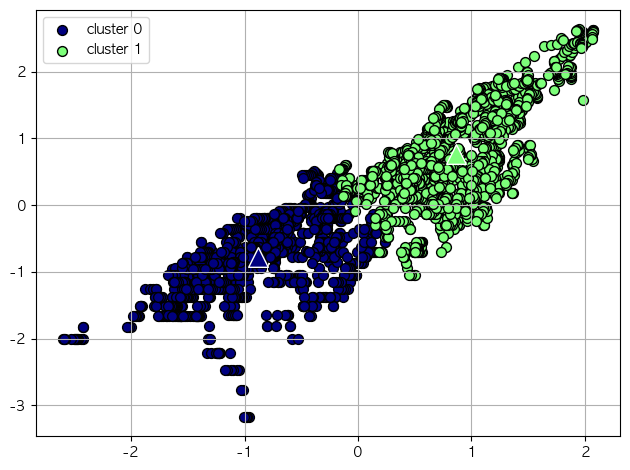

In [18]:
clusterScatter(2, X_features_scaled) #클러스터 3개인 경우의 클러스터 데이터 분포 시각화

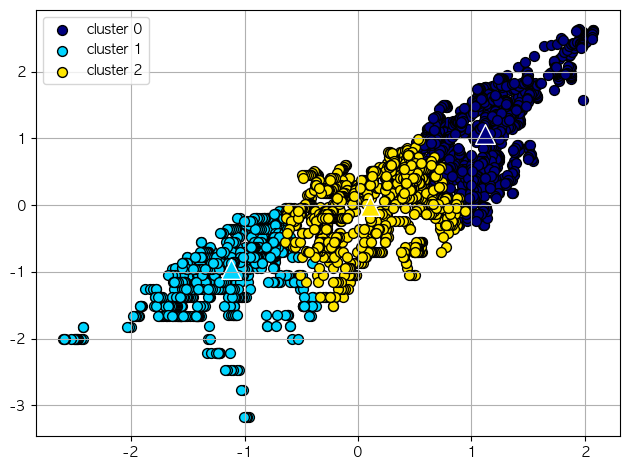

In [19]:
clusterScatter(3, X_features_scaled) #클러스터 3개인 경우의 클러스터 데이터 분포 시각화

In [20]:
best_cluster = 2

kmeans = KMeans(n_clusters=best_cluster, random_state=0,n_init=10)
Y_labels = kmeans.fit_predict(X_features_scaled)

In [21]:
#df['ClusterLabel'] = Y_labels
new_df['ClusterLabel'] = Y_labels

df.head()  #작업 확인용 출력

,행정구역(시도),행정구역(시군구),연도,총인구수(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명),총인구수-학령인구(명),행정구역
0,서울특별시,종로구,2010,170795.692385,17.022537,14.010845,1109.477804,852.694270,1012.623666,396.456493,29164,141588.857080,서울특별시 종로구
1,서울특별시,중구,2010,133082.052802,13.026904,12.013005,1172.410002,671.889758,1050.589448,378.475413,19628,113400.649423,서울특별시 중구
2,서울특별시,용산구,2010,245006.912106,19.021620,15.010422,2313.389756,1086.465502,1784.941162,528.338542,37318,207651.269059,서울특별시 용산구
3,서울특별시,성동구,2010,309184.241184,31.009008,20.004861,2886.721647,1226.377399,2306.361662,672.211435,51562,257599.756823,서울특별시 성동구
4,서울특별시,광진구,2010,375523.110954,41.999156,22.004677,3366.685849,1290.351565,2672.281749,811.108292,67422,308085.717129,서울특별시 광진구


In [22]:
print(new_df.groupby('ClusterLabel')['행정구역(시군구)'].count())

ClusterLabel
0    1434
1    1465
Name: 행정구역(시군구), dtype: int64


In [23]:
new_df1 = new_df[['행정구역(시도)', '행정구역(시군구)', 'ClusterLabel']]
new_df1 = new_df.groupby(['행정구역(시도)', '행정구역(시군구)'])['ClusterLabel'].apply(lambda x: x.mode().iloc[0]).reset_index()
new_df1

merged_df = pd.merge(df, new_df1[['행정구역(시도)', '행정구역(시군구)', 'ClusterLabel']], 
                     on=['행정구역(시도)', '행정구역(시군구)'], how='left')

merged_df

,행정구역(시도),행정구역(시군구),연도,총인구수(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명),총인구수-학령인구(명),행정구역,ClusterLabel
0,서울특별시,종로구,2010,170795.692385,17.022537,14.010845,1109.477804,852.694270,1012.623666,396.456493,29164,141588.857080,서울특별시 종로구,0
1,서울특별시,중구,2010,133082.052802,13.026904,12.013005,1172.410002,671.889758,1050.589448,378.475413,19628,113400.649423,서울특별시 중구,0
2,서울특별시,용산구,2010,245006.912106,19.021620,15.010422,2313.389756,1086.465502,1784.941162,528.338542,37318,207651.269059,서울특별시 용산구,1
3,서울특별시,성동구,2010,309184.241184,31.009008,20.004861,2886.721647,1226.377399,2306.361662,672.211435,51562,257599.756823,서울특별시 성동구,1
4,서울특별시,광진구,2010,375523.110954,41.999156,22.004677,3366.685849,1290.351565,2672.281749,811.108292,67422,308085.717129,서울특별시 광진구,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2894,경상남도,함양군,2022,37708.000158,11.999515,12.999610,76.018288,667.929759,90.002151,60.001757,4135,33572.760439,경상남도 함양군,0
2895,경상남도,거창군,2022,60364.723511,15.996717,16.997353,174.903034,803.933792,162.921592,93.966739,8548,51821.749256,경상남도 거창군,0
2896,경상남도,합천군,2022,42142.448487,14.997508,16.996525,97.021975,898.780260,89.007830,71.005165,3385,38756.125660,경상남도 합천군,0
2897,제주특별자치도,제주시,2022,493080.381000,73.971000,68.976000,2764.067000,3279.244000,2032.650000,1101.360000,84346,408790.553000,제주특별자치도 제주시,1


In [24]:
top_df = merged_df.loc[merged_df['ClusterLabel'] == 1, ['행정구역(시도)','행정구역(시군구)']]
#top_df[top_df['행정구역(시도)'] == '강원특별자치도']
top_df_no_duplicates = top_df.drop_duplicates()
top_df_no_duplicates[top_df_no_duplicates['행정구역(시도)'] == '강원특별자치도']
#print(top_df_no_duplicates[top_df_no_duplicates['행정구역(시도)'] == '경기도'])
#print(top_df_no_duplicates[top_df_no_duplicates['행정구역(시도)'] == '경상북도'])
#print(top_df_no_duplicates[top_df_no_duplicates['행정구역(시도)'] == '경상남도'])
#print(top_df_no_duplicates[top_df_no_duplicates['행정구역(시도)'] == '서울특별시'])

,행정구역(시도),행정구역(시군구)
101,강원특별자치도,춘천시
102,강원특별자치도,원주시
103,강원특별자치도,강릉시


In [25]:
cluster_df0 = merged_df[merged_df['ClusterLabel']==0]
cluster_df1 = merged_df[merged_df['ClusterLabel']==1]
#cluster_df2 = merged_df[merged_df['ClusterLabel']==2]
#cluster_df3 = merged_df[merged_df['ClusterLabel']==3]

#print(cluster_df0.head())
#print(cluster_df1.head())
#print(cluster_df2.head())

# 모델 생성

In [26]:
#Linear Regression

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import BaggingRegressor

In [27]:
features = cluster_df0[['총인구수(명)', '유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수', '이혼건수']]
target = cluster_df0['학령인구(명)']
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

In [28]:
model = RandomForestRegressor(n_estimators=50, random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(n_estimators=50, random_state=42)

In [29]:
y_pred = model.predict(X_test)

In [30]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """
    평균절대백분율오차를 계산하는 함수
    
    :param y_true: 실제 값이 들어 있는 리스트 또는 배열
    :param y_pred: 예측 값이 들어 있는 리스트 또는 배열
    :return: MAPE 값
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_elements = y_true != 0
    
    if np.any(non_zero_elements):
        mape = np.mean(np.abs((y_true[non_zero_elements] - y_pred[non_zero_elements]) / y_true[non_zero_elements])) * 100
        return mape
    else:
        return np.inf

In [31]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print("MAPE:", mape)

MAPE: 6.541430840732378


In [32]:
def prediction(df,idx):
    features = df[['총인구수(명)', '유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수', 
                        '이혼건수']]
    target = df['학령인구(명)']
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.1, random_state=42)
    
    model = RandomForestRegressor(n_estimators=idx,random_state=42)
    
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    
    mape = mean_absolute_percentage_error(y_test, y_pred)
    print(mape)#"MAPE", mape)

    return y_test,y_pred

In [33]:
def vis(test, pred):
    a=[]
    b=[]

    for i,j in zip(test,pred):
        a.append(i)
        b.append(j)
    plt.plot(a, label='Actual')
    plt.plot(b, label ='Predicted')
    plt.legend()
    plt.show()

6.160167903265307


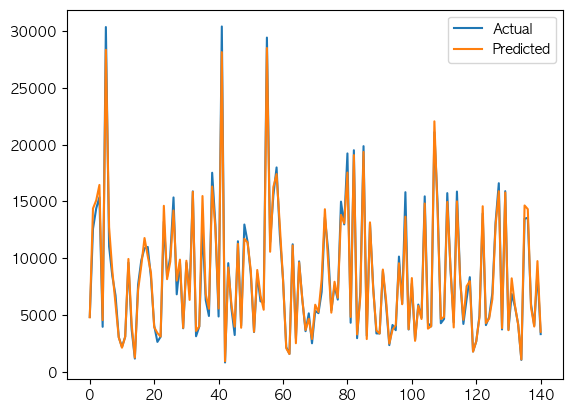

In [34]:
test, pred = prediction(cluster_df0, 10)
vis(test, pred)

4.873212362252791


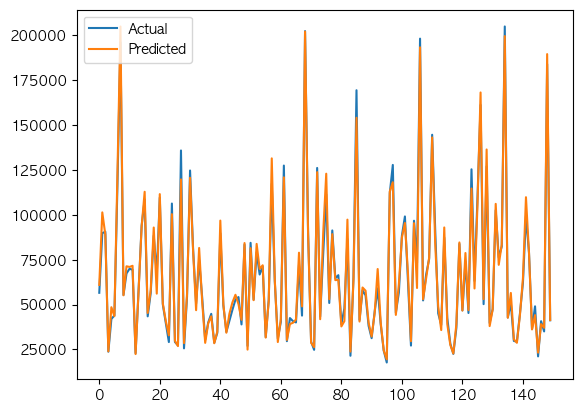

In [35]:
test, pred=prediction(cluster_df1, 46)
vis(test, pred)

# Prediction 함수 정의

In [36]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
import numpy as np
import tensorflow as tf

tf.data.experimental.enable_debug_mode()

In [37]:
def merge_region(df):
    sorted_cluster_df = df.sort_values(by=['행정구역(시도)', '행정구역(시군구)'])

    sorted_cluster_df['행정구역'] = sorted_cluster_df['행정구역(시도)'] + ' ' + sorted_cluster_df['행정구역(시군구)']

    sorted_cluster_df.drop(['행정구역(시도)', '행정구역(시군구)'], axis=1, inplace=True)
    
    return sorted_cluster_df

In [38]:
def split_by_region(df):
    regions = df['행정구역'].unique()
    cluster = []
    for i in range(len(regions)):
        cluster.append(df[df['행정구역'] == regions[i]])
        cluster[i] = cluster[i][['행정구역','연도','총인구수(명)','총인구수-학령인구(명)','유치원 수','초등학교 수', '출생건수', 
                              '사망건수','혼인건수','이혼건수','학령인구(명)']]
    return cluster

In [39]:
def train_and_predict(data):
    # 정규화
    scaler = StandardScaler()
    features = data[['총인구수(명)', '유치원 수', '초등학교 수', '출생건수', '사망건수', '혼인건수', '이혼건수', '학령인구(명)','총인구수-학령인구(명)']].values
    features_scaled = scaler.fit_transform(features)

    # 시퀀스 생성
    if data.shape[0]-1 >3:
        seq_length = 3 #data.shape[0]-1
    else:
        seq_length = data.shape[0]-1
    X = []
    y = []
    for i in range(len(features_scaled) - seq_length):
        X.append(features_scaled[i:i+seq_length])
        y.append(features_scaled[i+seq_length])

    X, y = np.array(X), np.array(y)

    # LSTM 모델 구성
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(seq_length, features.shape[1])))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(features.shape[1], activation='linear'))  # 회귀 레이어 수정
    model.compile(optimizer='adam', loss='mse')

    # 모델 학습
    model.fit(X, y, epochs=100, batch_size=16, verbose=0)

    # 마지막 데이터를 사용하여 다음 연도 예측
    new_data = features_scaled[-seq_length:]
    new_data = new_data.reshape((1, seq_length, features.shape[1]))

    predicted_data_scaled = model.predict(new_data)

    # 역정규화하여 예측 결과 얻기
    predicted_data = scaler.inverse_transform(predicted_data_scaled)

    return predicted_data

In [40]:
def predict_feature(df):
    predict_list = []
    for i in range(len(df)):
        predict_data = train_and_predict(df[i])
        predict_list.append(predict_data)
        print(df[i]["행정구역"].iloc[0], predict_data)
    
    return predict_list

In [41]:
def future_prediction(df):
    features = df[['총인구수(명)','유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수','이혼건수']]
    target = df['총인구수-학령인구(명)']
    #X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.0, random_state=42)
    
    model = RandomForestRegressor(n_estimators=50,random_state=42)
    model.fit(features, target)

    #y_pred = model.predict(X_test)
    #print(y_pred)

    return model

In [42]:
def run_model(predict_list, model):
    random_for = []
    lstmm = []
    column = ['총인구수(명)','유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수','이혼건수','학령인구(명)']

    for i in range(len(predict_list)):
        rf = [round(float(value)) for value in str(predict_list[i][0][0:-1])[1:-2].split()]
        total_rf = pd.DataFrame([rf], columns=column)
        predicti = model.predict(total_rf)
        random_for.append(round(float(predicti[0])))
        
        lt = round(float(str(predict_list[i][0][-1])))
        lstmm.append(round(lt))
        
    return random_for, lstmm

In [43]:
def actual_data(df, cluster_df):
    df = df[df['연도'] == 2021]

    df = df[['행정구역(시도)','행정구역(시군구)','총인구수-학령인구(명)']]
    df['행정구역'] = df['행정구역(시도)'] + ' ' + df['행정구역(시군구)']
    df.drop(['행정구역(시도)', '행정구역(시군구)'], axis=1, inplace=True)

    df = df[df['행정구역'].isin(cluster_df['행정구역'].unique())]
    df = df.sort_values(by=['행정구역'])
    actu = df['총인구수-학령인구(명)'].reset_index(drop=True)
    return actu

In [44]:
def visualization_prediction(actu, model):
    
    actu_no_nan = np.where(np.isnan(actu), model,actu)
    plt.plot(actu_no_nan, label='Actual')
    plt.plot(model, label='model')

    plt.xlabel('Region Index')
    plt.ylabel('Scholar Population')
    plt.legend()
    plt.show()

    mape = mean_absolute_percentage_error(actu_no_nan, model)
    print("MAPE:", mape)

In [45]:
from statsmodels.tsa.arima.model import ARIMA

def run_ARIMA(cluster):
    # Assuming your time series data is stored in a Pandas DataFrame or Series
    # Replace this with your actual data
    features = ['연도','총인구수(명)','총인구수-학령인구(명)','유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수','이혼건수','학령인구(명)']
    not_two_f = ['총인구수-학령인구(명)','출생건수', '사망건수', '혼인건수','이혼건수']
    fv_list = []
    
    for feature in features:
        data = pd.Series(cluster[feature].reset_index(drop=True))

        # Fit ARIMA model
        if(feature in not_two_f):
            model = ARIMA(data, order=(1, 2, 1))  # You can adjust the order parameters based on your data characteristics
        else:
            model = ARIMA(data, order=(1, 2, 1))
        fit_model = model.fit()

        # Forecast the next 10 values
        forecast_values = fit_model.forecast(steps=39)
        fv_list.append(forecast_values)
    df = pd.DataFrame(fv_list).transpose()
    df.columns = features
    return df

# 22~60 Prediction

In [46]:
cluster_df0_2022 = cluster_df0[cluster_df0['연도'] == 2022]
cluster_df0_except_2022 = cluster_df0[cluster_df0['연도'] != 2022]

cluster_df1_2022 = cluster_df1[cluster_df1['연도'] == 2022]
cluster_df1_except_2022 = cluster_df1[cluster_df1['연도'] != 2022]


#sort_cluster0 = merge_region(cluster_df0_except_2022)
#sort_cluster1 = merge_region(cluster_df1_except_2022)
#sort_cluster2 = merge_region(cluster_df2)
#======================================================================
#cluster0 = split_by_region(sort_cluster0)
#cluster1 = split_by_region(sort_cluster1)
#cluster2 = split_by_region(sort_cluster2)
#======================================================================
# 굉장히 오래걸림

#predict_list0 = predict_feature(cluster0)
#print('[INFO]FINISH CLUSTER 0')
#predict_list1 = predict_feature(cluster1)
#print('[INFO]FINISH CLUSTER 1')
#predict_list2 = predict_feature(cluster2)
#print('[INFO]FINISH CLUSTER 2')
#======================================================================


In [47]:
sort_cluster0 = merge_region(cluster_df0_except_2022)
sort_cluster1 = merge_region(cluster_df1_except_2022)

sort_cluster1.head()

,연도,총인구수(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명),총인구수-학령인구(명),행정구역,ClusterLabel
103,2010,218503.0,40.0,35.0,1641.0,1413.0,1071.0,487.0,43102,175401.0,강원특별자치도 강릉시,1
326,2011,217571.0,40.0,35.0,1671.0,1434.0,1140.0,496.0,41960,175611.0,강원특별자치도 강릉시,1
549,2012,217741.0,40.0,35.0,1636.0,1490.0,1107.0,475.0,41589,176152.0,강원특별자치도 강릉시,1
772,2013,216806.0,40.0,35.0,1460.0,1471.0,1026.0,528.0,40758,176048.0,강원특별자치도 강릉시,1
995,2014,215807.0,41.0,35.0,1298.0,1539.0,983.0,473.0,39345,176462.0,강원특별자치도 강릉시,1


In [48]:
cluster0 = split_by_region(sort_cluster0)
cluster1 = split_by_region(sort_cluster1)
 
cluster1[0].tail()

,행정구역,연도,총인구수(명),총인구수-학령인구(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명)
1664,강원특별자치도 강릉시,2017,213952.0,179172.0,38.0,35.0,1084.0,1529.0,924.0,444.0,34780
1887,강원특별자치도 강릉시,2018,212957.0,179407.0,38.0,35.0,1036.0,1678.0,876.0,433.0,33550
2110,강원특별자치도 강릉시,2019,213442.0,180929.0,36.0,34.0,964.0,1720.0,893.0,494.0,32513
2333,강원특별자치도 강릉시,2020,213321.0,182434.0,37.0,35.0,950.0,1709.0,801.0,415.0,30887
2556,강원특별자치도 강릉시,2021,212965.0,183211.0,37.0,35.0,892.0,1710.0,799.0,420.0,29754


In [49]:
def vis1(a, b):
    mape = mean_absolute_percentage_error(a, b)
    print("MAPE:", mape)
    plt.plot(a, label='Actual')
    plt.plot(b, label ='Predicted')
    plt.legend()
    plt.show()

# Cluster 1에 대해 진행


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Neural Network
Mape:  1.2320562060496971
MAPE: 1.2320562060496971


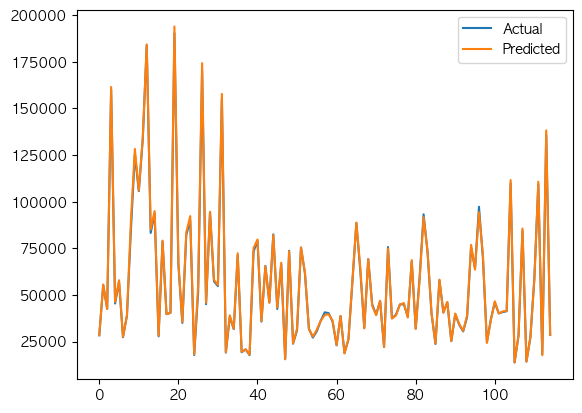

In [50]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")
models = {
    #'Linear Regression': LinearRegression(),
    #'Ridge Regression': Ridge(),
    #'Lasso Regression': Lasso(),
    #'Elastic Net': ElasticNet(),
    #'Decision Tree': DecisionTreeRegressor(),
    #'Random Forest': RandomForestRegressor(),
    #'Gradient Boosting': GradientBoostingRegressor(),
    #'SVR': SVR(),
    #'K-Nearest Neighbors': KNeighborsRegressor(),
    'Neural Network': MLPRegressor(max_iter=5000)
}



def future_prediction1(df,model):
    features = df[['총인구수(명)','총인구수-학령인구(명)','유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수','이혼건수']]
    target = df['학령인구(명)']
    #X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.0, random_state=42)
    
    #model = DecisionTreeRegressor()#n_estimators=50,random_state=42)
    model.fit(features, target)

    #y_pred = model.predict(X_test)
    #print(y_pred)

    return model

cluster1 = split_by_region(sort_cluster1)
coll = ['총인구수(명)', '총인구수-학령인구(명)','유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수', '이혼건수']#,'총인구수-학령인구(명)']

    #print(df_log[i])
cluster_df1_2022 = cluster_df1_2022.sort_values(by=['행정구역'])

actual_value = cluster_df1_2022['학령인구(명)'].tolist()


df_log = []
for i in range(len(cluster1)):
    df_log.append(cluster1[i].applymap(lambda x: np.log(x) if isinstance(x, (int, float)) else x))

while 1:
    cluster1 = split_by_region(sort_cluster1)
    for name, model in models.items():
        predict_not_scholar_population_rf = []
        model = MLPRegressor(max_iter=5000)
        model1 = future_prediction1(cluster_df1,model)
        print()
        for i in range(len(df_log)):

            test = run_ARIMA(df_log[i])
            test = test.reset_index()
            
            print("◼", end = ' ')
 
            test = test.applymap(lambda x: np.exp(x) if isinstance(x, (int, float)) else x)
    
            for j in range(len(test)):
                test.loc[j,'총인구수-학령인구(명)'] = float(test.loc[j,'총인구수(명)']) - float(test.loc[j,'학령인구(명)'])
      

            xx = model1.predict(np.array(test[coll]).reshape(-1,len(coll)))
            predict_not_scholar_population_rf.append(float(round(xx[0])))
            for j in range(len(test)):
                #test.loc[j,'총인구수-학령인구(명)'] = float(round(x[j]))
                test.loc[j,'학령인구(명)'] = float(xx[j])
                test['행정구역'] = str(cluster1[i]['행정구역'].unique()[0])
            cluster1[i] = pd.concat([cluster1[i],test], ignore_index=True)
            cluster1[i] = cluster1[i].drop(['index'],axis=1)

        print('\n', name)
        mape = mean_absolute_percentage_error(actual_value,predict_not_scholar_population_rf)
                
    print("Mape: ", mape)
    if mape <= 1.24:
        break;
    
vis1(actual_value,predict_not_scholar_population_rf)
    #'[INFO]PREDICT',year+_,'FINISH')


In [51]:
cluster1[0]

,행정구역,연도,총인구수(명),총인구수-학령인구(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명)
0,강원특별자치도 강릉시,2010.000000,218503.000000,175401.000000,40.000000,35.000000,1641.000000,1413.000000,1071.000000,487.000000,43102.000000
1,강원특별자치도 강릉시,2011.000000,217571.000000,175611.000000,40.000000,35.000000,1671.000000,1434.000000,1140.000000,496.000000,41960.000000
2,강원특별자치도 강릉시,2012.000000,217741.000000,176152.000000,40.000000,35.000000,1636.000000,1490.000000,1107.000000,475.000000,41589.000000
3,강원특별자치도 강릉시,2013.000000,216806.000000,176048.000000,40.000000,35.000000,1460.000000,1471.000000,1026.000000,528.000000,40758.000000
4,강원특별자치도 강릉시,2014.000000,215807.000000,176462.000000,41.000000,35.000000,1298.000000,1539.000000,983.000000,473.000000,39345.000000
5,강원특별자치도 강릉시,2015.000000,214560.000000,176955.000000,44.000000,35.000000,1402.000000,1553.000000,977.000000,481.000000,37605.000000
6,강원특별자치도 강릉시,2016.000000,213846.000000,177733.000000,38.000000,35.000000,1236.000000,1545.000000,920.000000,465.000000,36113.000000
7,강원특별자치도 강릉시,2017.000000,213952.000000,179172.000000,38.000000,35.000000,1084.000000,1529.000000,924.000000,444.000000,34780.000000
8,강원특별자치도 강릉시,2018.000000,212957.000000,179407.000000,38.000000,35.000000,1036.000000,1678.000000,876.000000,433.000000,33550.000000
9,강원특별자치도 강릉시,2019.000000,213442.000000,180929.000000,36.000000,34.000000,964.000000,1720.000000,893.000000,494.000000,32513.000000


강원특별자치도 강릉시


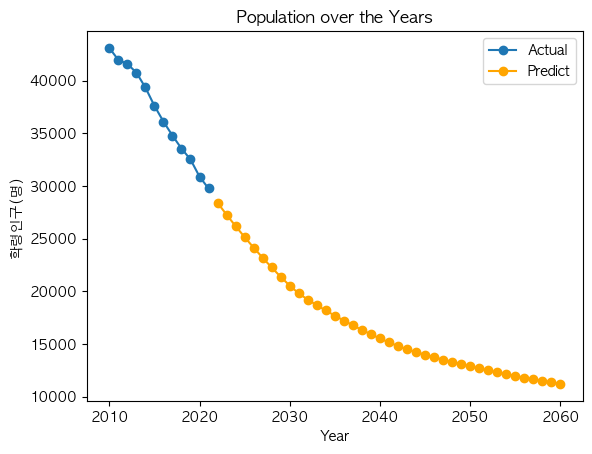

강원특별자치도 원주시


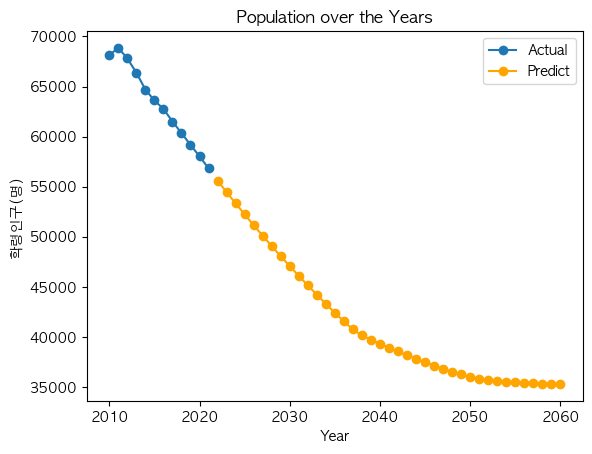

강원특별자치도 춘천시


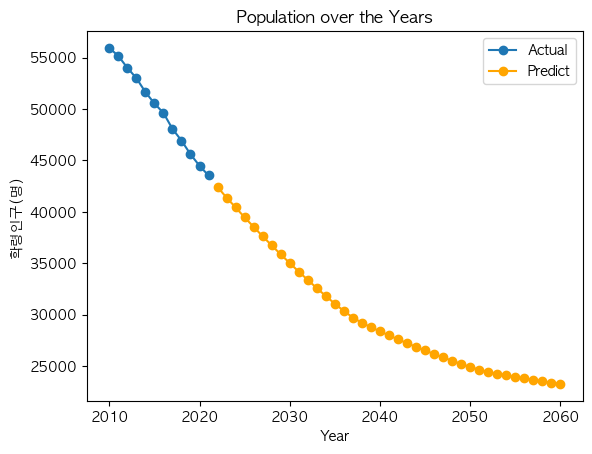

경기도 고양시


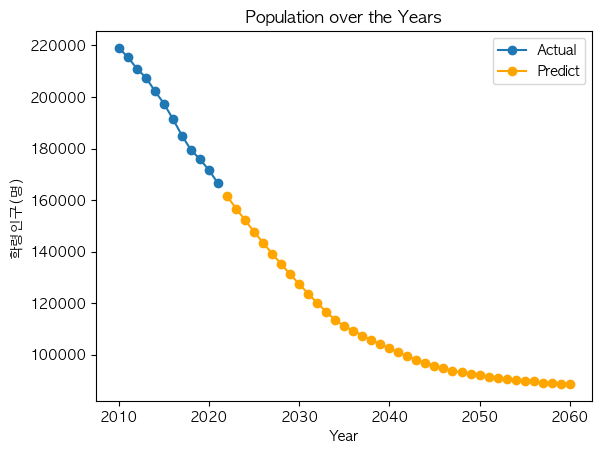

경기도 광명시


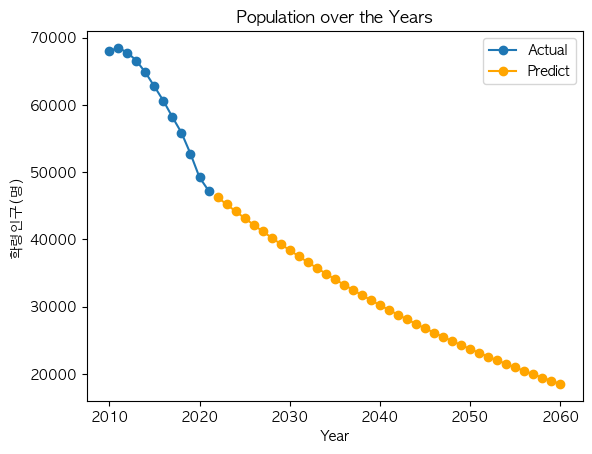

경기도 광주시


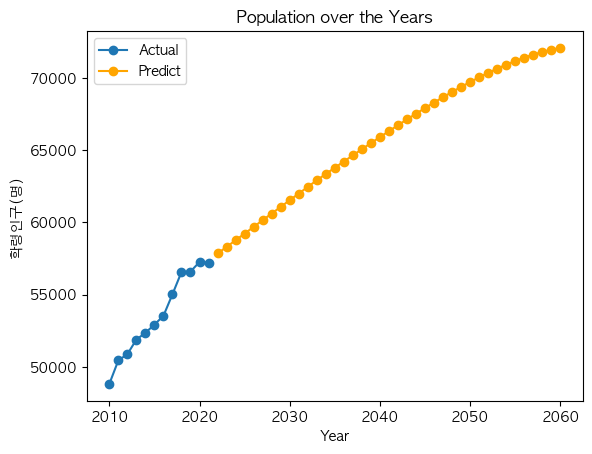

경기도 구리시


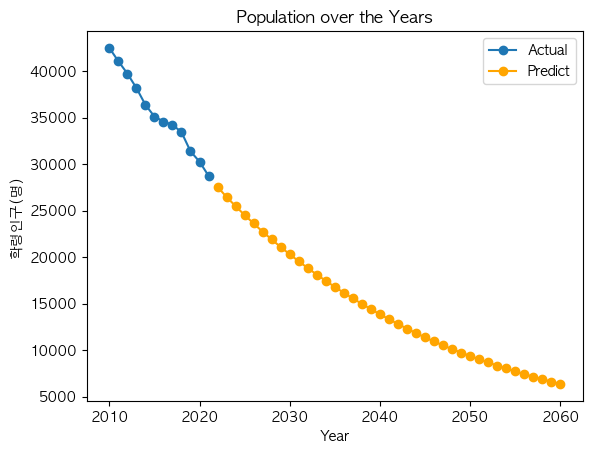

경기도 군포시


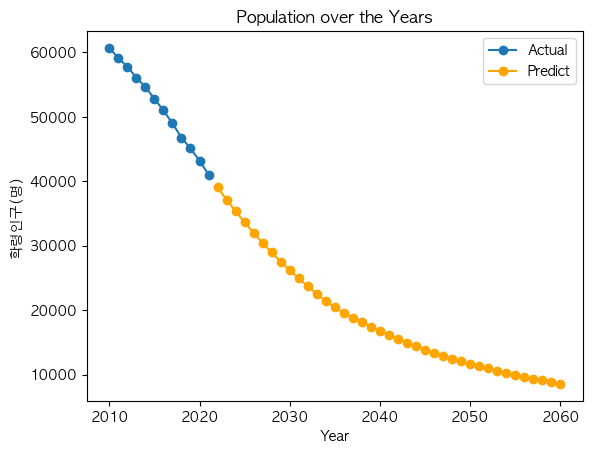

경기도 김포시


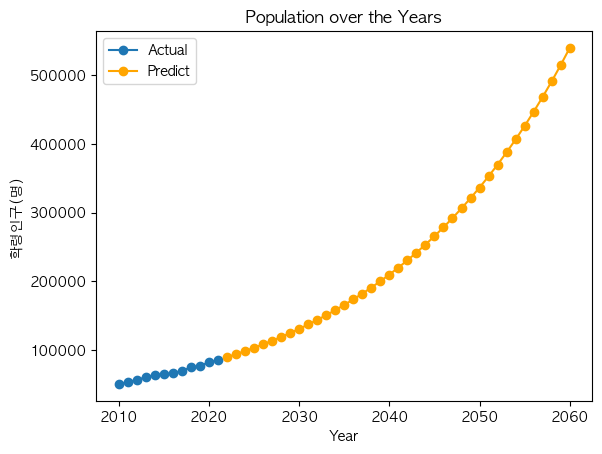

경기도 남양주시


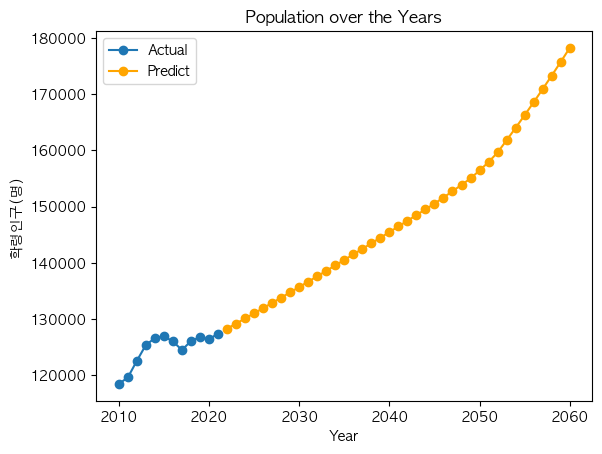

경기도 부천시


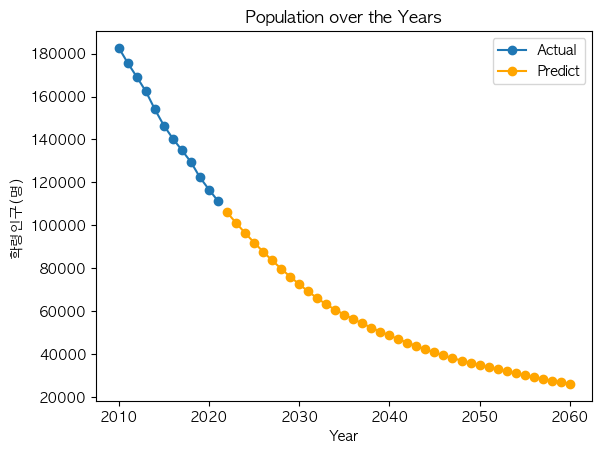

경기도 성남시


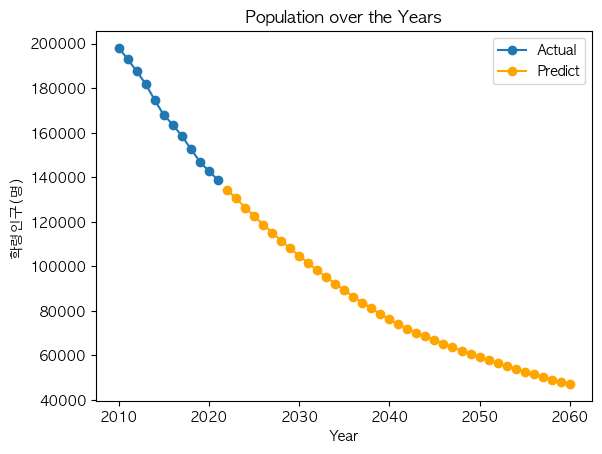

경기도 수원시


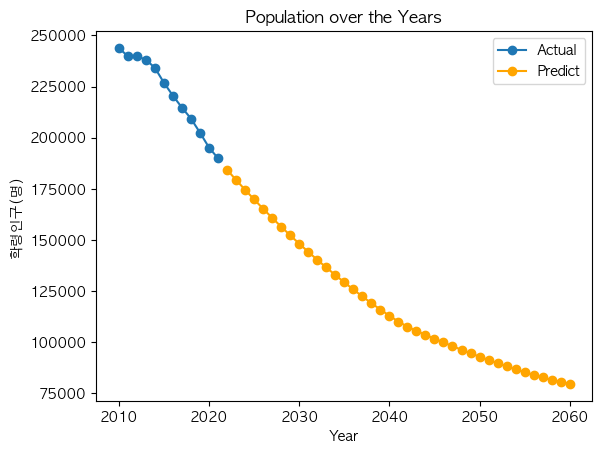

경기도 시흥시


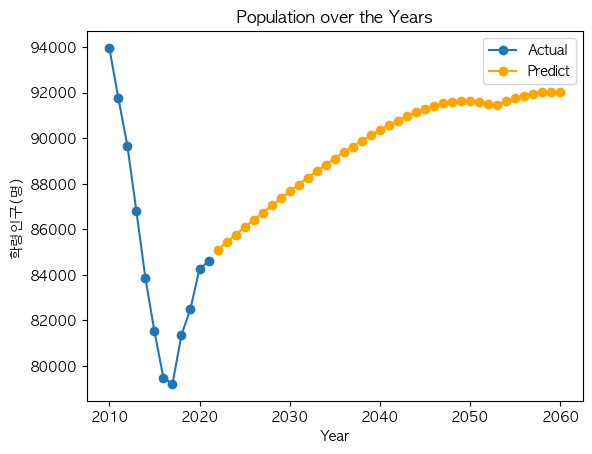

경기도 안산시


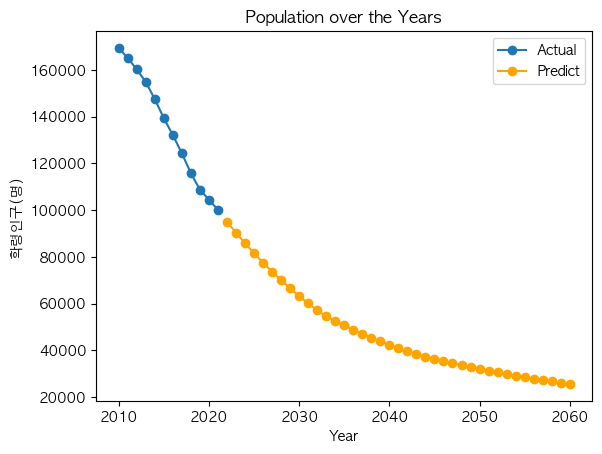

경기도 안성시


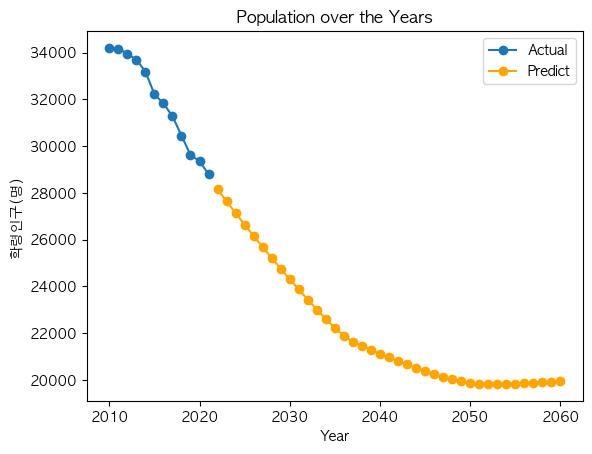

경기도 안양시


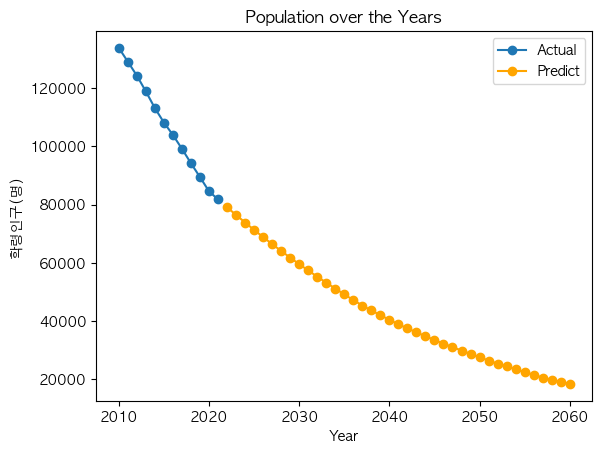

경기도 양주시


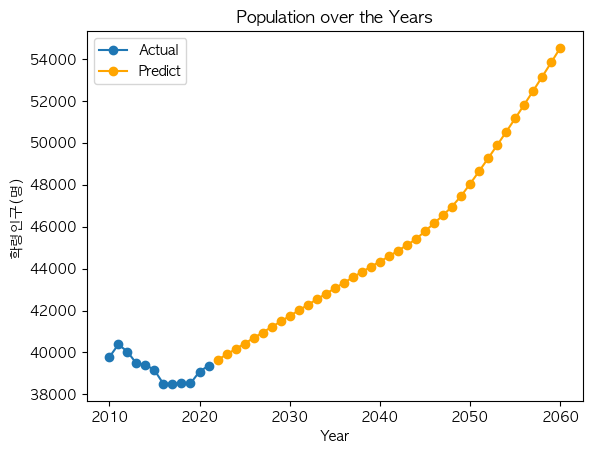

경기도 오산시


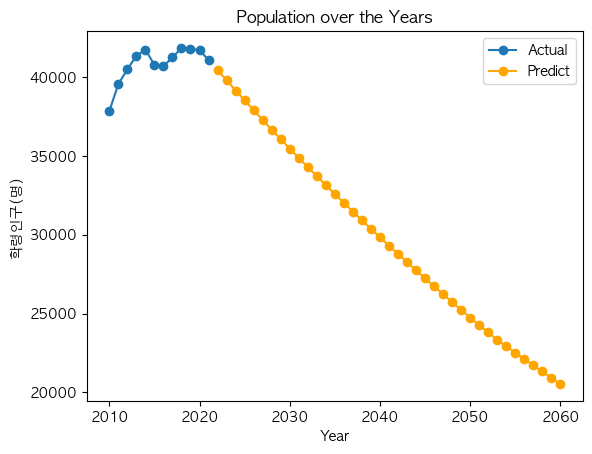

경기도 용인시


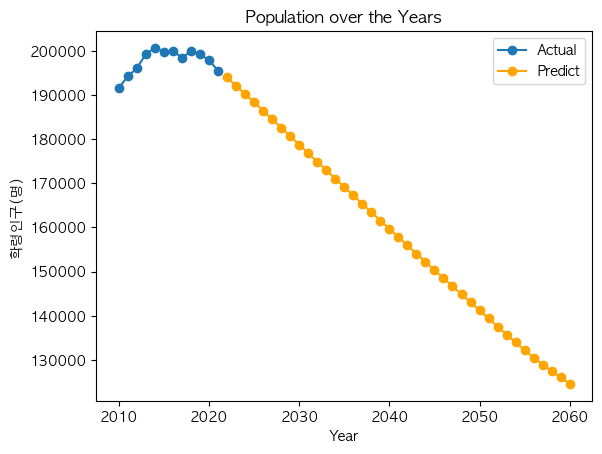

경기도 의정부시


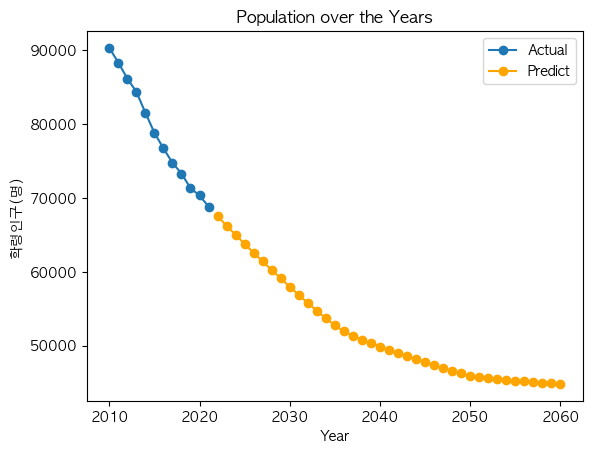

경기도 이천시


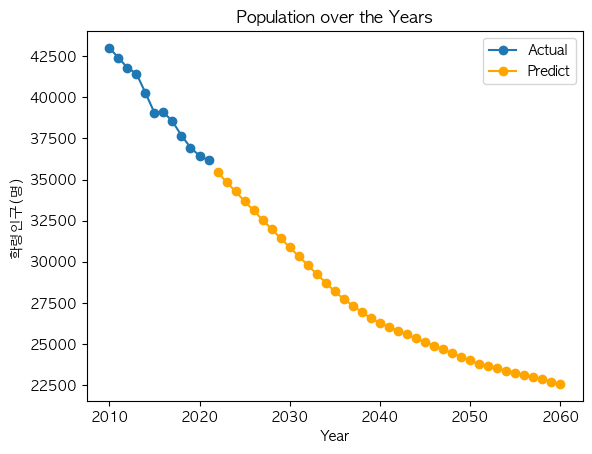

경기도 파주시


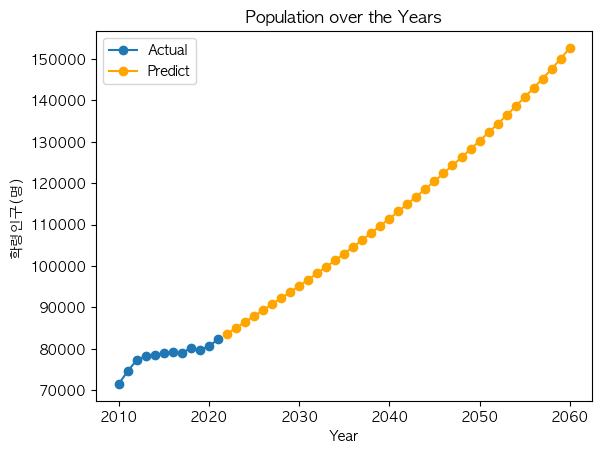

경기도 평택시


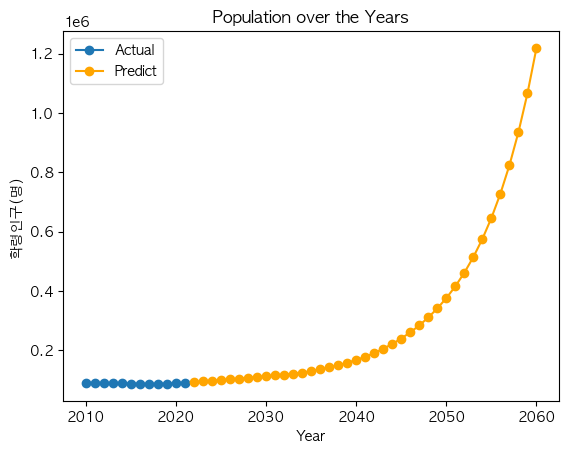

경기도 포천시


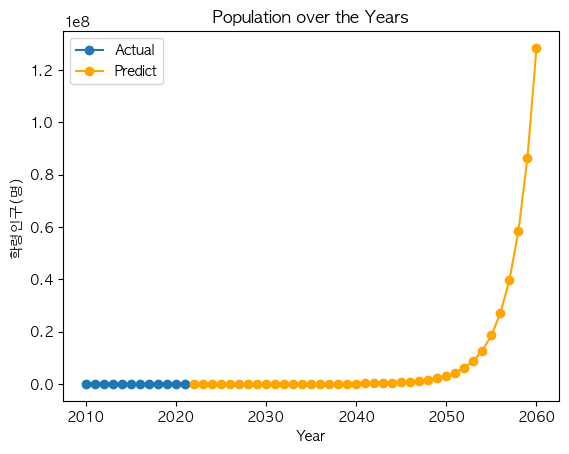

경기도 하남시


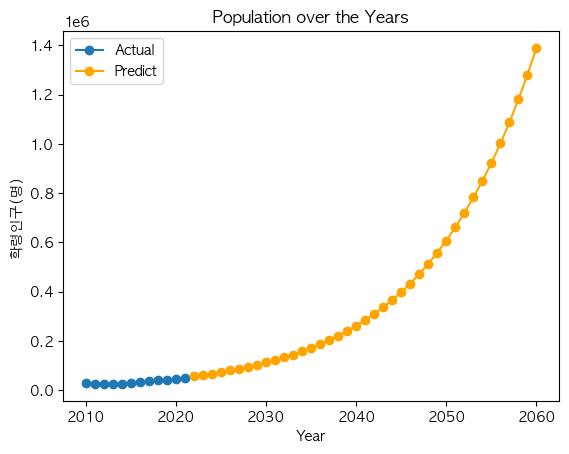

경기도 화성시


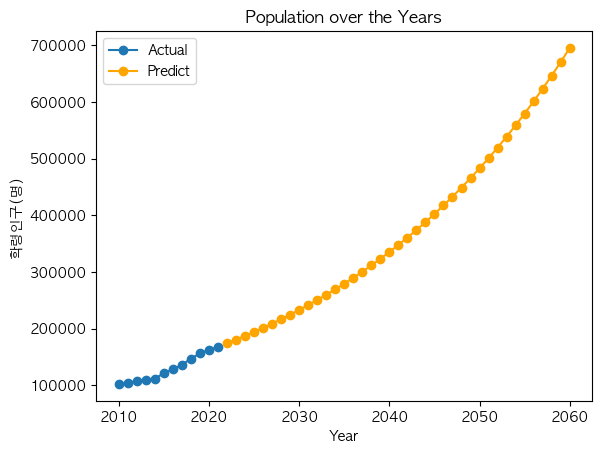

경상남도 거제시


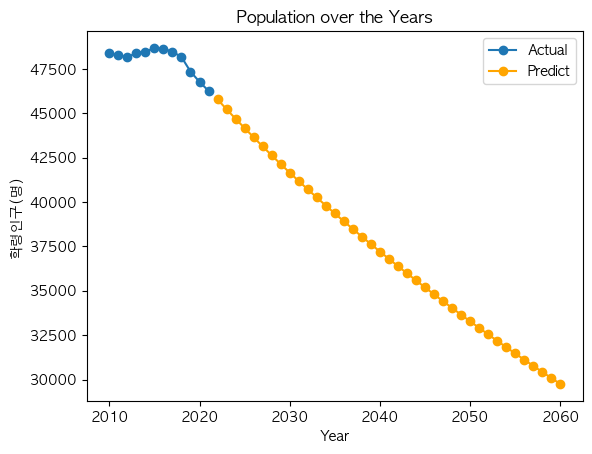

경상남도 김해시


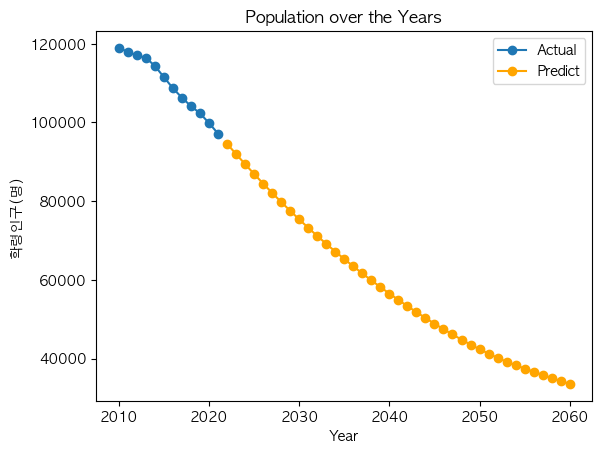

경상남도 양산시


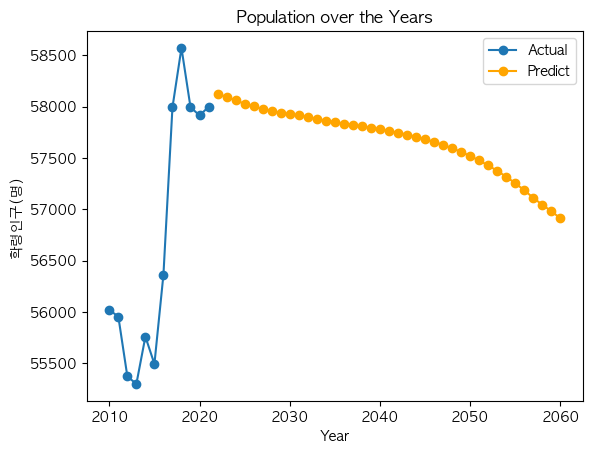

경상남도 진주시


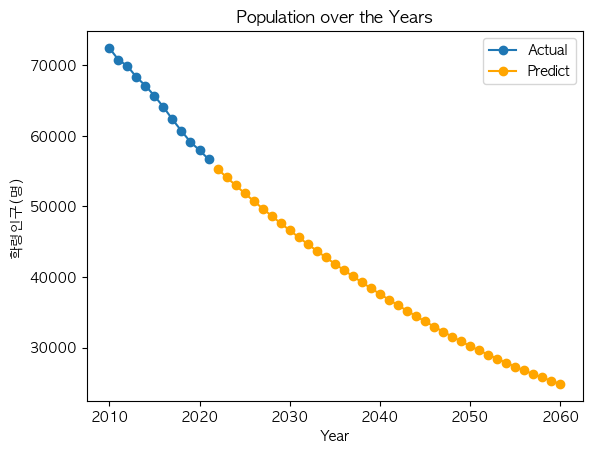

경상남도 창원시


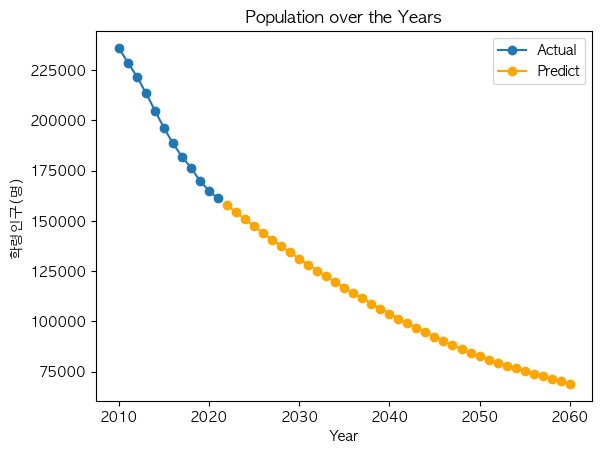

경상남도 통영시


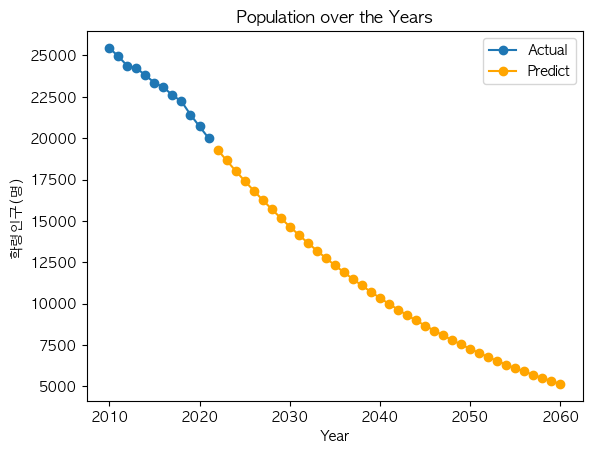

경상북도 경산시


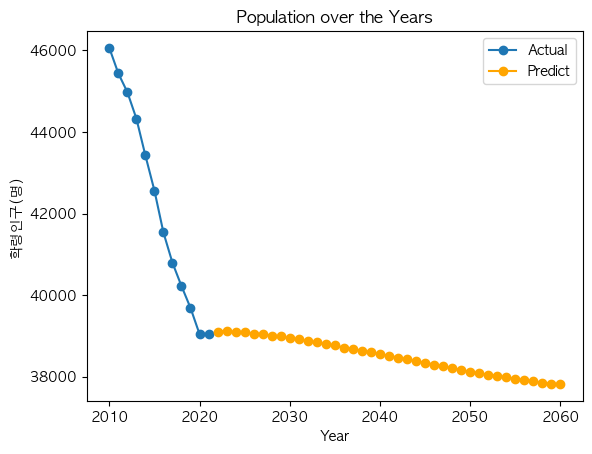

경상북도 경주시


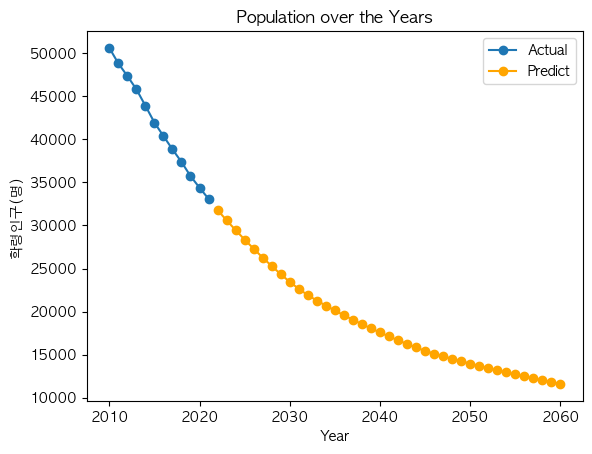

경상북도 구미시


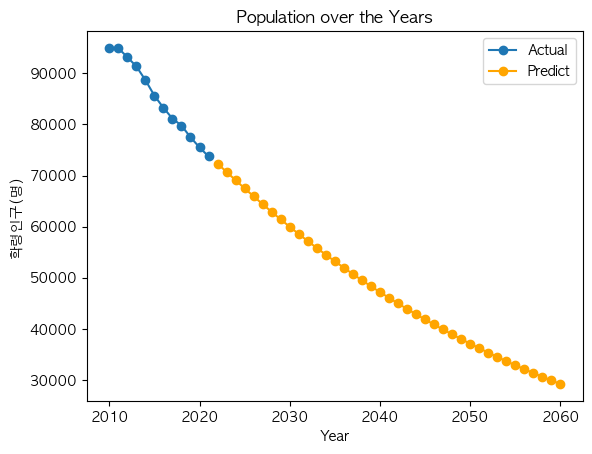

경상북도 김천시


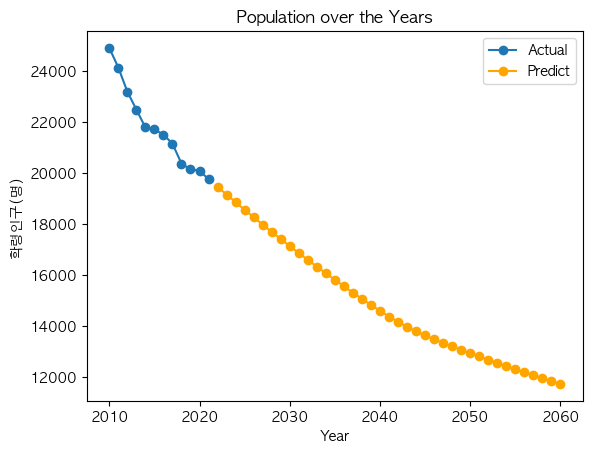

경상북도 안동시


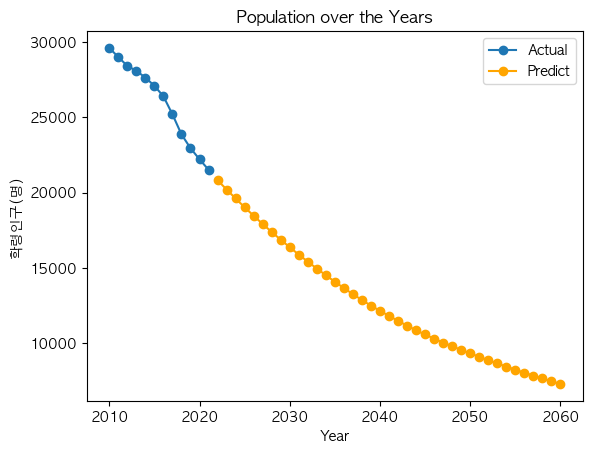

경상북도 칠곡군


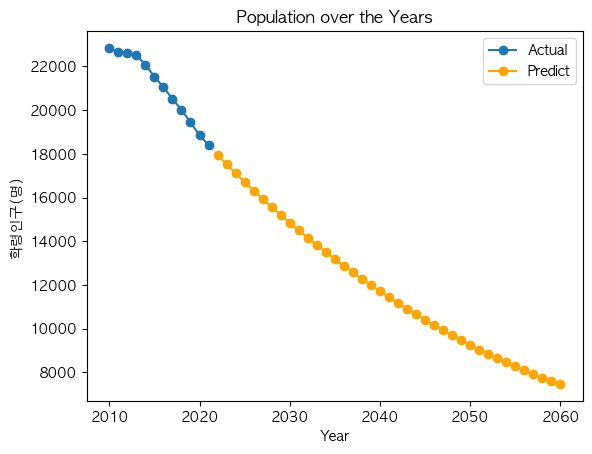

경상북도 포항시


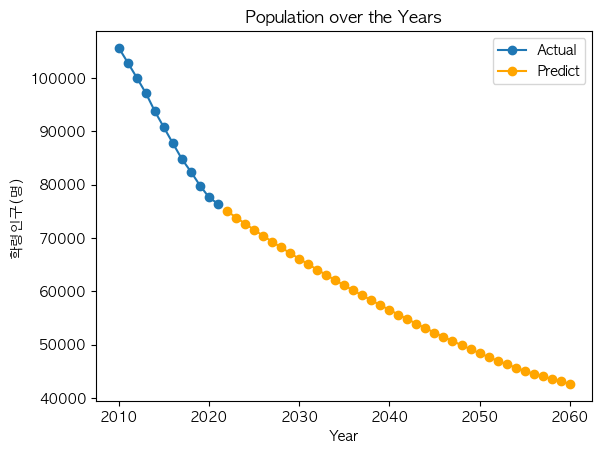

광주광역시 광산구


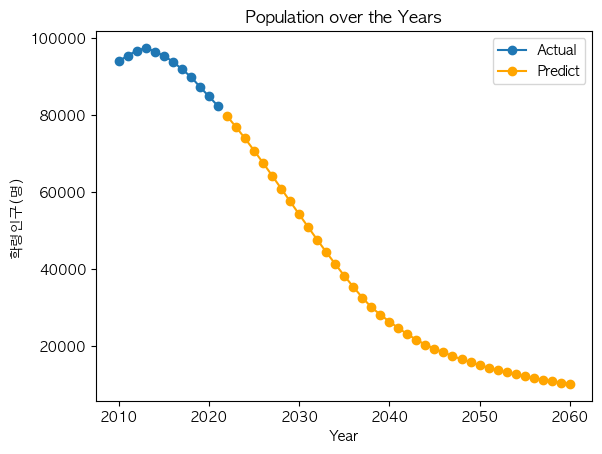

광주광역시 남구


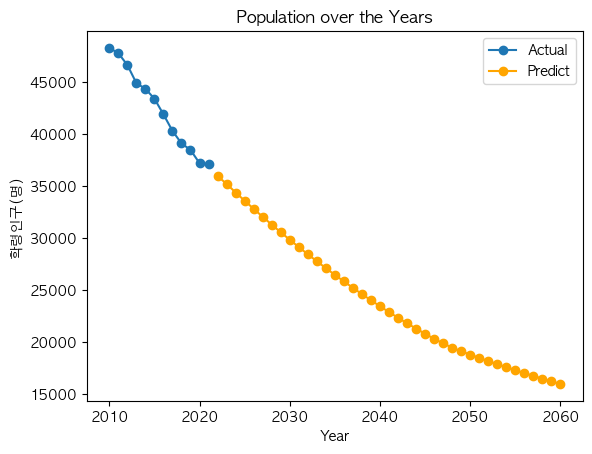

광주광역시 북구


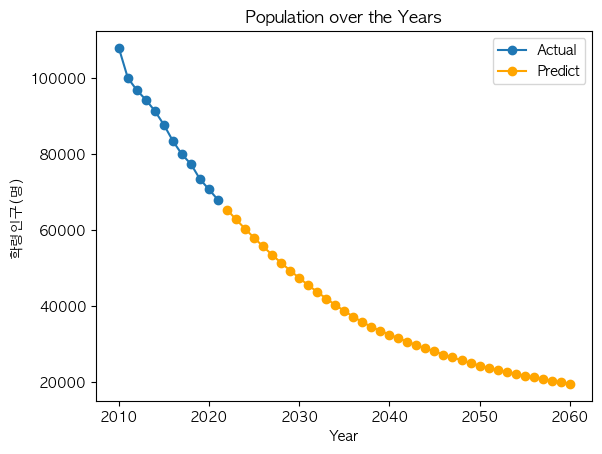

광주광역시 서구


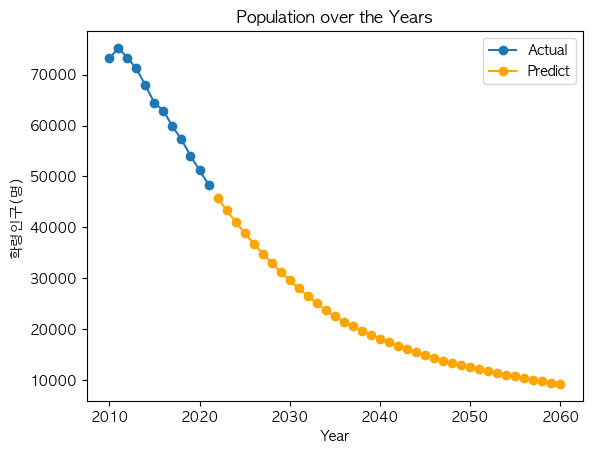

대구광역시 달서구


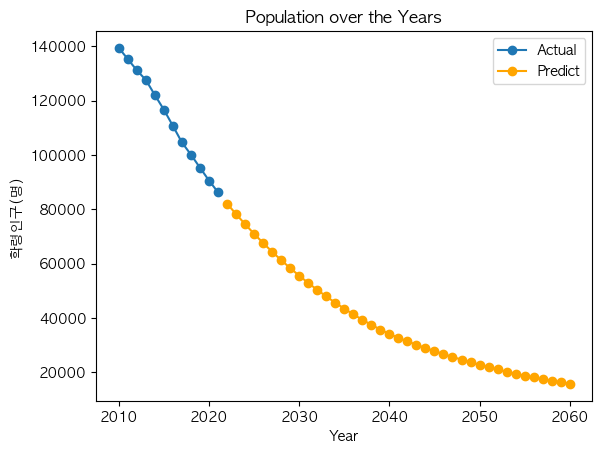

대구광역시 달성군


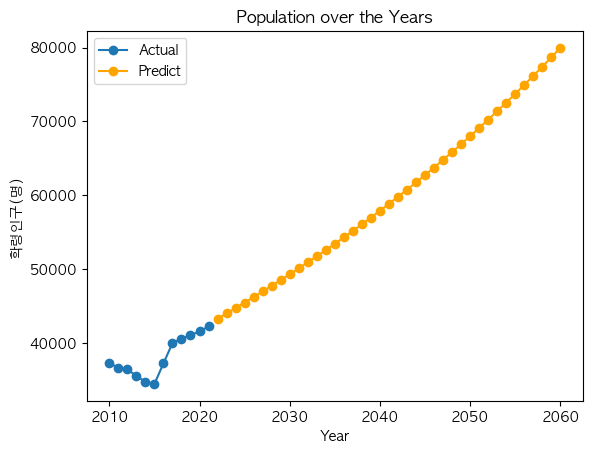

대구광역시 북구


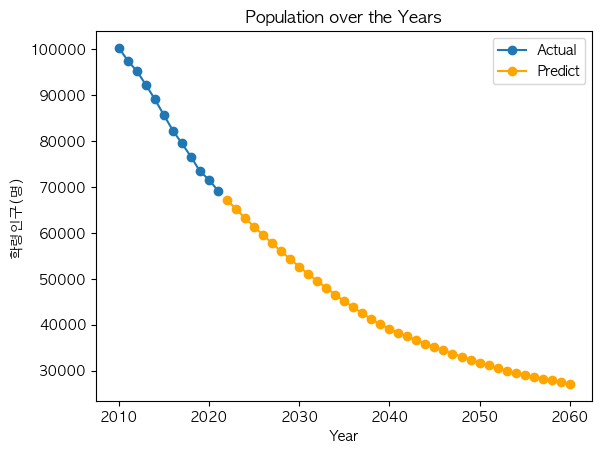

대구광역시 서구


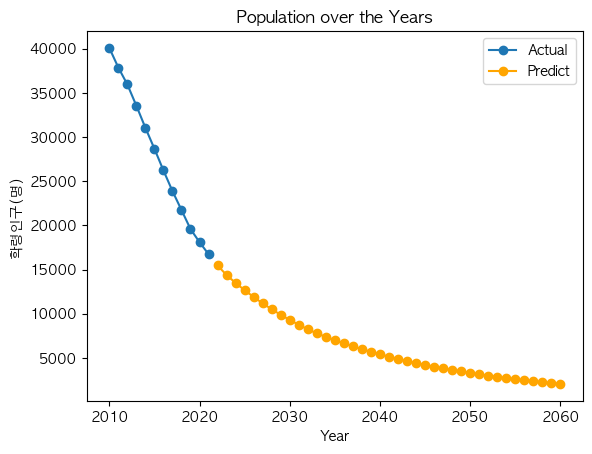

대구광역시 수성구


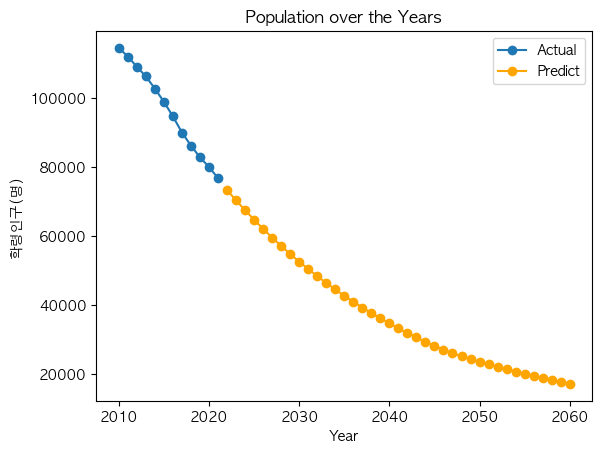

대전광역시 대덕구


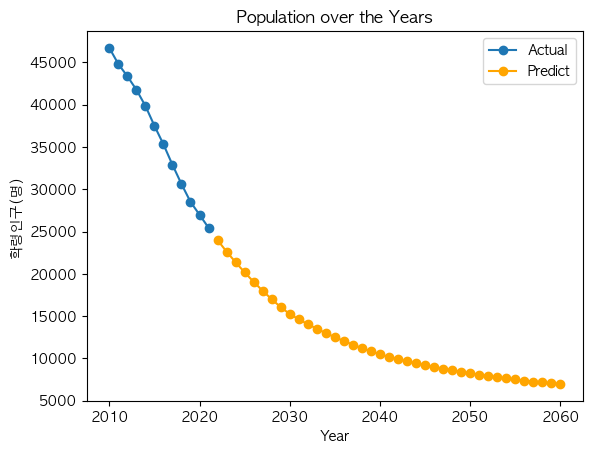

대전광역시 동구


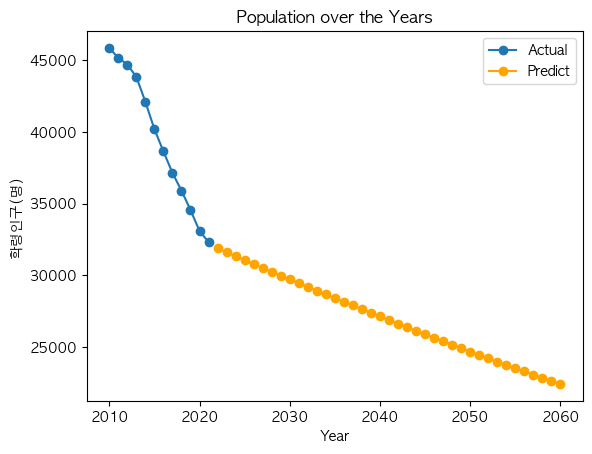

대전광역시 서구


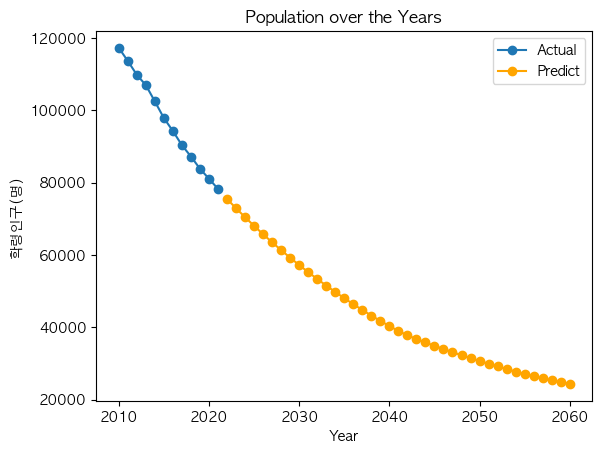

대전광역시 유성구


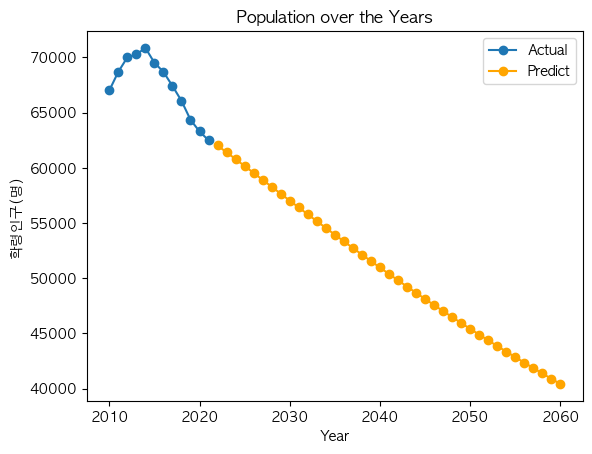

대전광역시 중구


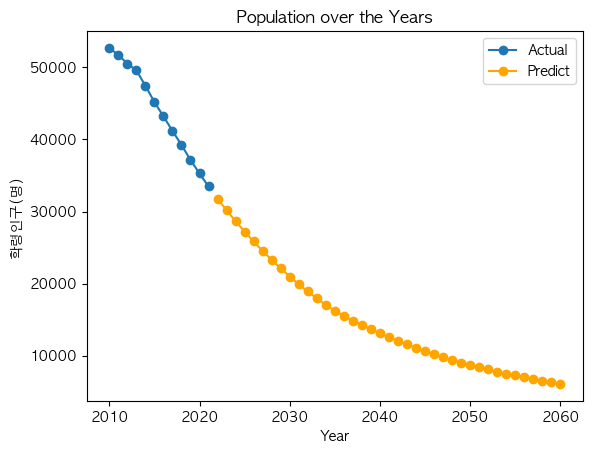

부산광역시 금정구


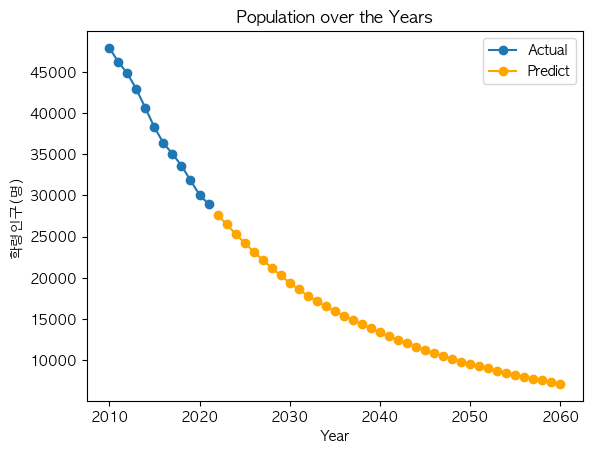

부산광역시 기장군


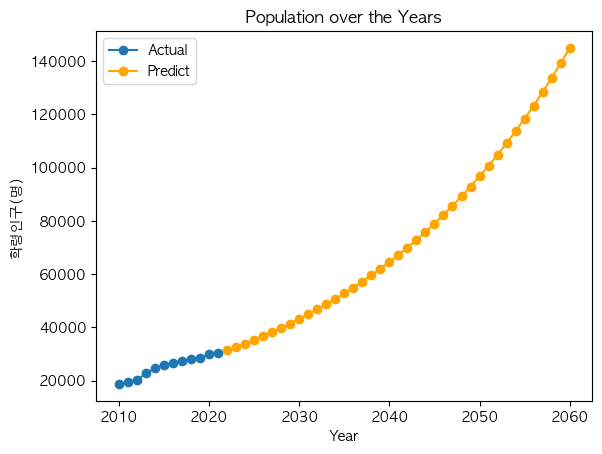

부산광역시 남구


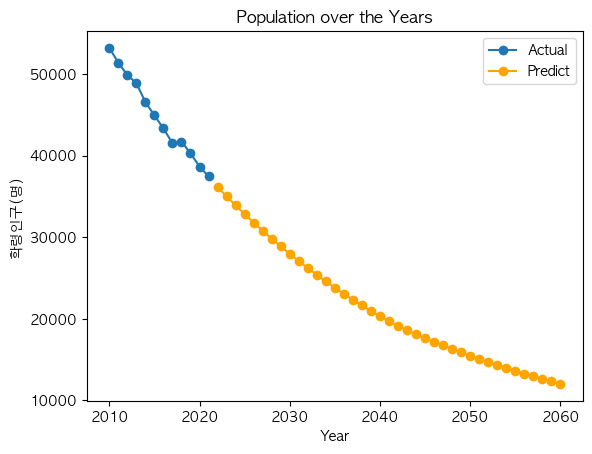

부산광역시 동래구


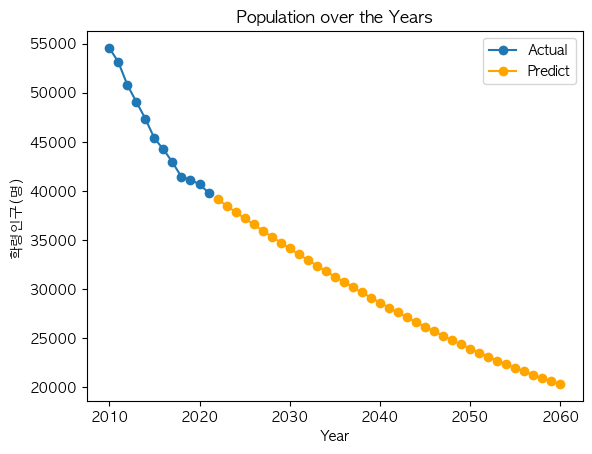

부산광역시 부산진구


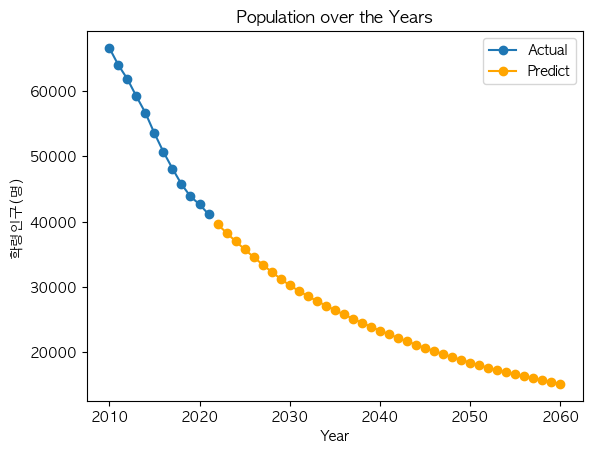

부산광역시 북구


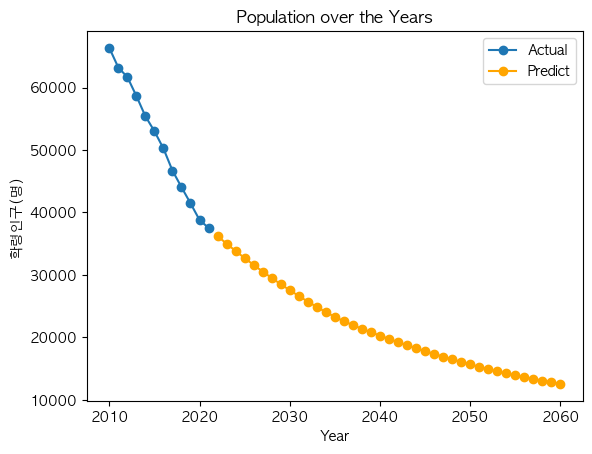

부산광역시 사상구


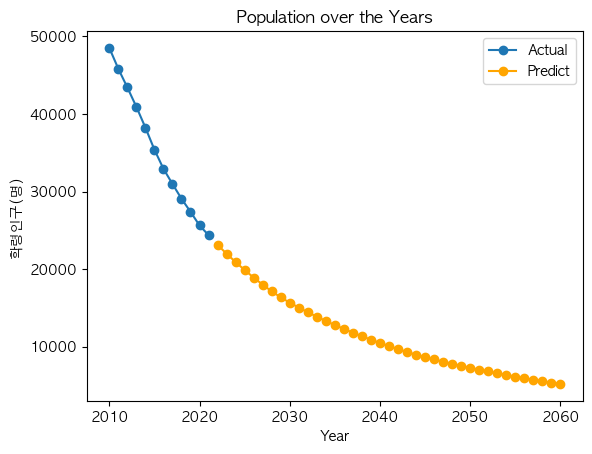

부산광역시 사하구


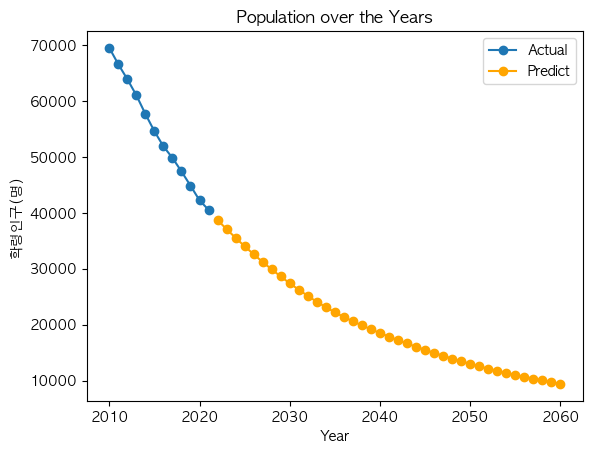

부산광역시 수영구


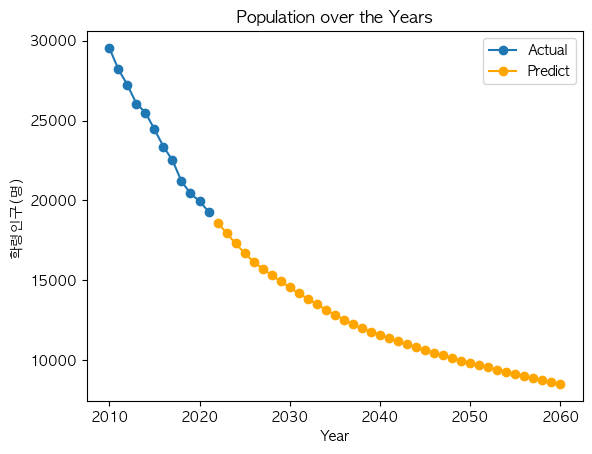

부산광역시 연제구


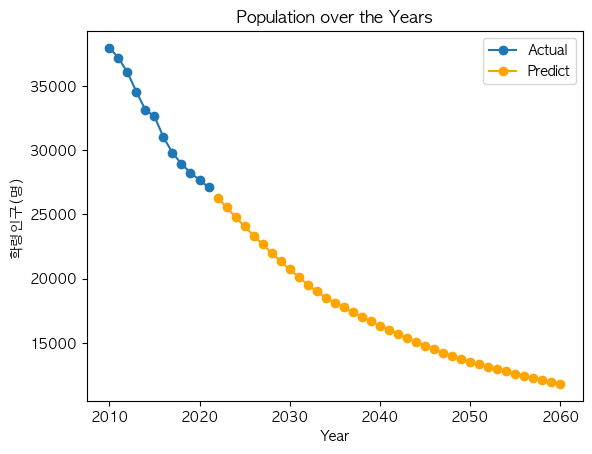

부산광역시 해운대구


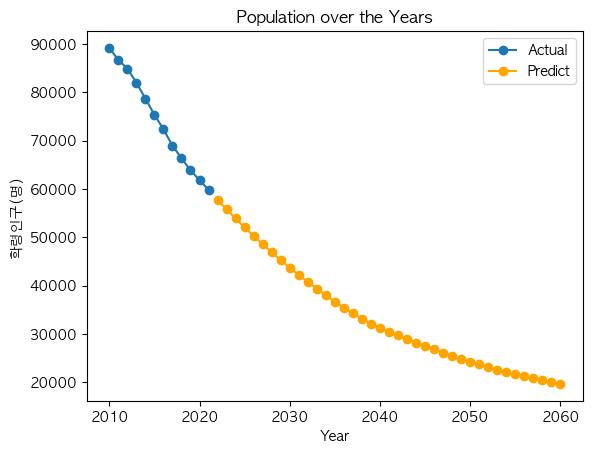

서울특별시 강남구


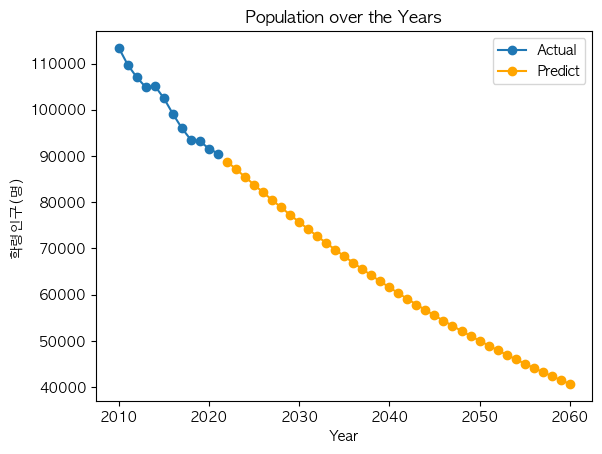

서울특별시 강동구


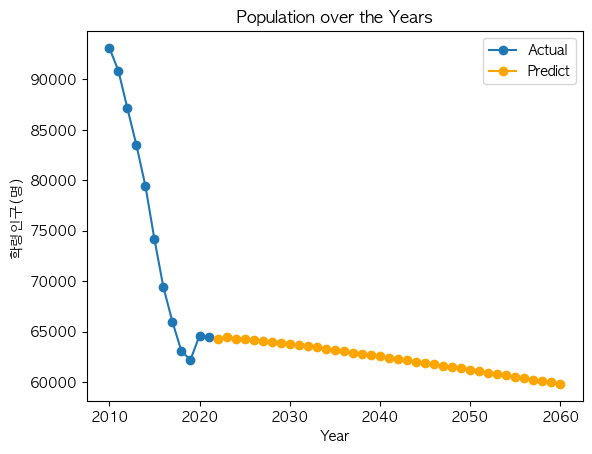

서울특별시 강북구


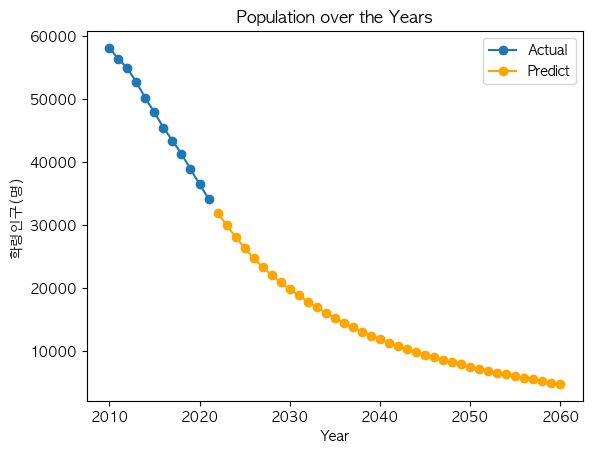

서울특별시 강서구


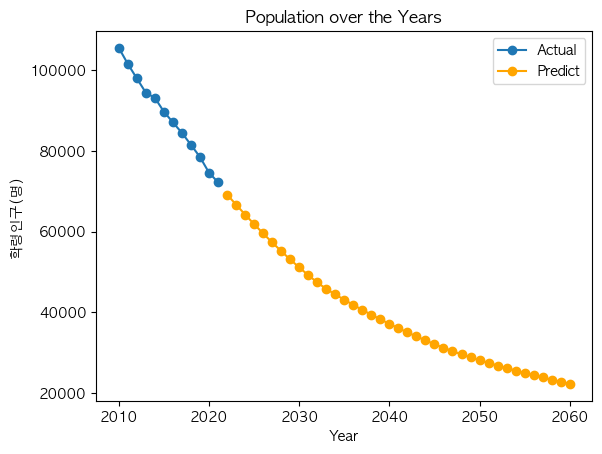

서울특별시 관악구


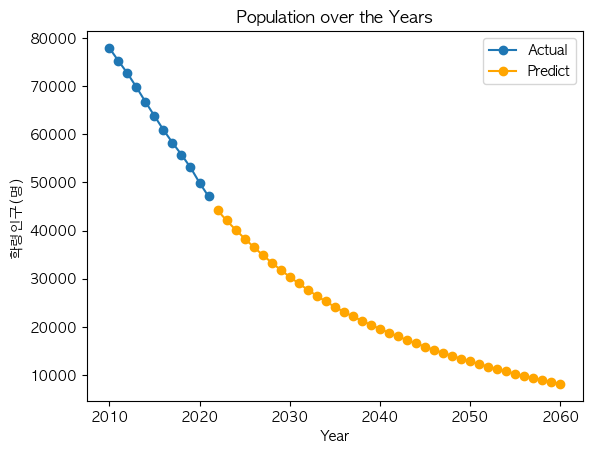

서울특별시 광진구


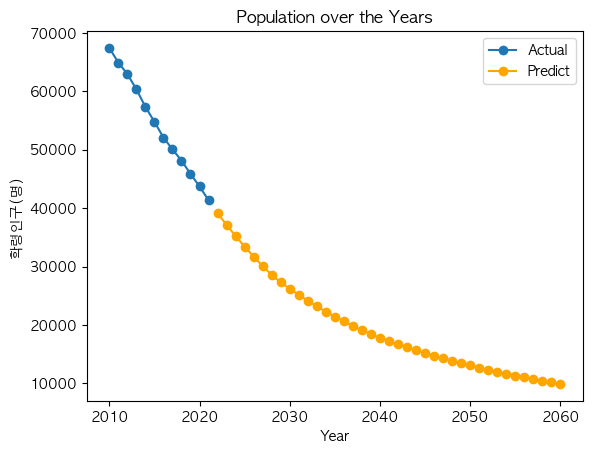

서울특별시 구로구


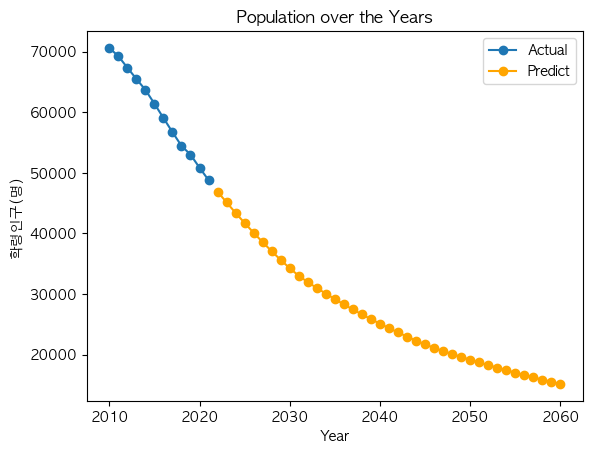

서울특별시 금천구


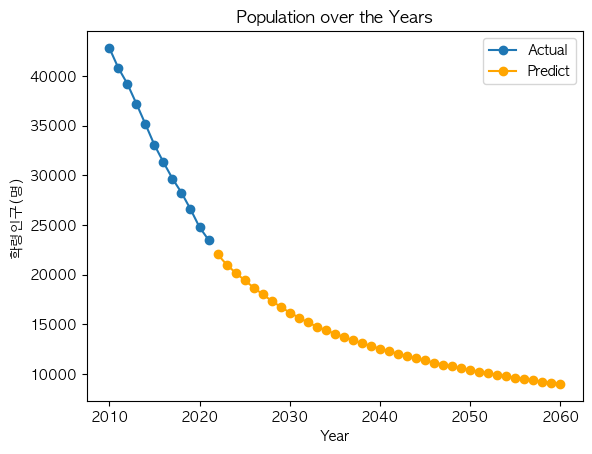

서울특별시 노원구


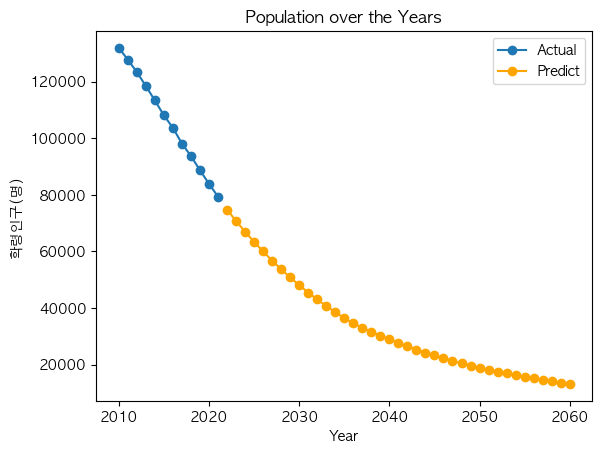

서울특별시 도봉구


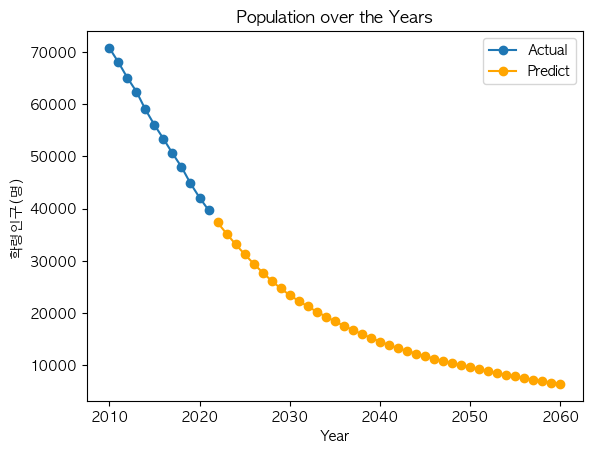

서울특별시 동대문구


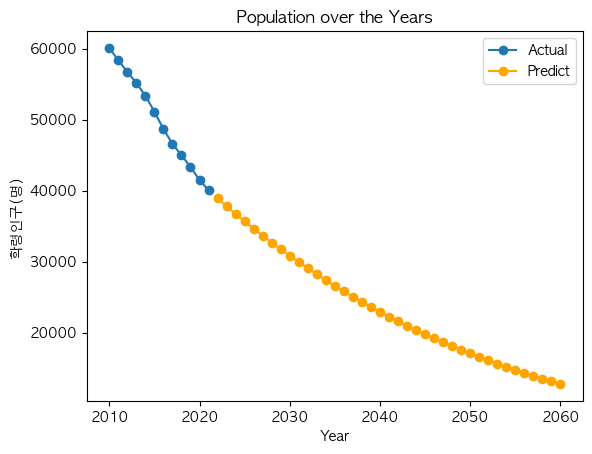

서울특별시 동작구


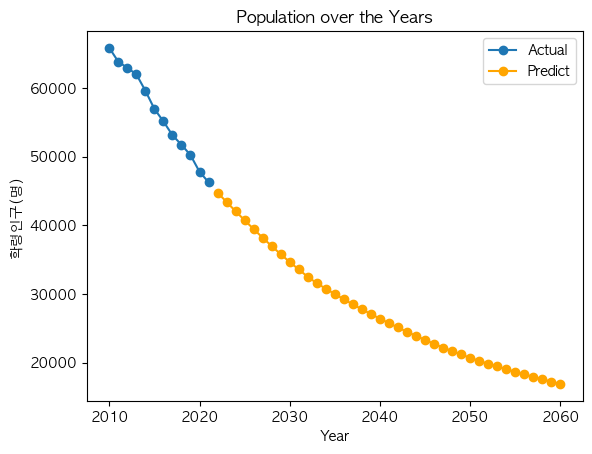

서울특별시 마포구


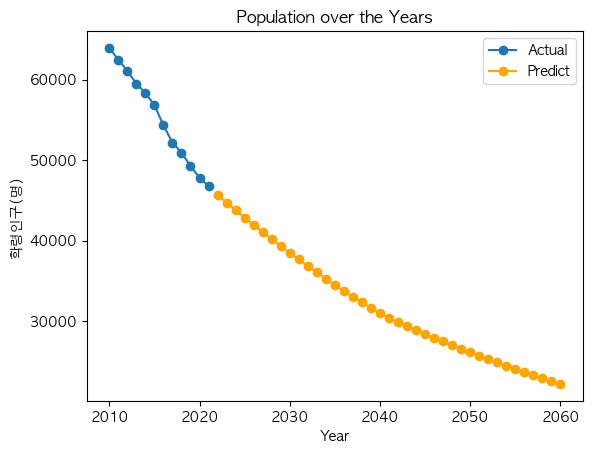

서울특별시 서대문구


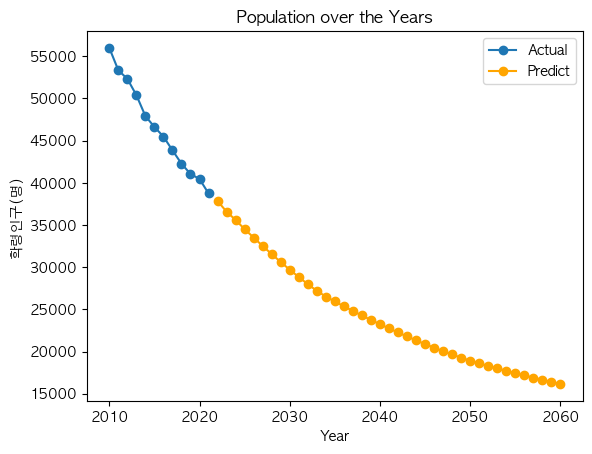

서울특별시 서초구


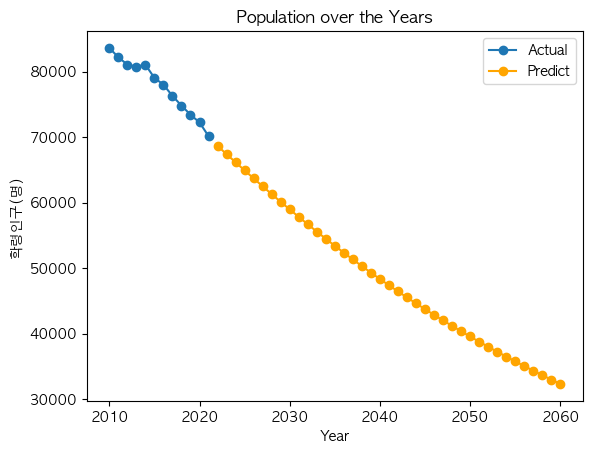

서울특별시 성동구


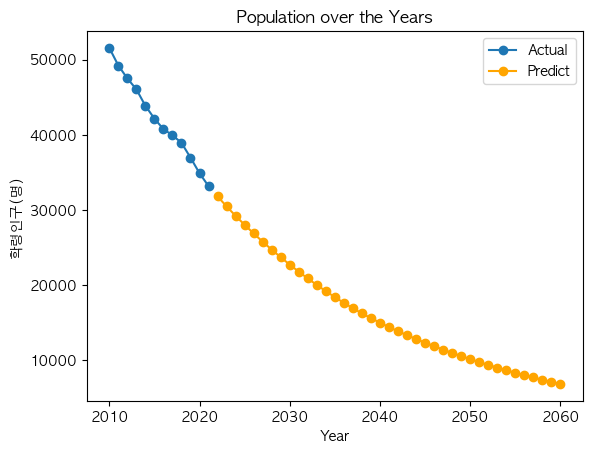

서울특별시 성북구


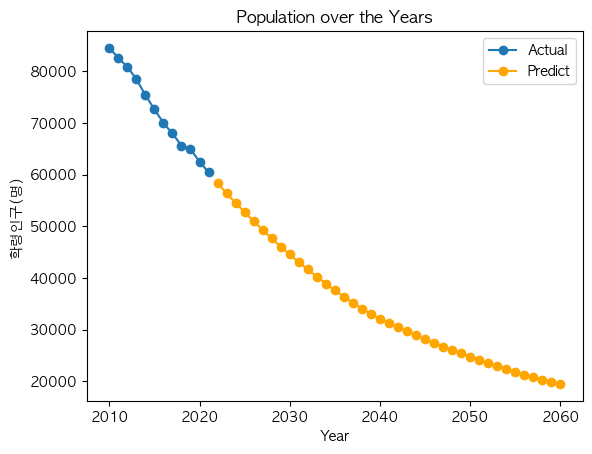

서울특별시 송파구


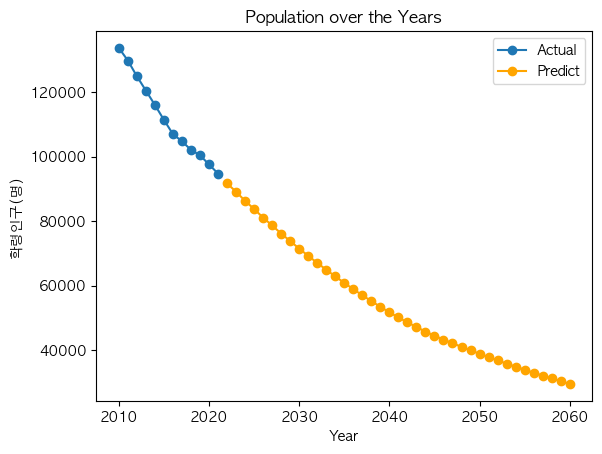

서울특별시 양천구


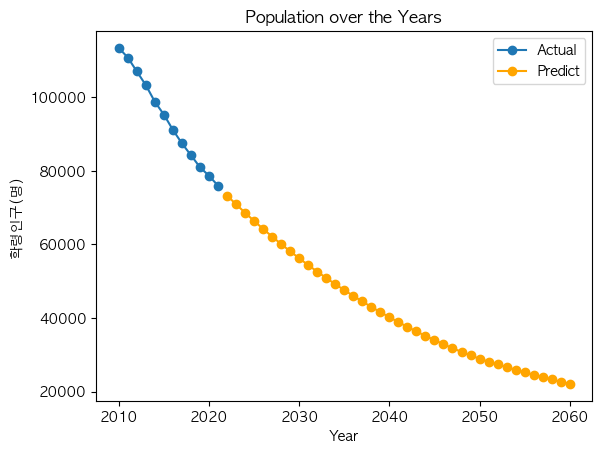

서울특별시 영등포구


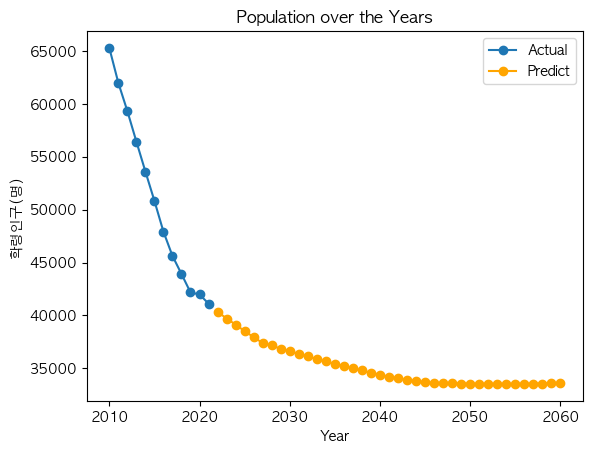

서울특별시 용산구


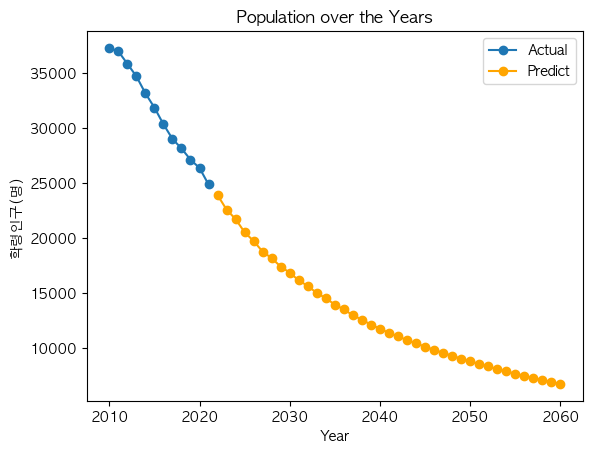

서울특별시 은평구


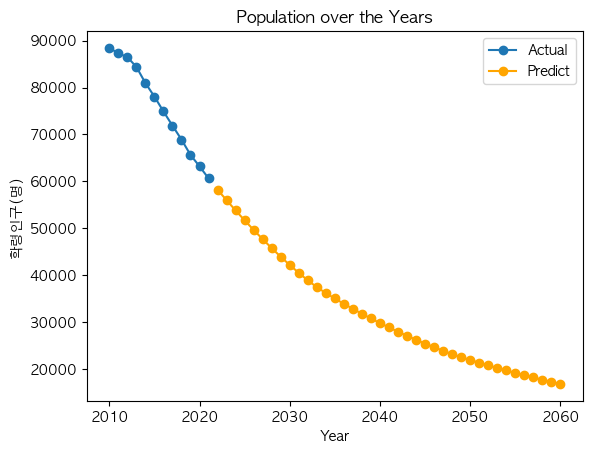

서울특별시 중랑구


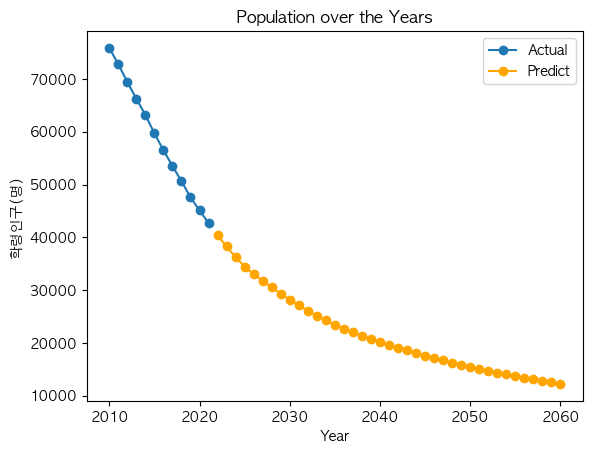

울산광역시 남구


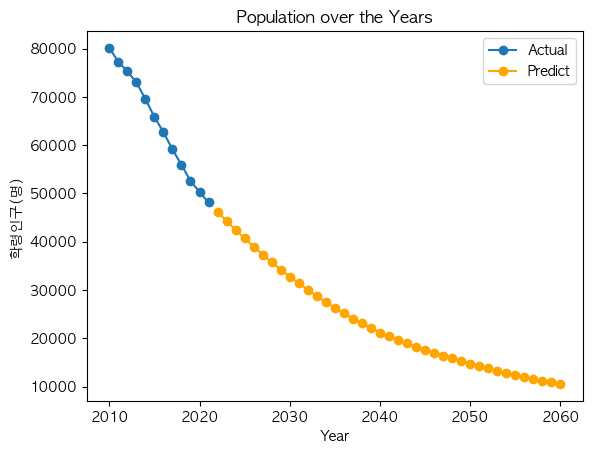

울산광역시 동구


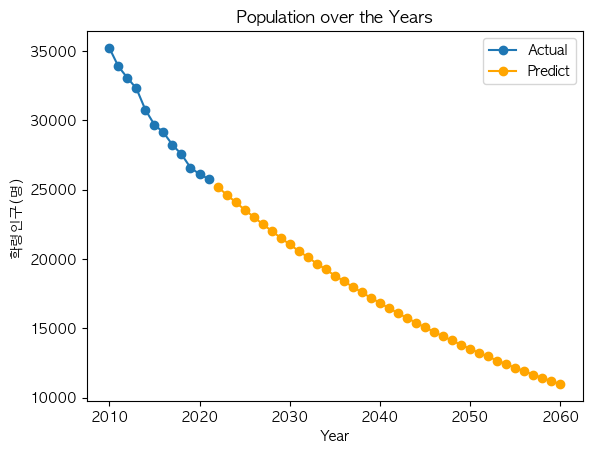

울산광역시 북구


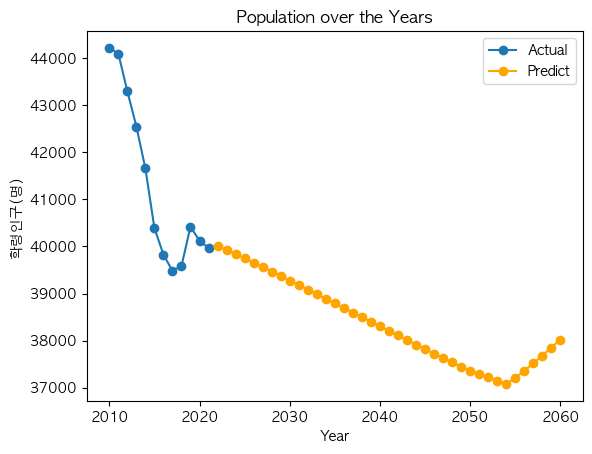

울산광역시 울주군


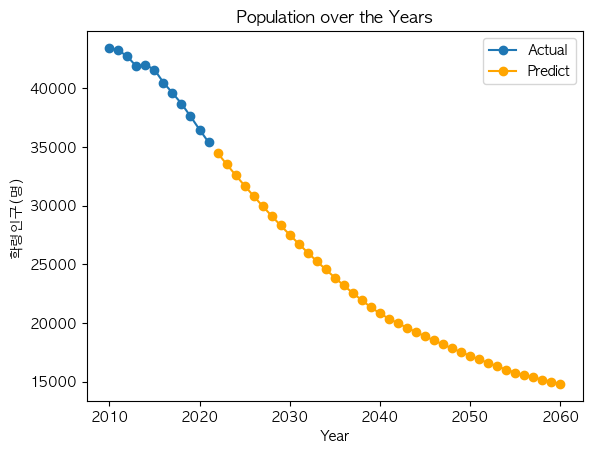

울산광역시 중구


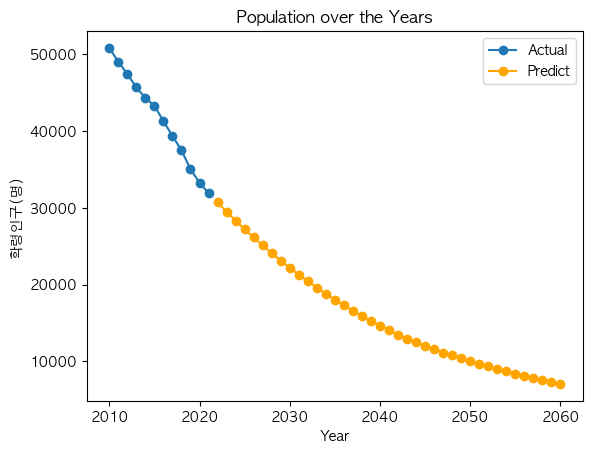

인천광역시 계양구


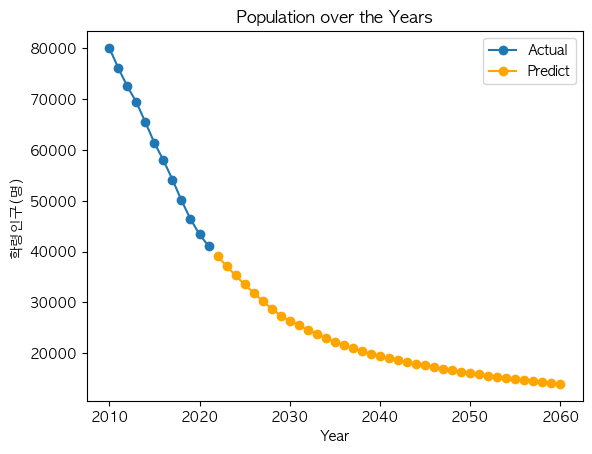

인천광역시 남동구


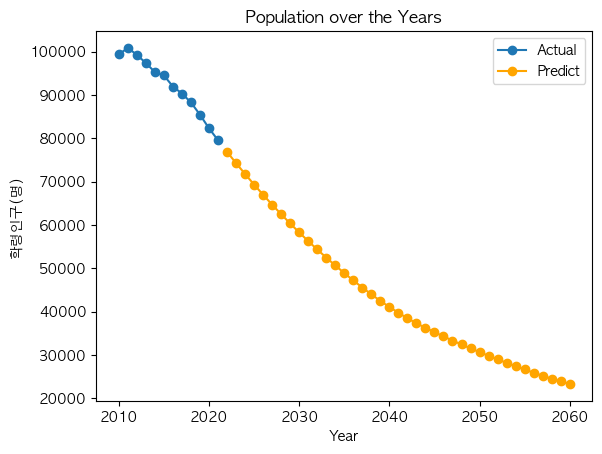

인천광역시 부평구


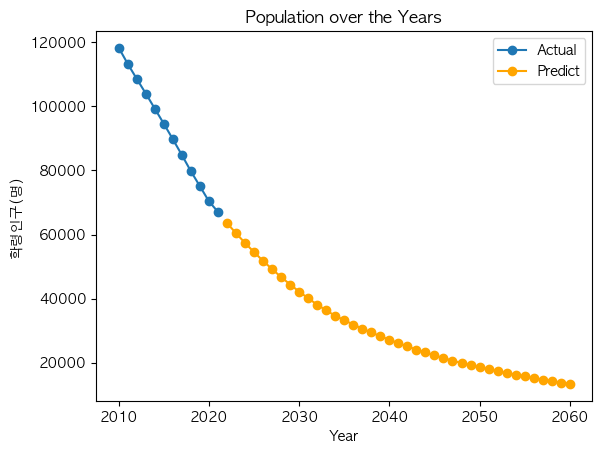

인천광역시 서구


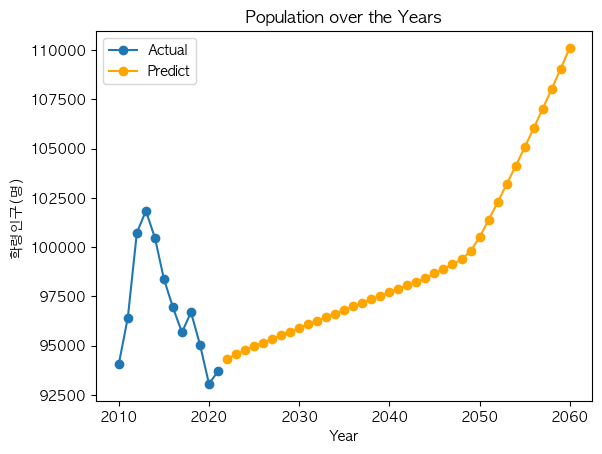

인천광역시 연수구


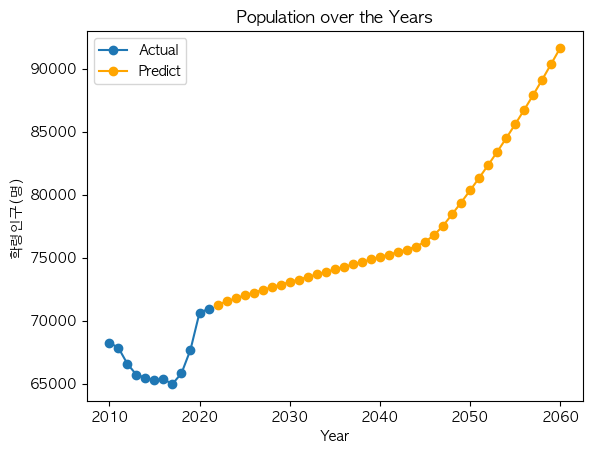

전라남도 광양시


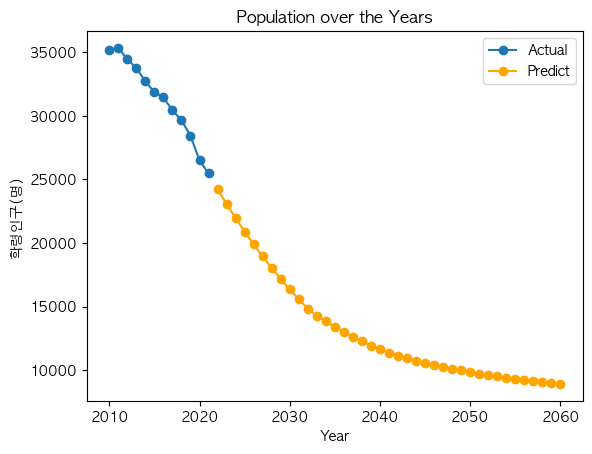

전라남도 목포시


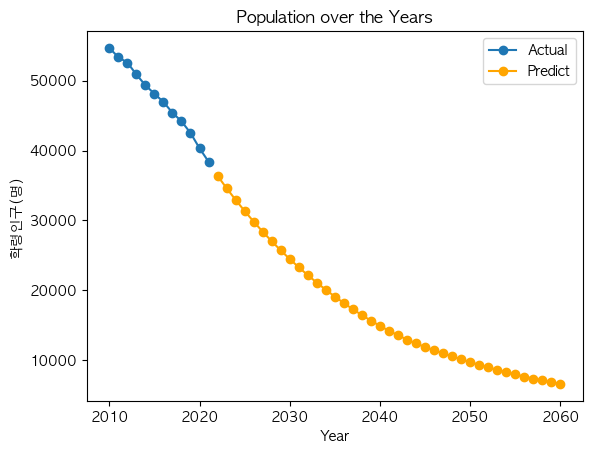

전라남도 순천시


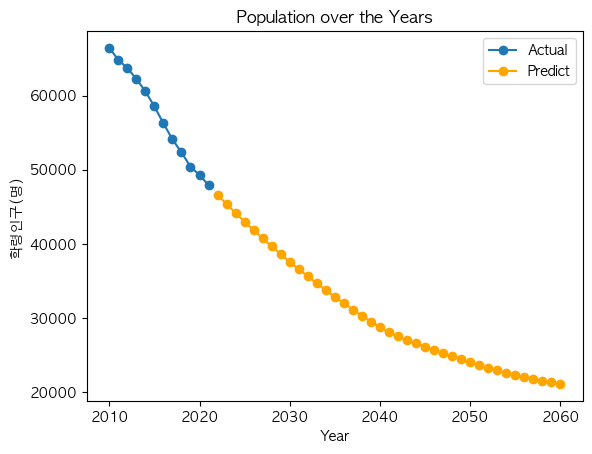

전라남도 여수시


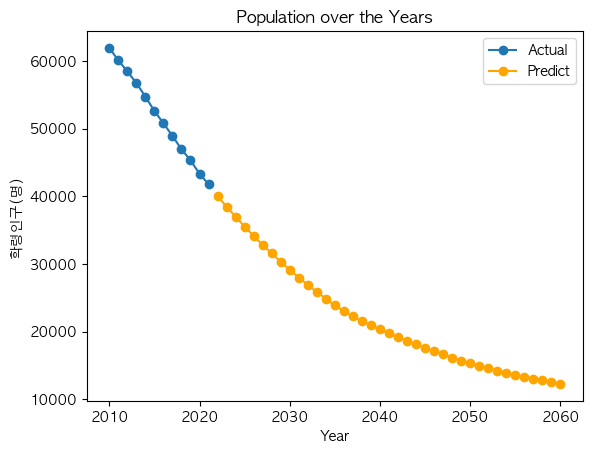

전라북도 군산시


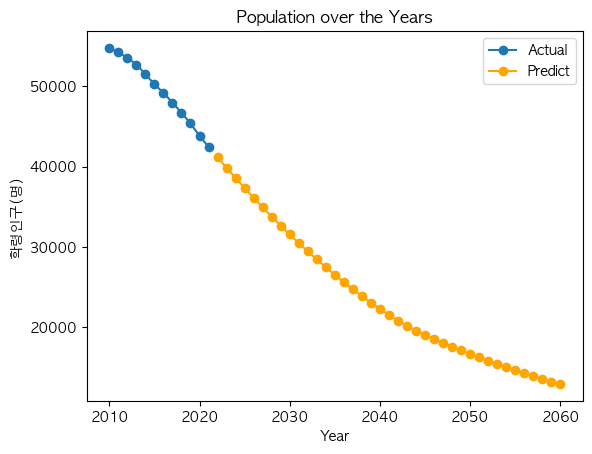

전라북도 익산시


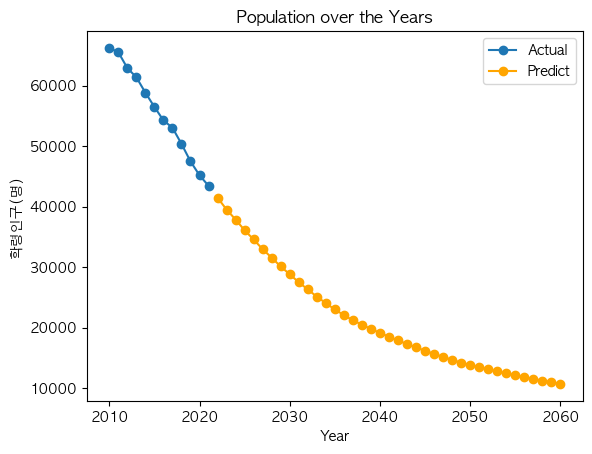

전라북도 전주시


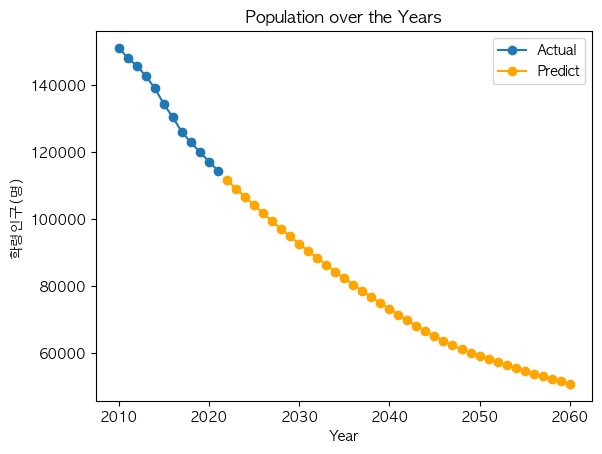

전라북도 정읍시


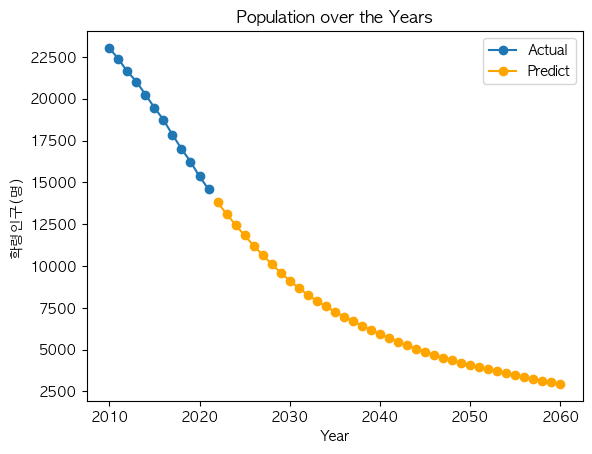

제주특별자치도 서귀포시


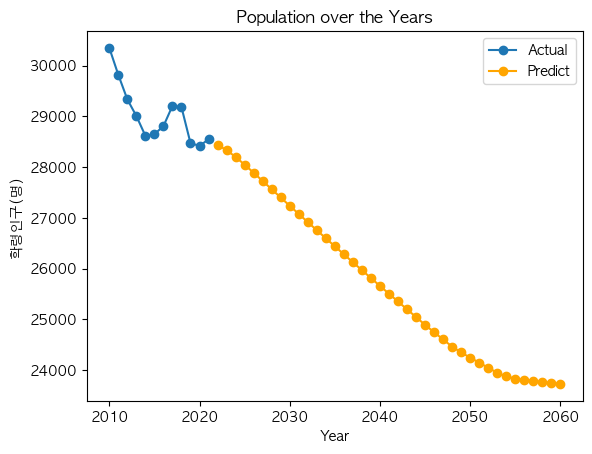

제주특별자치도 제주시


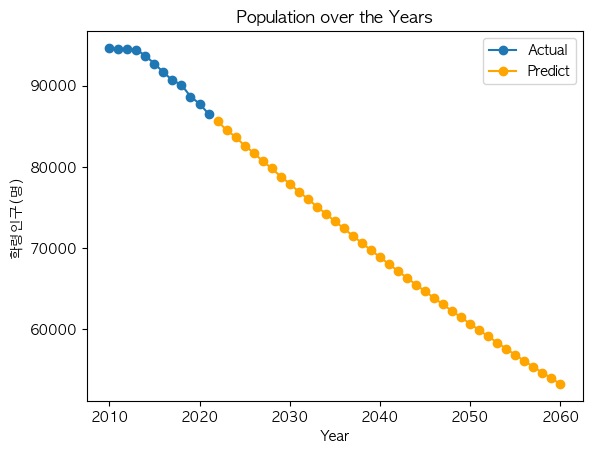

충청남도 논산시


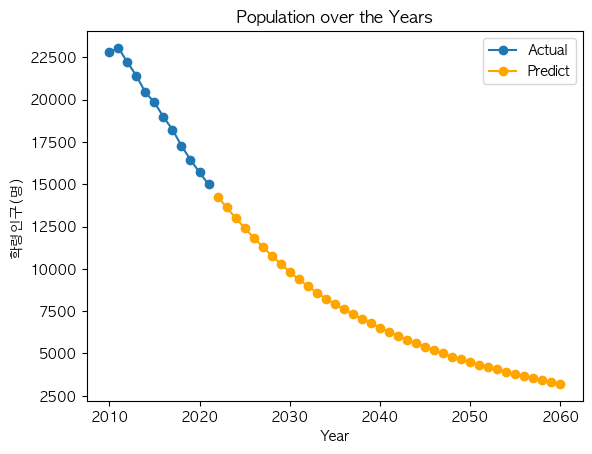

충청남도 서산시


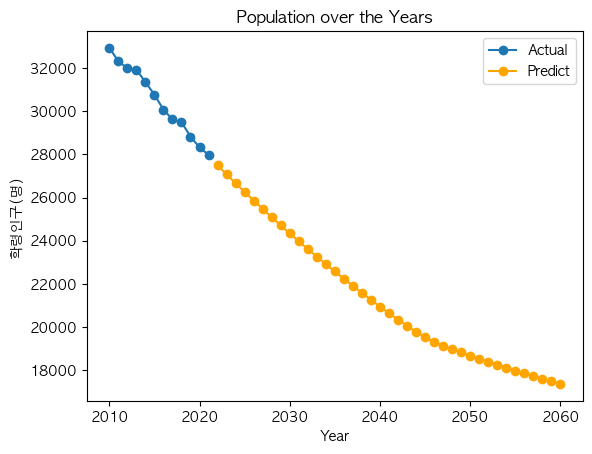

충청남도 아산시


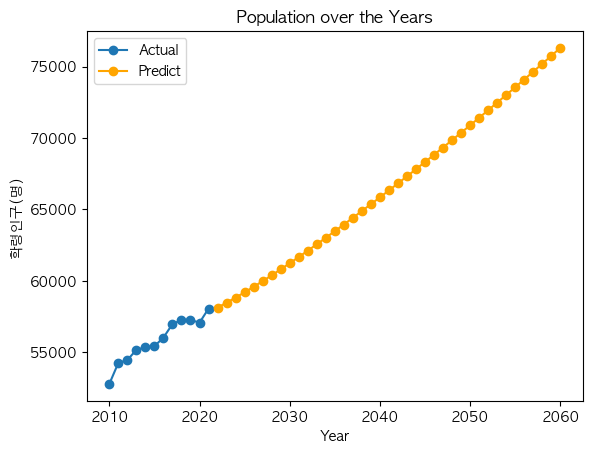

충청남도 천안시


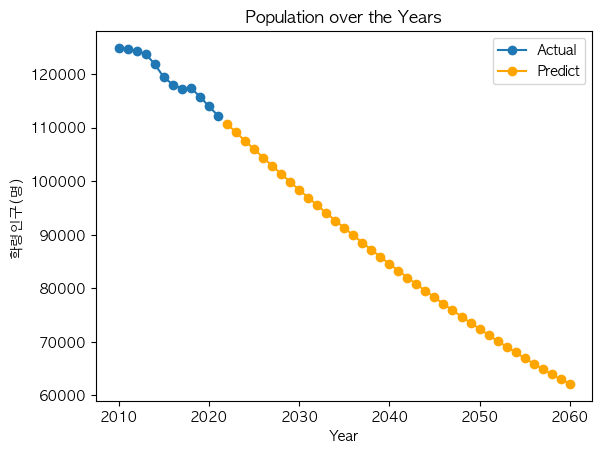

충청북도 제천시


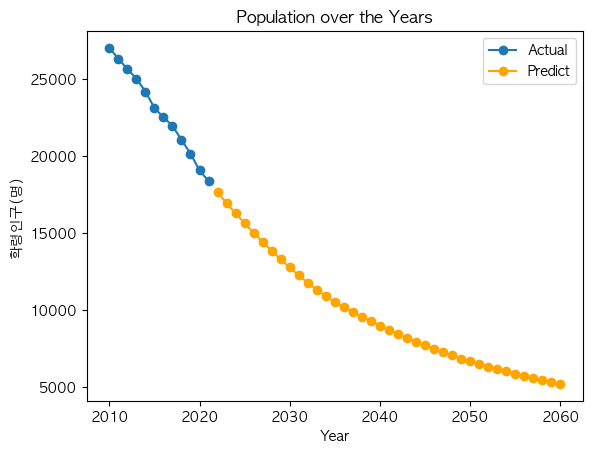

충청북도 청주시


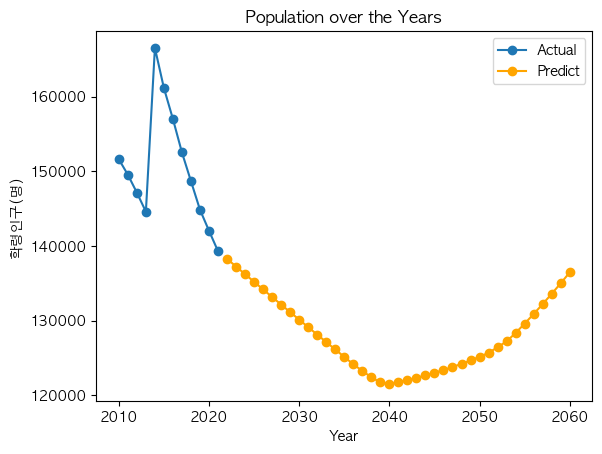

충청북도 충주시


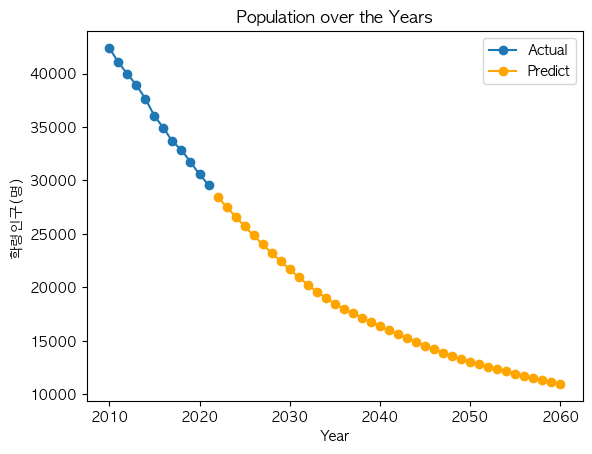

In [52]:
def visualization_graph(df):
# Assuming your DataFrame is named 'df'
    df_2023_onwards = df[df['연도'] > 2021]

    #plt.figure(figsize=(10, 6))
    #print(df)
    # Plotting data before 2023
    plt.plot(df['연도'][:df_2023_onwards.index[0]], df['학령인구(명)'][:df_2023_onwards.index[0]], label='Actual', marker='o')
    
    # Plotting data from 2023 onwards with a different color
    plt.plot(df_2023_onwards['연도'], df_2023_onwards['학령인구(명)'], label='Predict', marker='o', color='orange')

    # Adding labels and title
    plt.xticks(range(2010, 2062,10))
    plt.xlabel('Year')
    plt.ylabel('학령인구(명)')
    plt.title('Population over the Years')
    plt.legend()

    # Show the plot
    plt.show()
    
for i in range(len(cluster1)):
    print(str(cluster1[i]['행정구역'].unique()[0]))
  
    visualization_graph(cluster1[i])

# Cluster 0도 똑같이 진행


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Neural Network
Mape:  9.505320298512894

◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Neural Network
Mape:  1.8120147185196427
MAPE: 1.8120147185196427


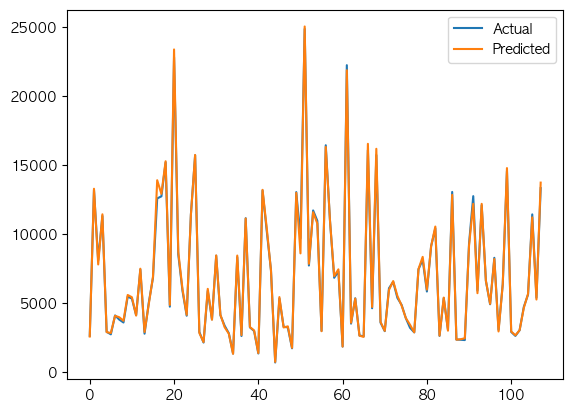

In [53]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")


cluster0 = split_by_region(sort_cluster0)
coll = ['총인구수(명)', '총인구수-학령인구(명)','유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수', '이혼건수']#,'총인구수-학령인구(명)']

    #print(df_log[i])
cluster_df0_2022 = cluster_df0_2022.sort_values(by=['행정구역'])

actual_value = cluster_df0_2022['학령인구(명)'].tolist()


df_log = []
for i in range(len(cluster0)):
    df_log.append(cluster0[i].applymap(lambda x: np.log(x) if isinstance(x, (int, float)) else x))

while 1:
    cluster0 = split_by_region(sort_cluster0)
    for name, model in models.items():
        predict_not_scholar_population_rf = []
        model = MLPRegressor(max_iter=5000)
        model0 = future_prediction1(cluster_df0,model)
        print()
        for i in range(len(df_log)):

            test = run_ARIMA(df_log[i])
            test = test.reset_index()
            
            print("◼", end = ' ')
 
            test = test.applymap(lambda x: np.exp(x) if isinstance(x, (int, float)) else x)
    
            for j in range(len(test)):
                test.loc[j,'총인구수-학령인구(명)'] = float(test.loc[j,'총인구수(명)']) - float(test.loc[j,'학령인구(명)'])
      

            xx = model0.predict(np.array(test[coll]).reshape(-1,len(coll)))
            predict_not_scholar_population_rf.append(float(round(xx[0])))
            for j in range(len(test)):
                #test.loc[j,'총인구수-학령인구(명)'] = float(round(x[j]))
                test.loc[j,'학령인구(명)'] = float(xx[j])
                test['행정구역'] = str(cluster0[i]['행정구역'].unique()[0])
            cluster0[i] = pd.concat([cluster0[i],test], ignore_index=True)
            cluster0[i] = cluster0[i].drop(['index'],axis=1)

        print('\n', name)
        mape = mean_absolute_percentage_error(actual_value,predict_not_scholar_population_rf)
                
    print("Mape: ", mape)
    if mape <= 1.85:
        break;
    
vis1(actual_value,predict_not_scholar_population_rf)
    #'[INFO]PREDICT',year+_,'FINISH')


In [54]:
cluster0[1]

,행정구역,연도,총인구수(명),총인구수-학령인구(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명)
0,강원특별자치도 동해시,2010.000000,95212.810000,76034.500000,22.997000,14.006000,766.711000,660.929000,526.831000,232.927000,19184.000000
1,강원특별자치도 동해시,2011.000000,95780.508000,76648.236000,21.998000,14.005000,791.681000,595.013000,521.862000,201.957000,19138.000000
2,강원특별자치도 동해시,2012.000000,93875.566000,75609.702000,21.996000,14.005000,768.753000,654.915000,499.816000,202.978000,18271.000000
3,강원특별자치도 동해시,2013.000000,95120.880000,76853.187000,21.996000,14.005000,726.709000,664.895000,478.842000,256.891000,18273.000000
4,강원특별자치도 동해시,2014.000000,94539.752000,77032.803000,21.997000,14.005000,702.715000,600.022000,480.855000,243.922000,17512.000000
5,강원특별자치도 동해시,2015.000000,93871.944000,76974.083000,21.996000,14.005000,666.754000,680.937000,474.861000,200.947000,16903.000000
6,강원특별자치도 동해시,2016.000000,93273.302000,77047.271000,18.000000,14.005000,661.719000,639.968000,446.842000,193.956000,16231.000000
7,강원특별자치도 동해시,2017.000000,92826.663000,77128.615000,17.001000,14.005000,560.776000,624.995000,418.855000,217.904000,15703.000000
8,강원특별자치도 동해시,2018.000000,91249.054000,76112.018000,17.000000,14.005000,471.869000,730.936000,374.923000,189.951000,15142.000000
9,강원특별자치도 동해시,2019.000000,90498.706000,75967.654000,17.000000,14.005000,421.944000,623.998000,381.875000,253.913000,14536.000000


강원특별자치도 고성군


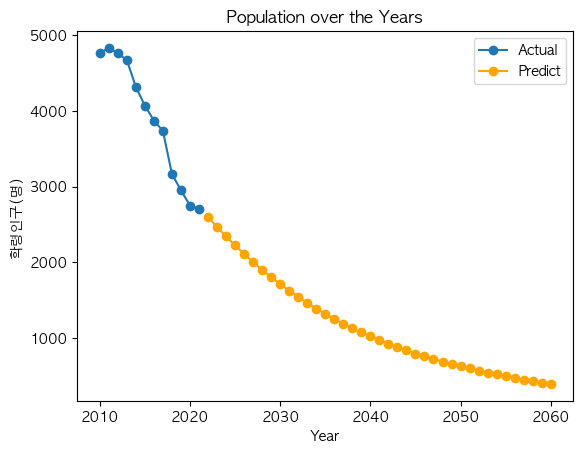

강원특별자치도 동해시


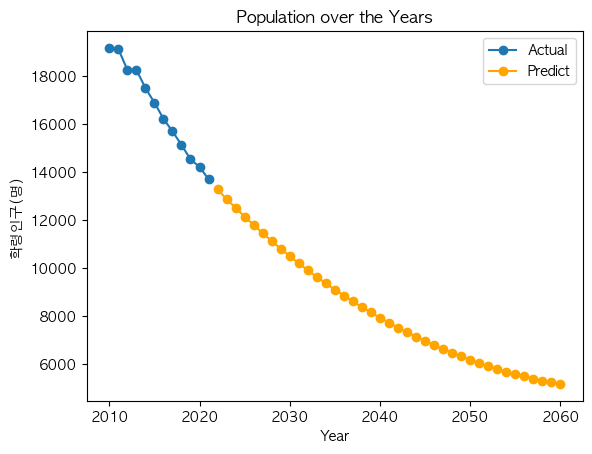

강원특별자치도 삼척시


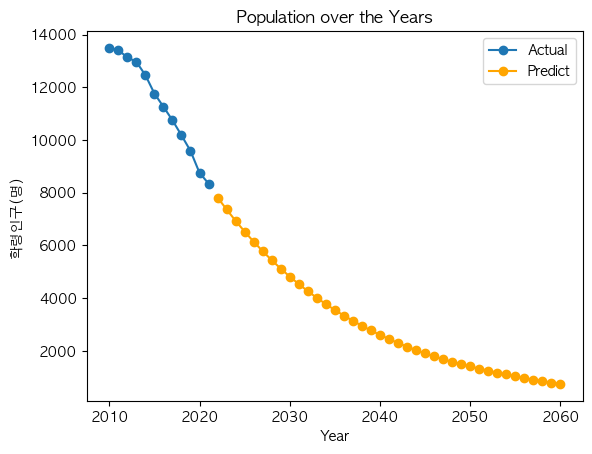

강원특별자치도 속초시


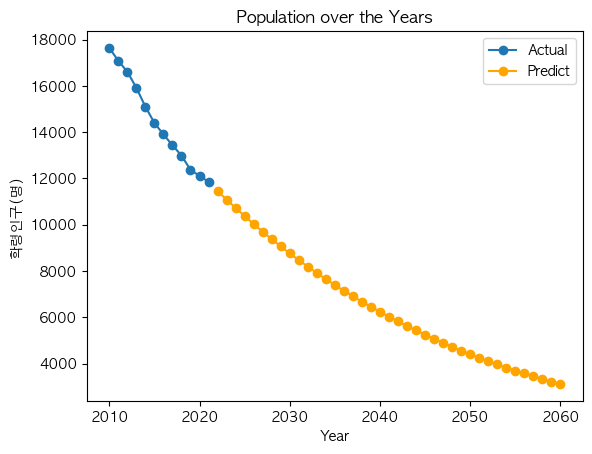

강원특별자치도 양구군


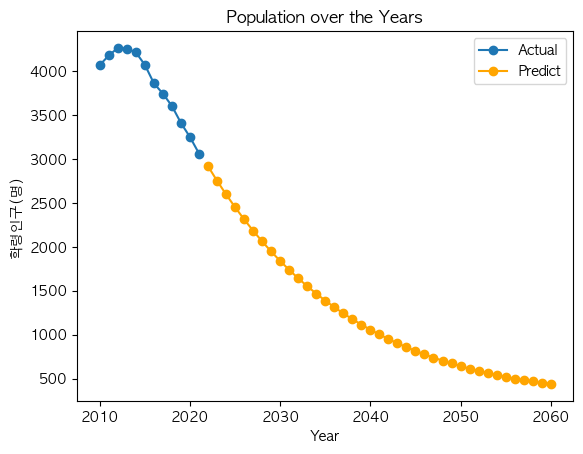

강원특별자치도 양양군


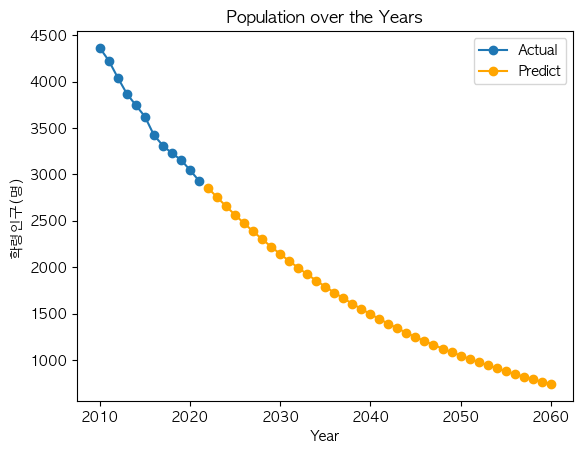

강원특별자치도 영월군


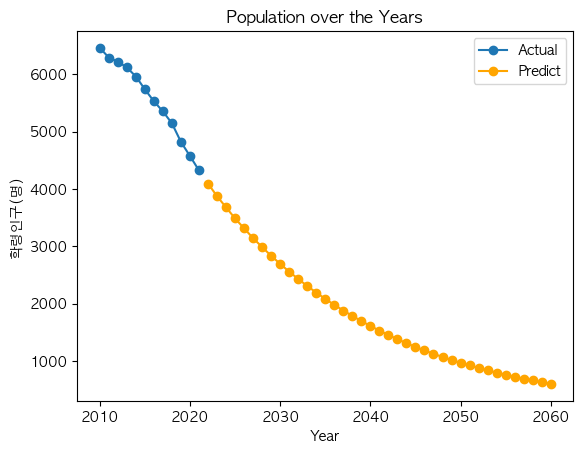

강원특별자치도 인제군


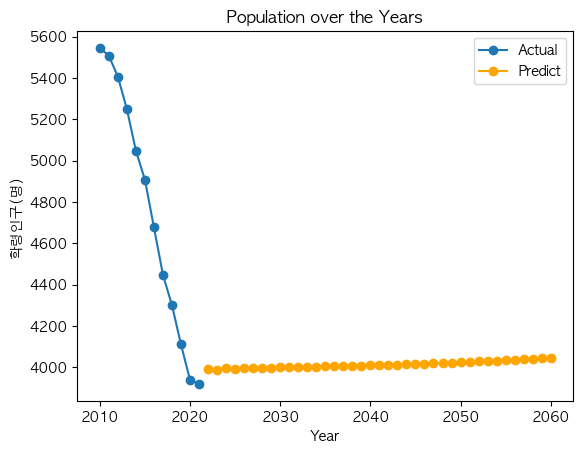

강원특별자치도 정선군


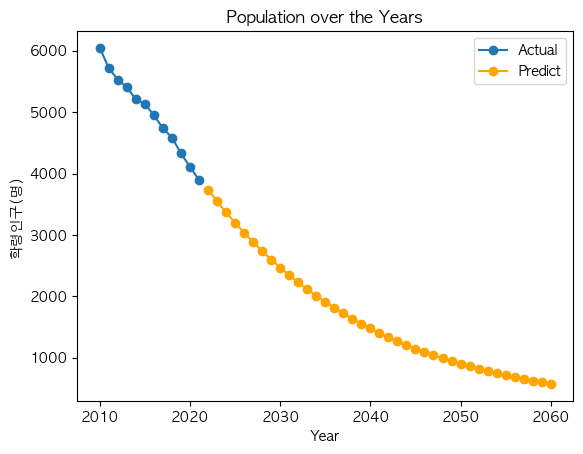

강원특별자치도 철원군


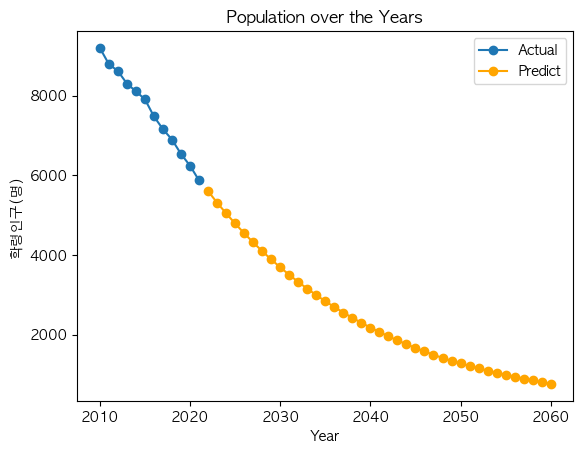

강원특별자치도 태백시


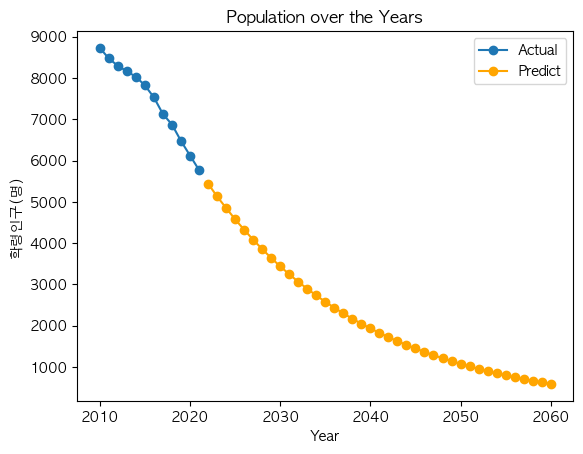

강원특별자치도 평창군


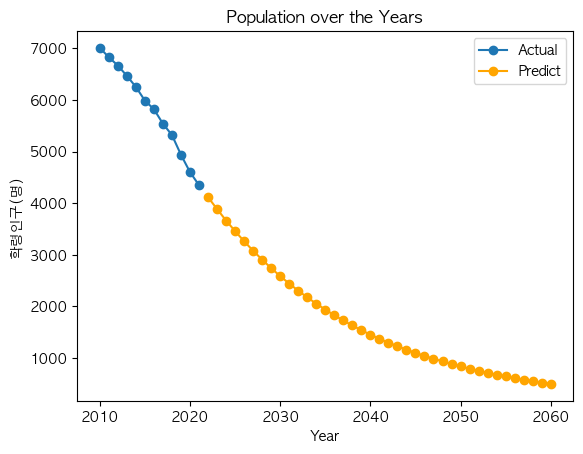

강원특별자치도 홍천군


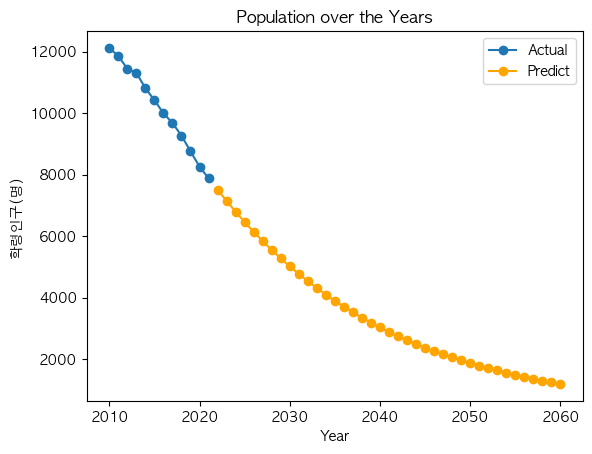

강원특별자치도 화천군


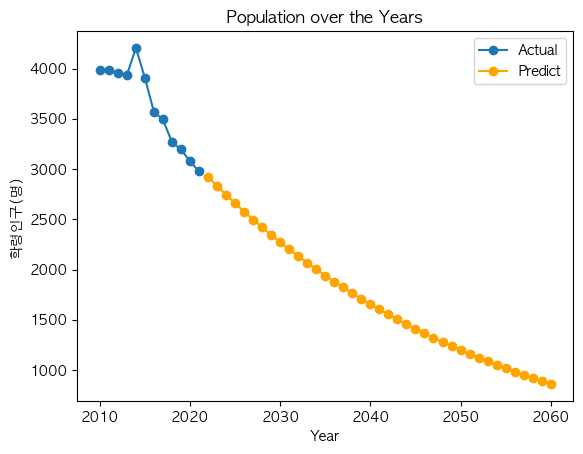

강원특별자치도 횡성군


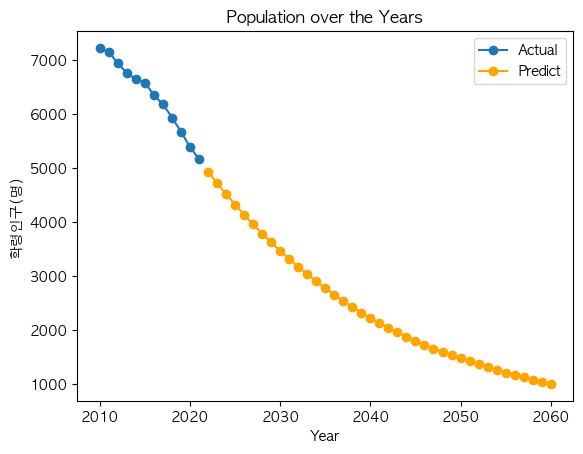

경기도 가평군


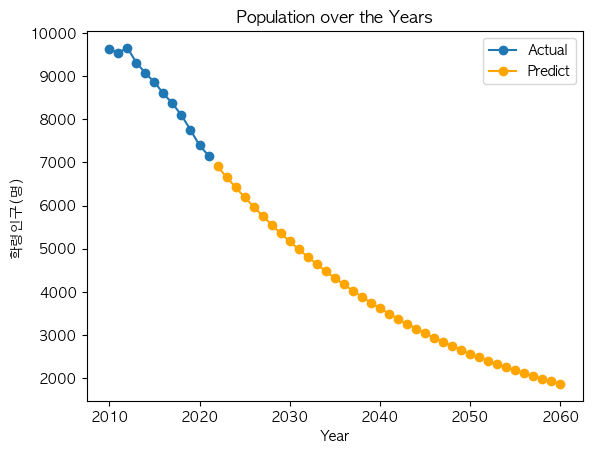

경기도 과천시


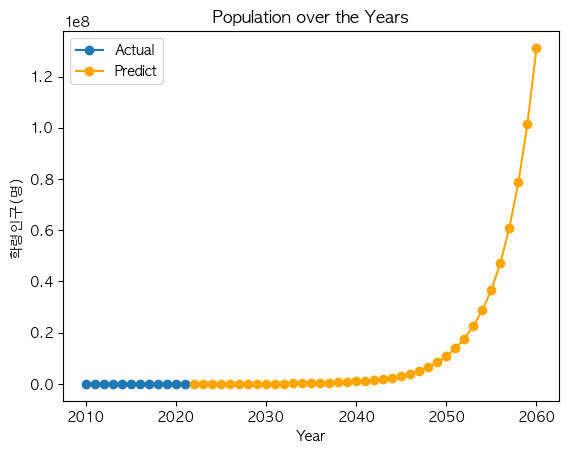

경기도 동두천시


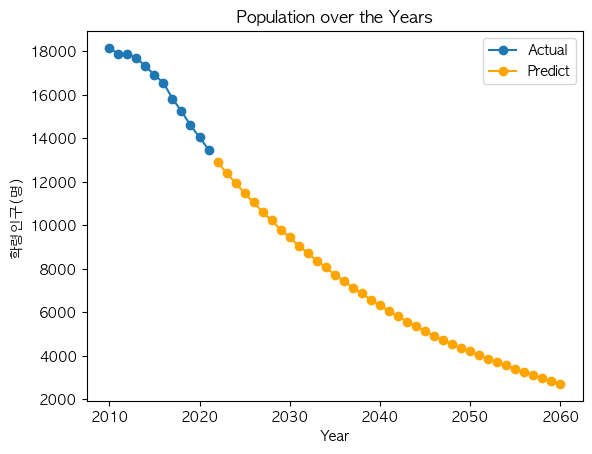

경기도 양평군


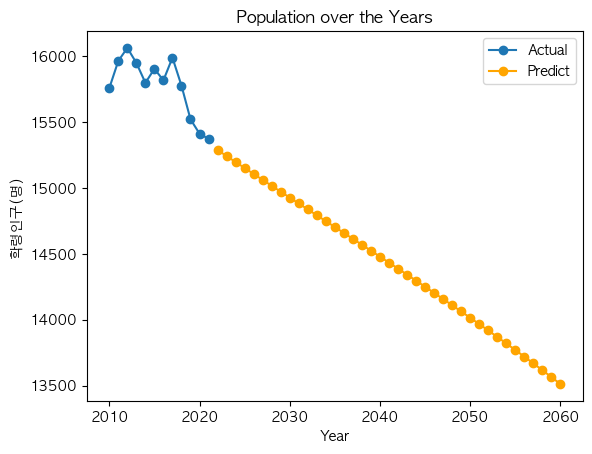

경기도 연천군


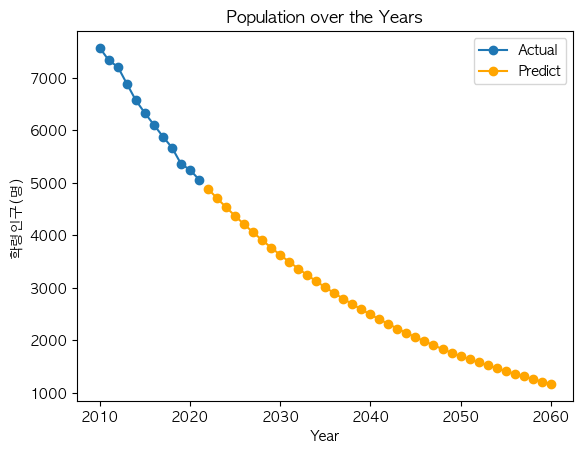

경기도 의왕시


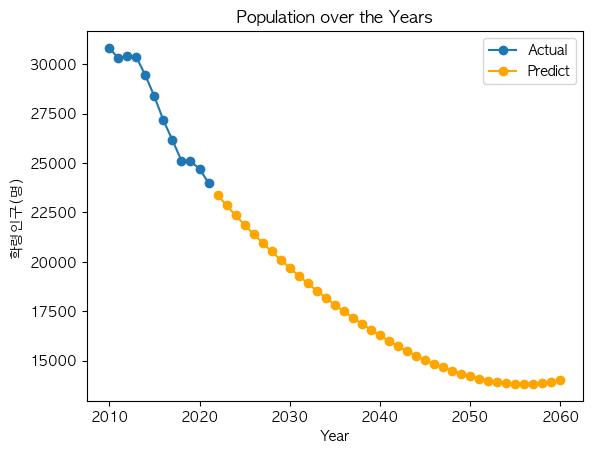

경상남도 거창군


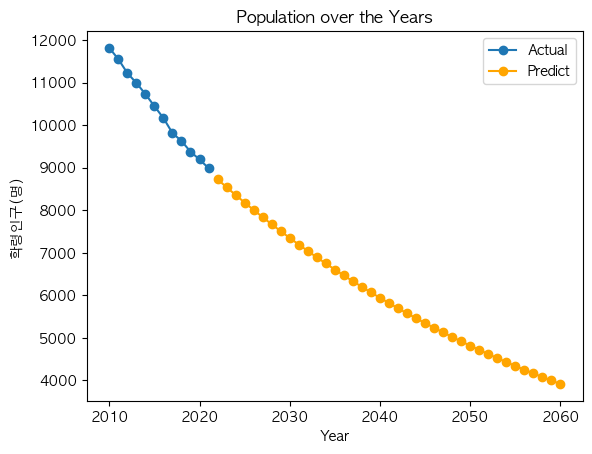

경상남도 고성군


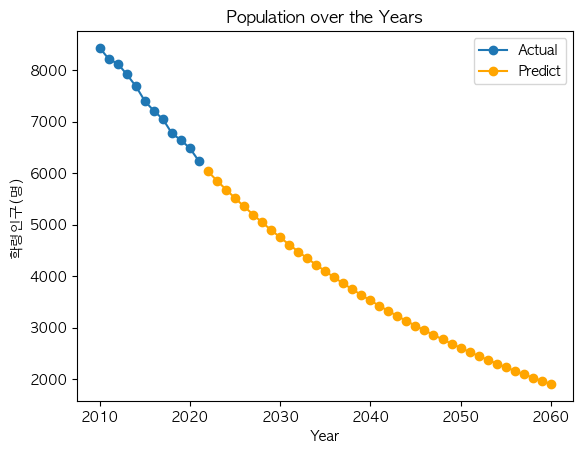

경상남도 남해군


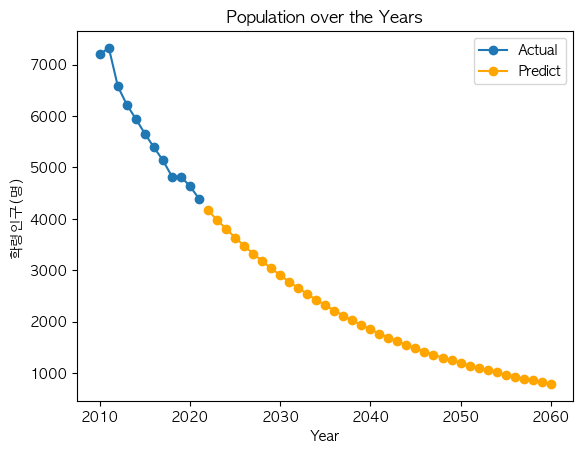

경상남도 밀양시


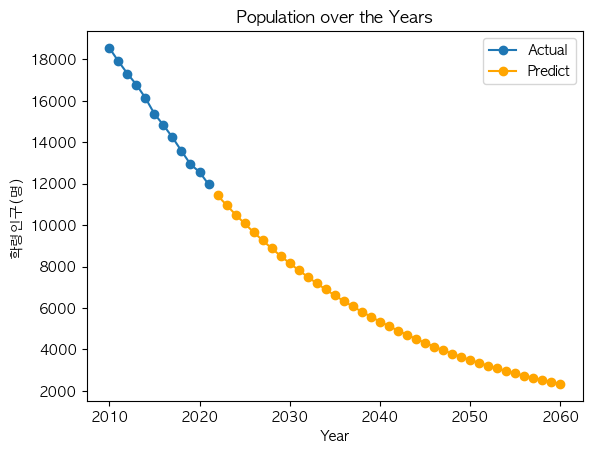

경상남도 사천시


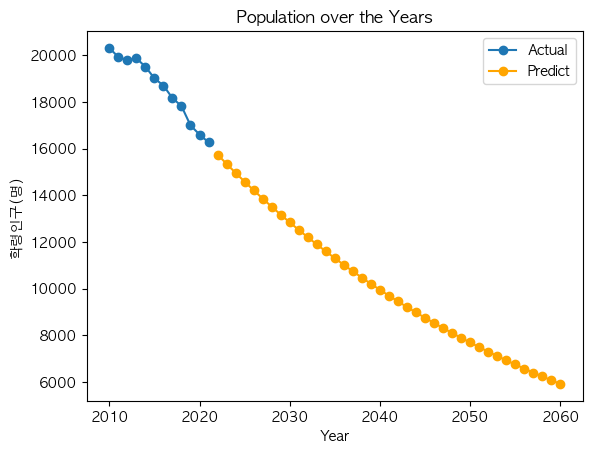

경상남도 산청군


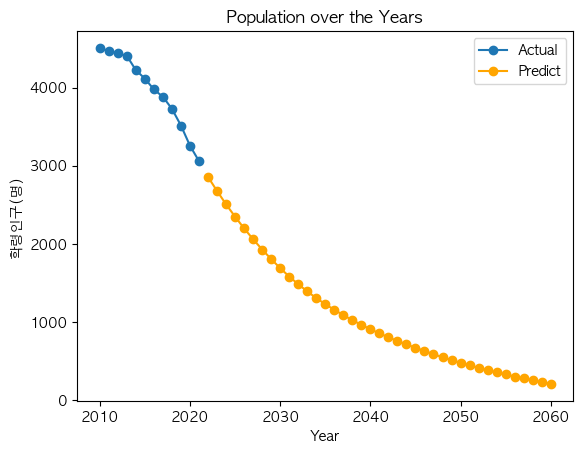

경상남도 의령군


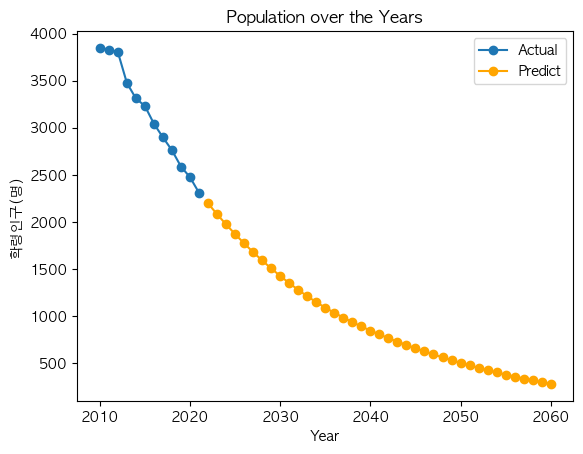

경상남도 창녕군


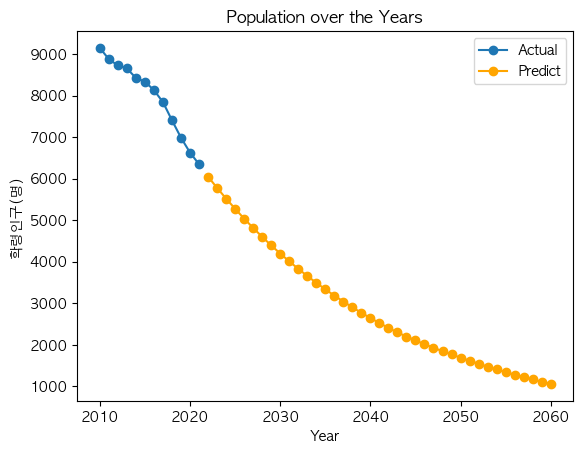

경상남도 하동군


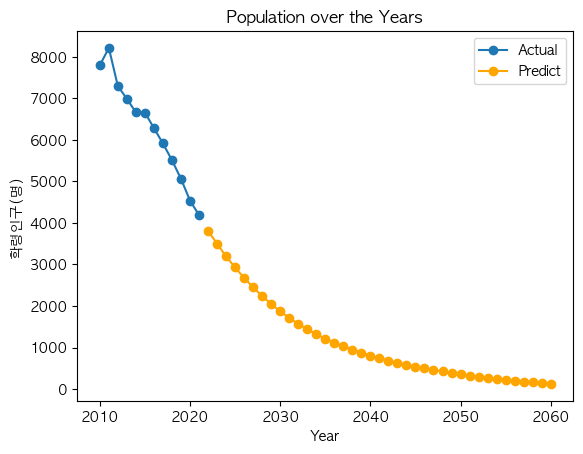

경상남도 함안군


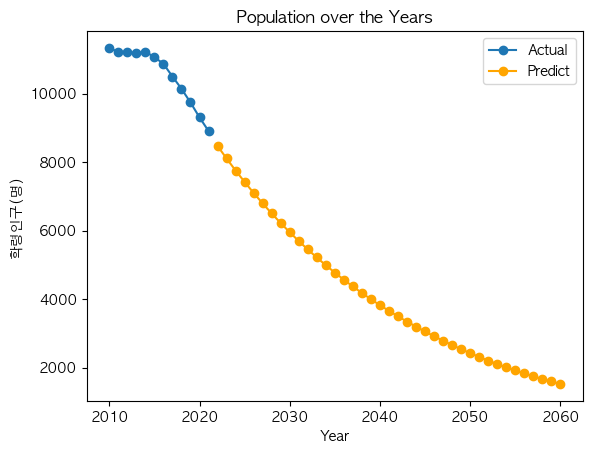

경상남도 함양군


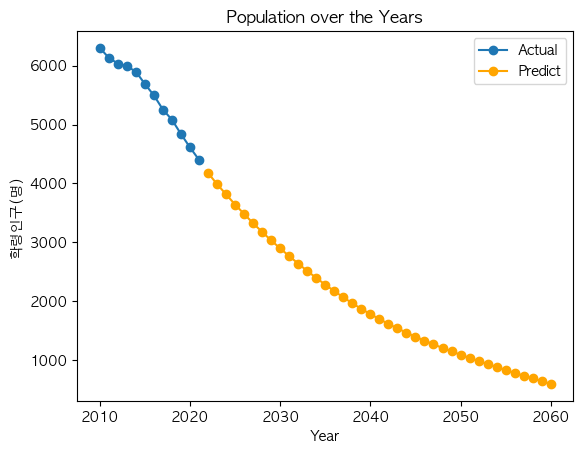

경상남도 합천군


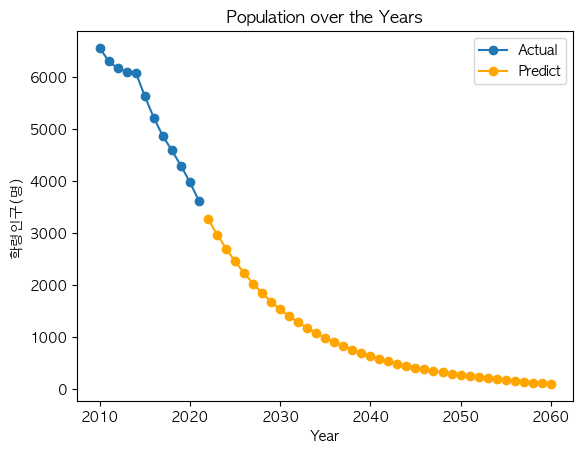

경상북도 고령군


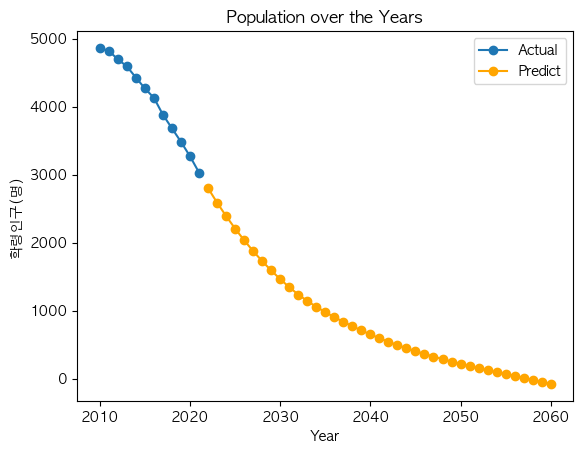

경상북도 군위군


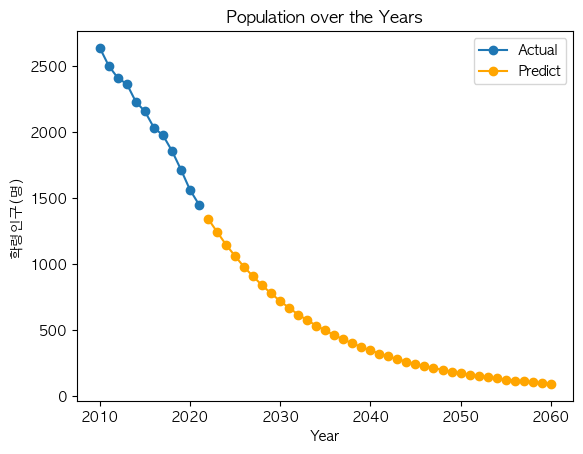

경상북도 문경시


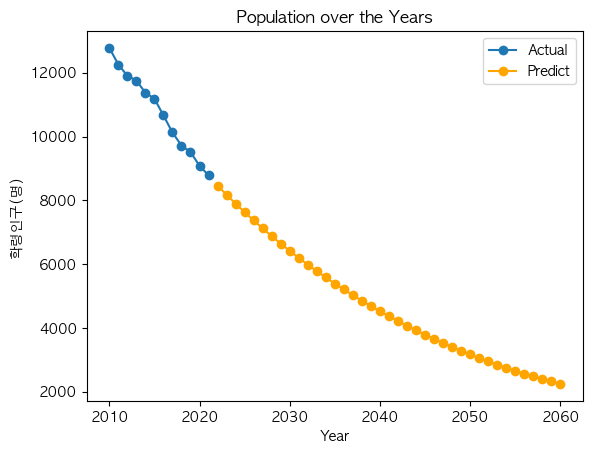

경상북도 봉화군


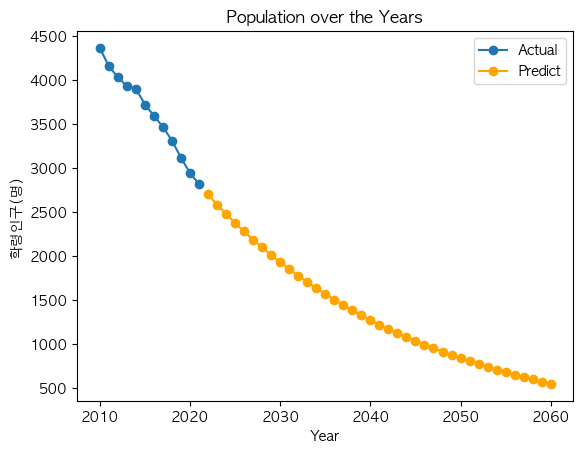

경상북도 상주시


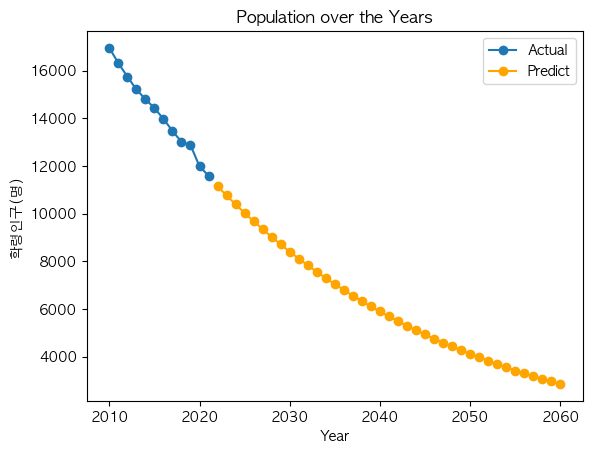

경상북도 성주군


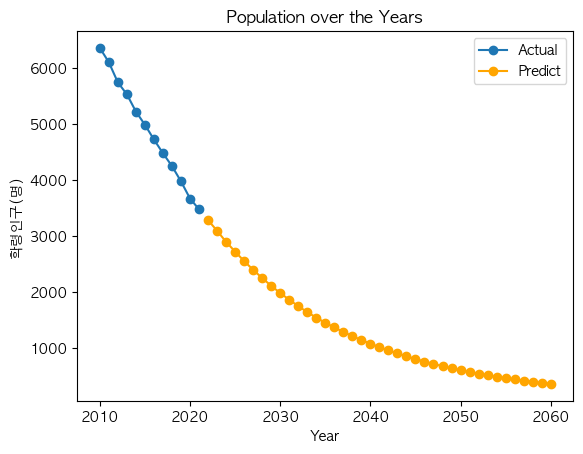

경상북도 영덕군


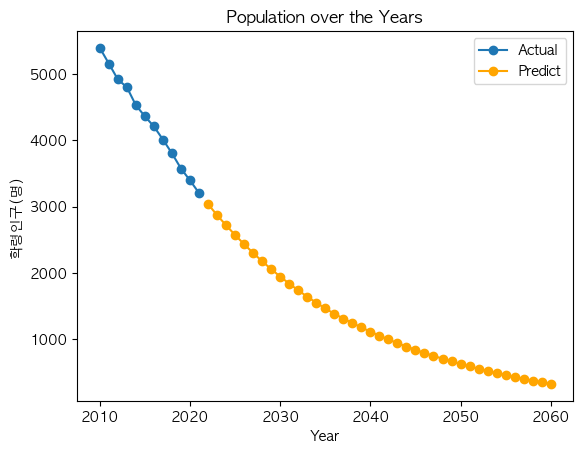

경상북도 영양군


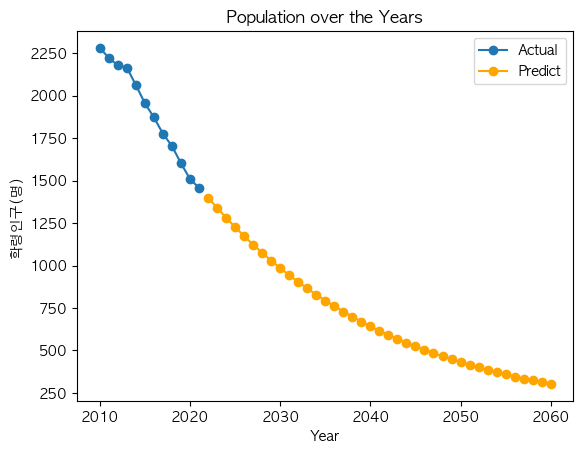

경상북도 영주시


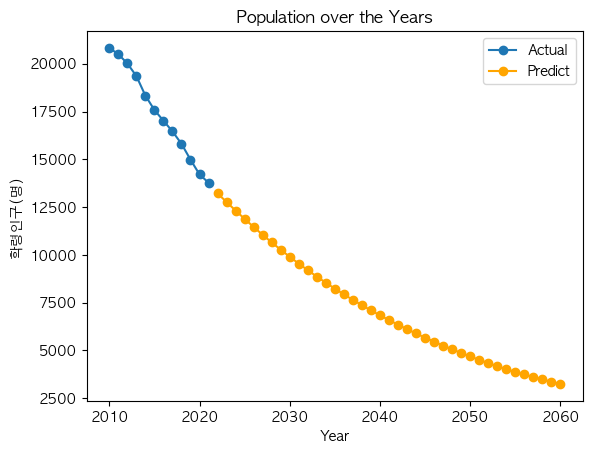

경상북도 영천시


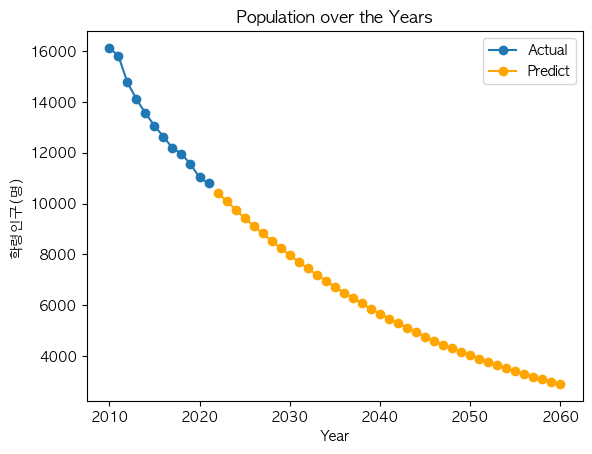

경상북도 예천군


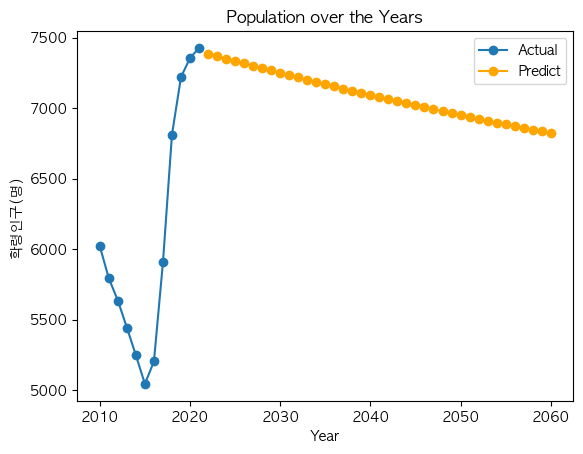

경상북도 울릉군


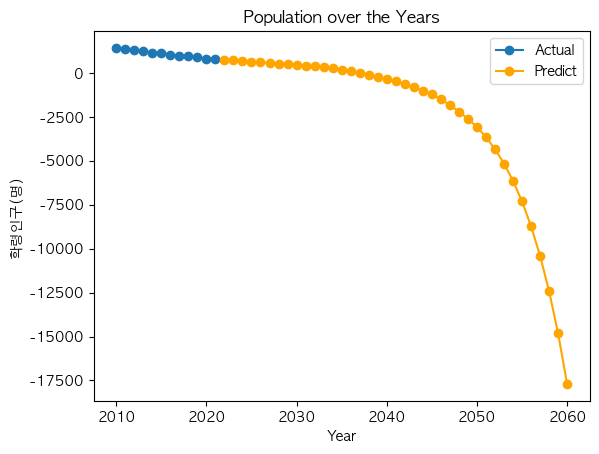

경상북도 울진군


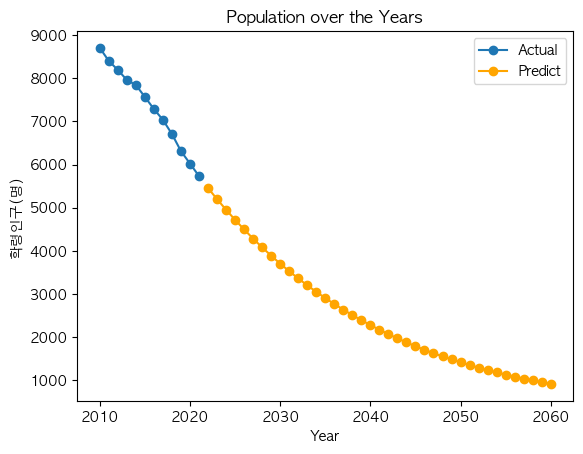

경상북도 의성군


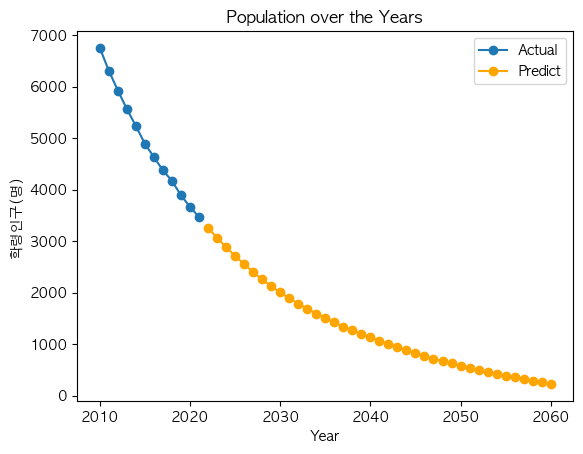

경상북도 청도군


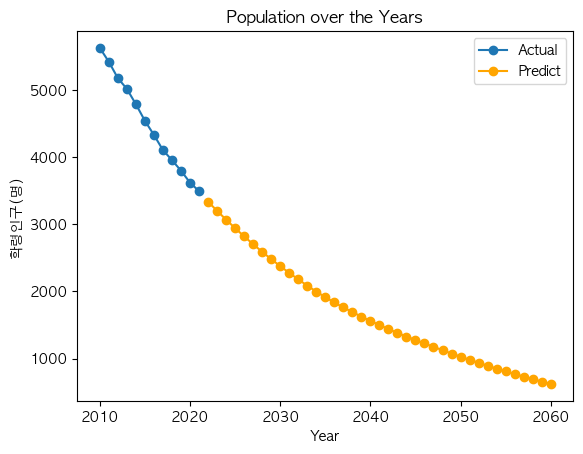

경상북도 청송군


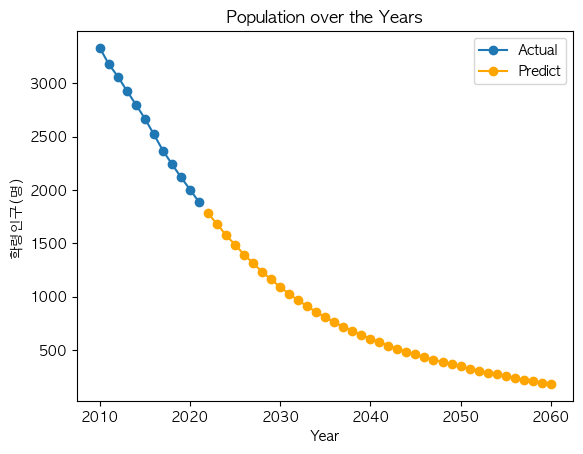

광주광역시 동구


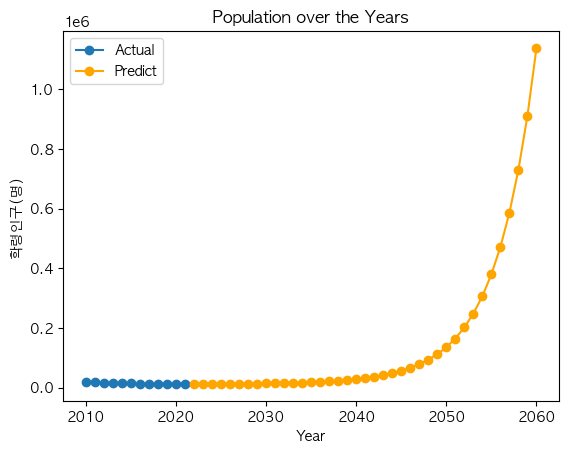

대구광역시 중구


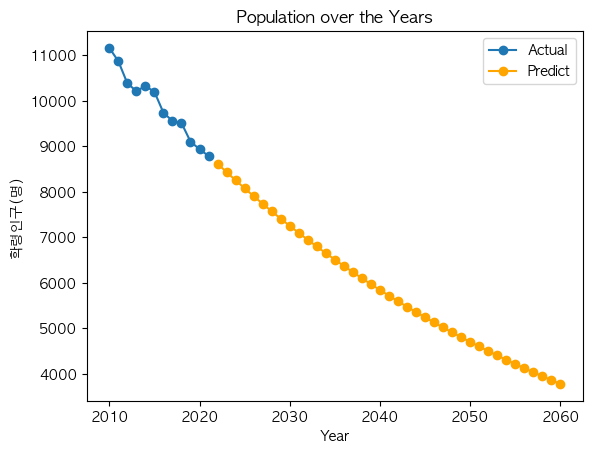

부산광역시 강서구


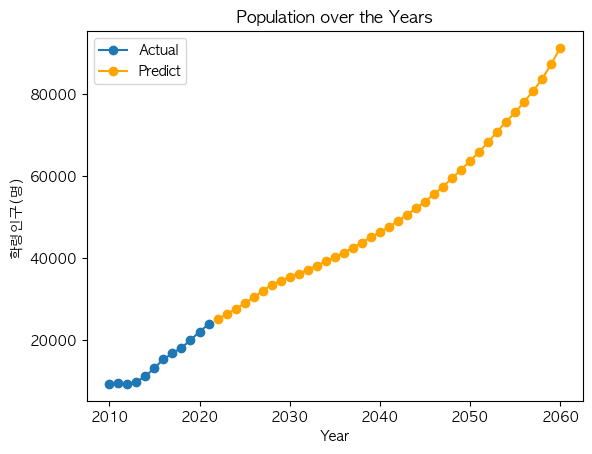

부산광역시 동구


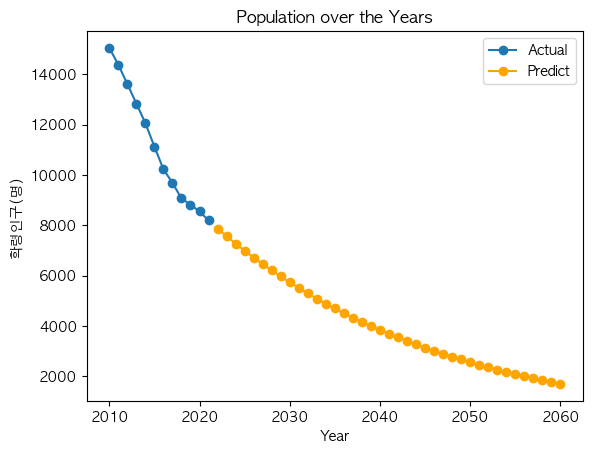

부산광역시 서구


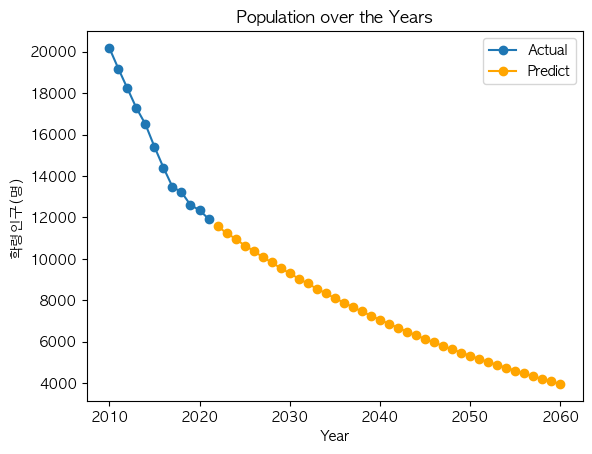

부산광역시 영도구


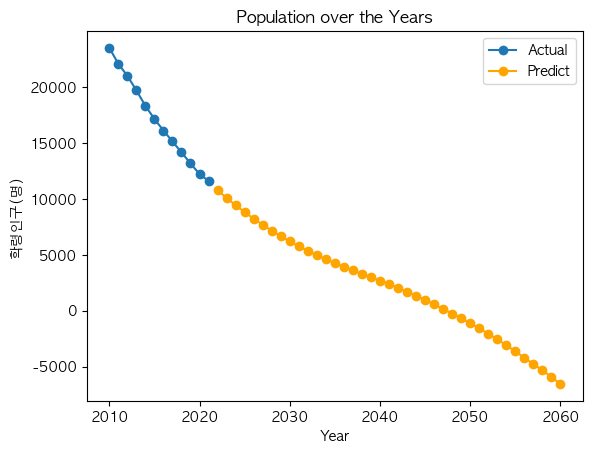

부산광역시 중구


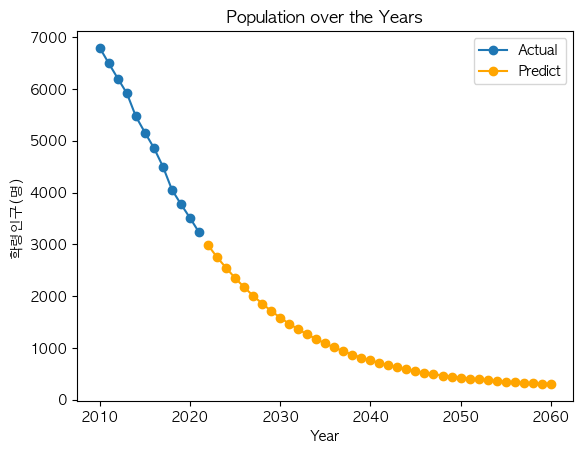

서울특별시 종로구


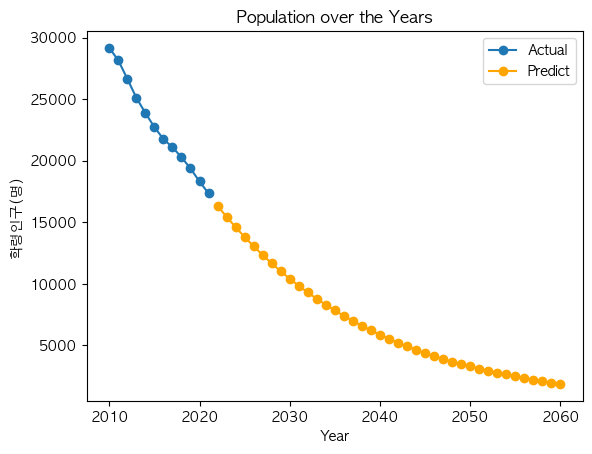

서울특별시 중구


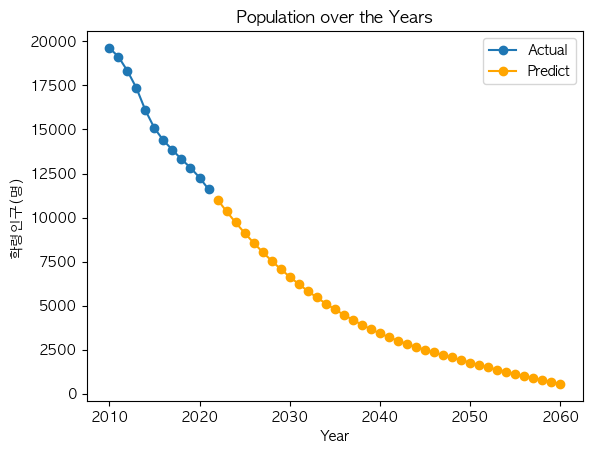

인천광역시 강화군


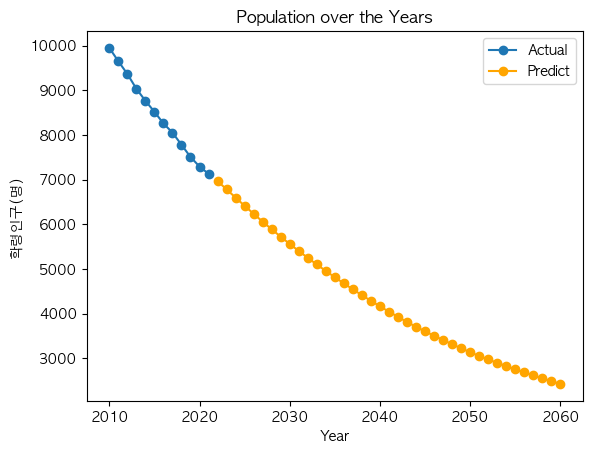

인천광역시 동구


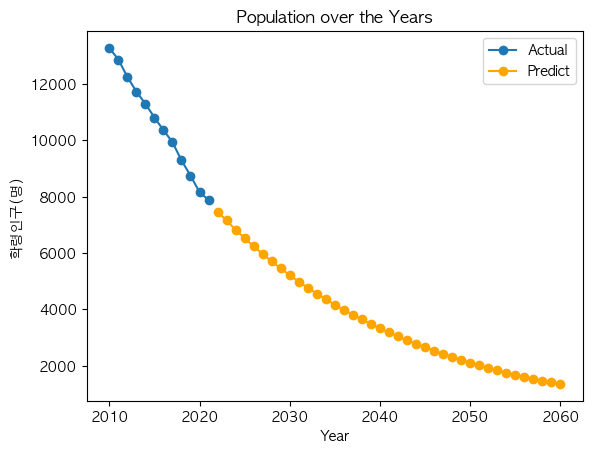

인천광역시 옹진군


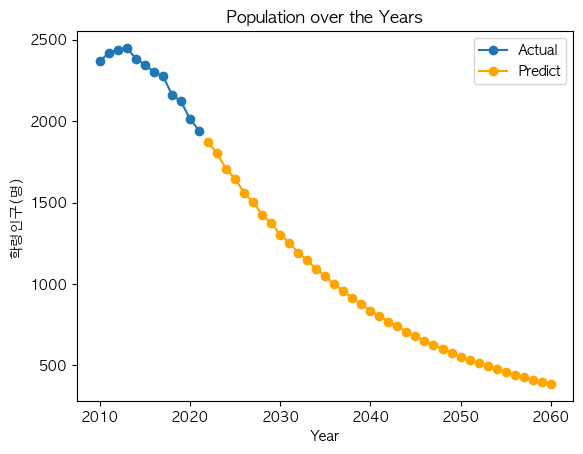

인천광역시 중구


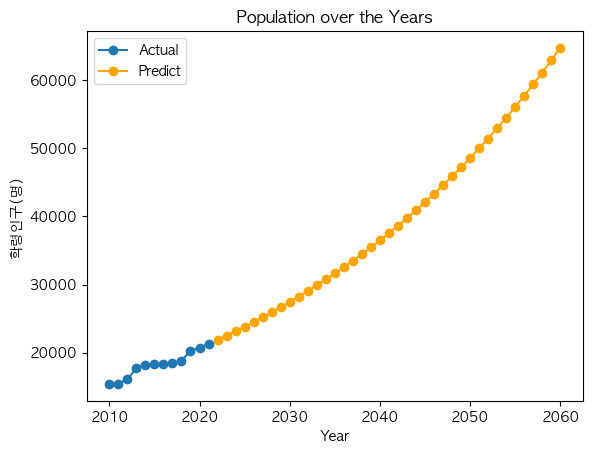

전라남도 강진군


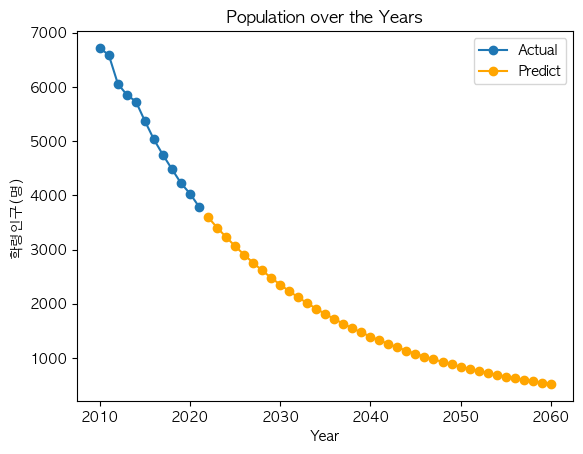

전라남도 고흥군


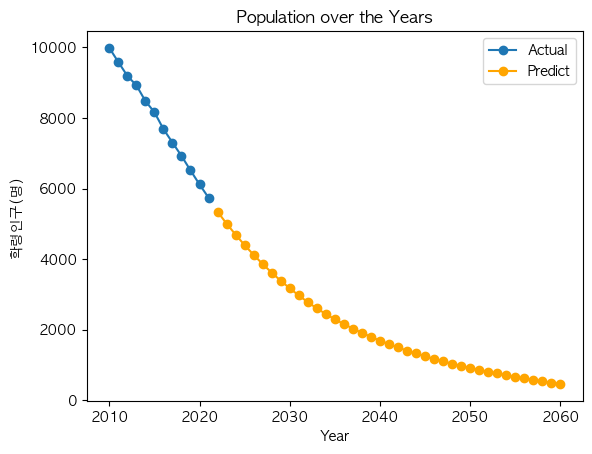

전라남도 곡성군


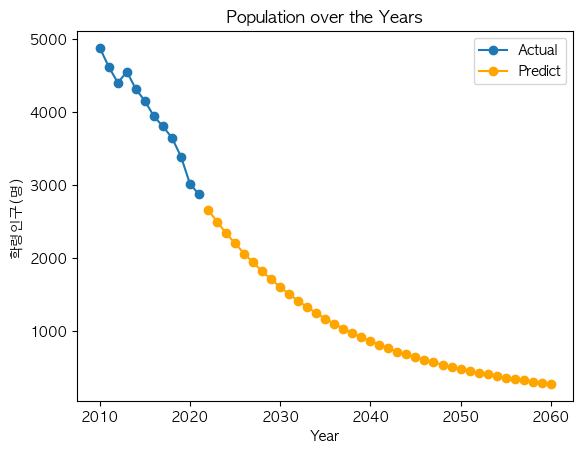

전라남도 구례군


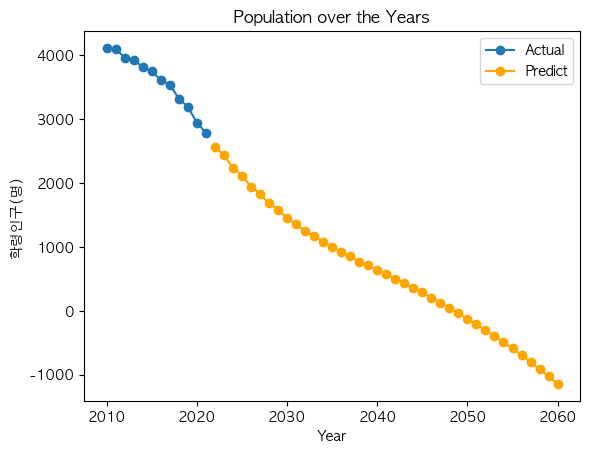

전라남도 나주시


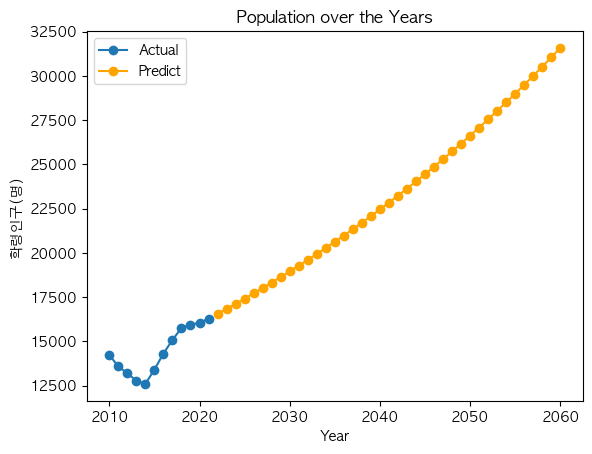

전라남도 담양군


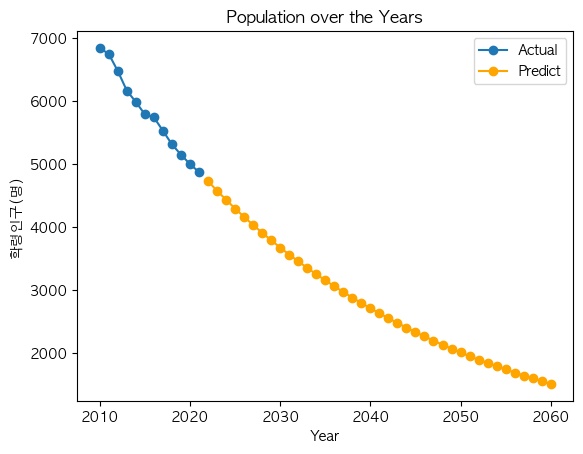

전라남도 무안군


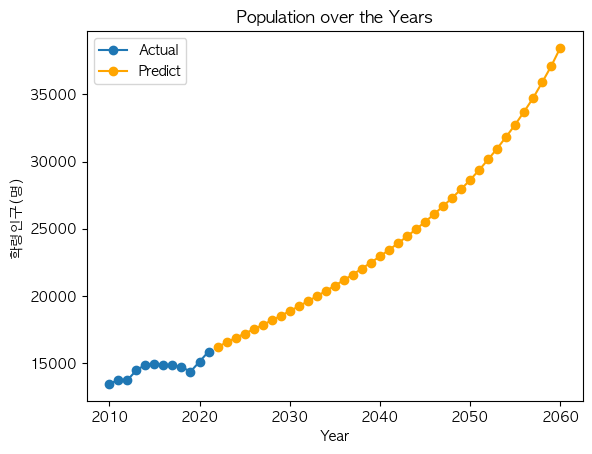

전라남도 보성군


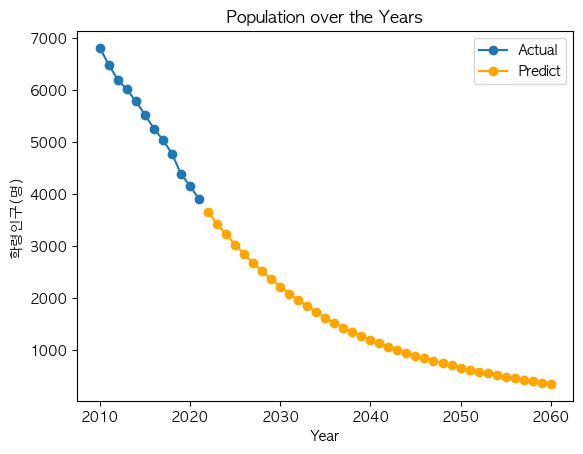

전라남도 신안군


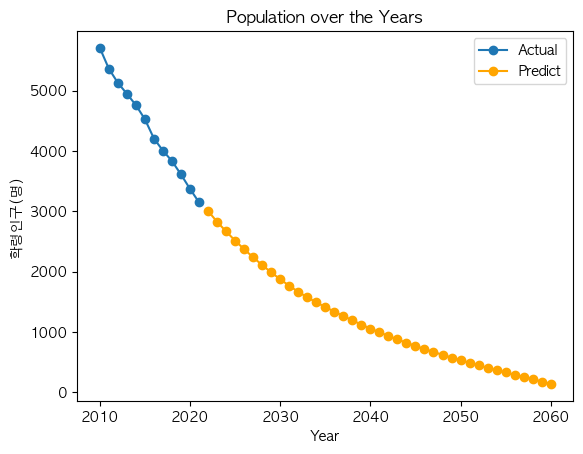

전라남도 영광군


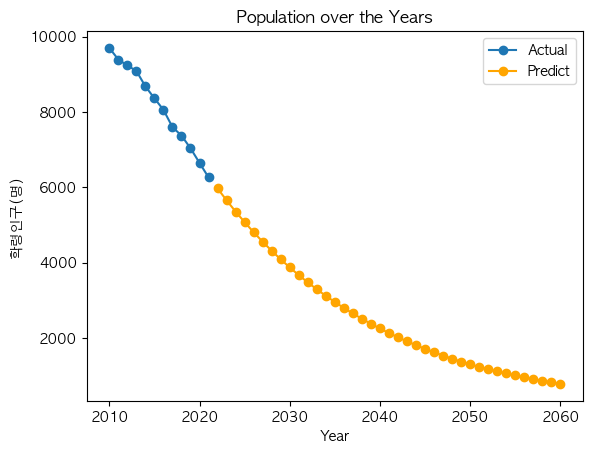

전라남도 영암군


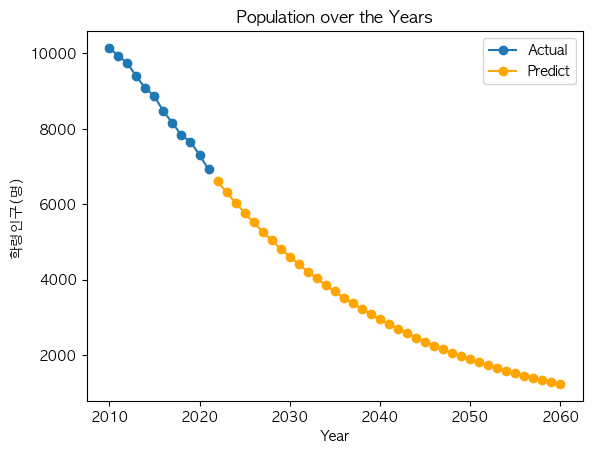

전라남도 완도군


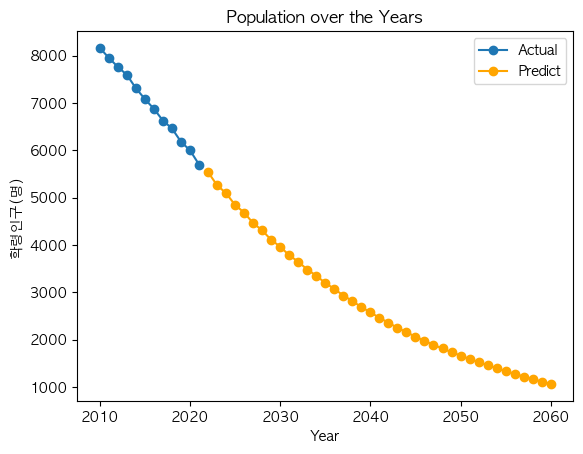

전라남도 장성군


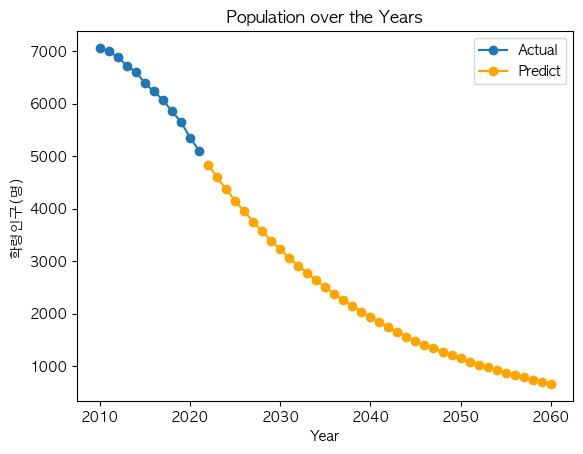

전라남도 장흥군


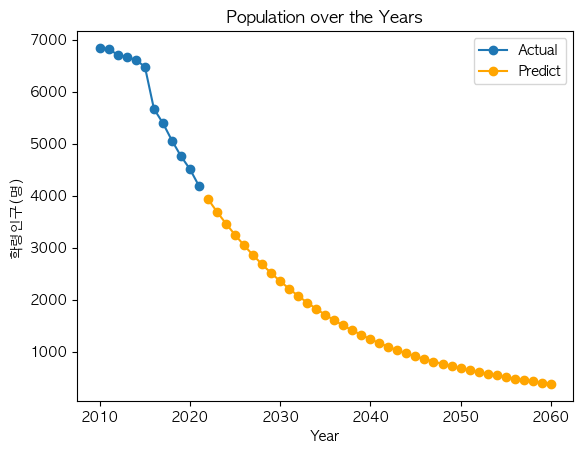

전라남도 진도군


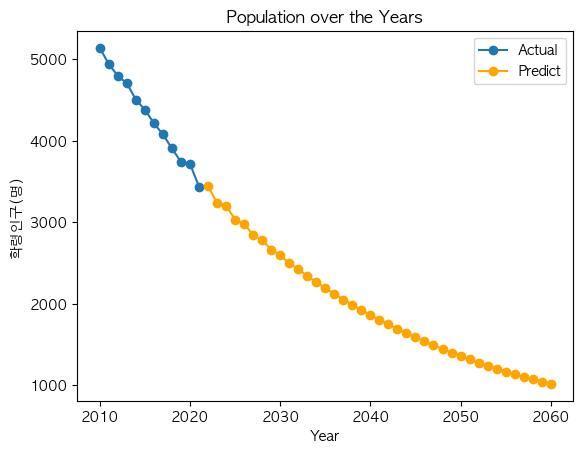

전라남도 함평군


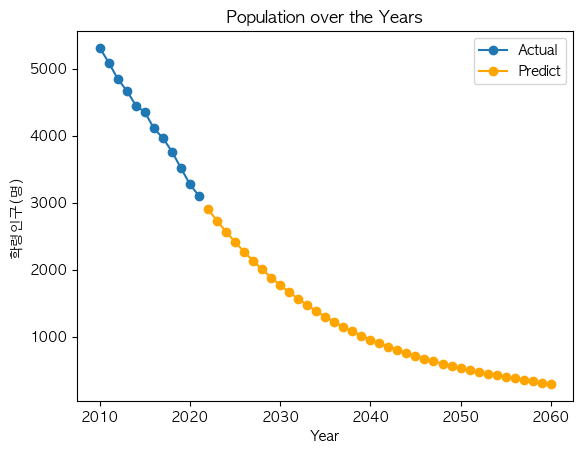

전라남도 해남군


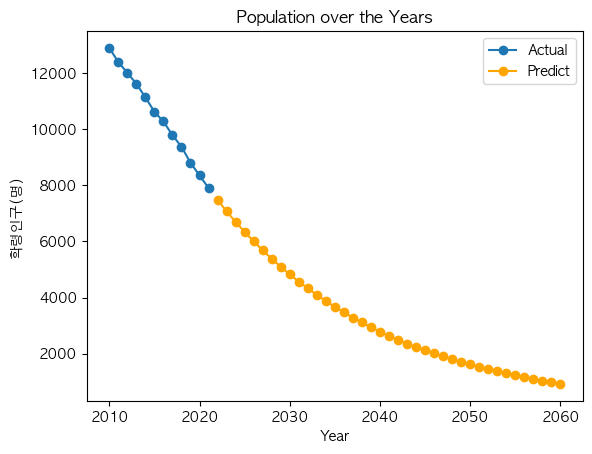

전라남도 화순군


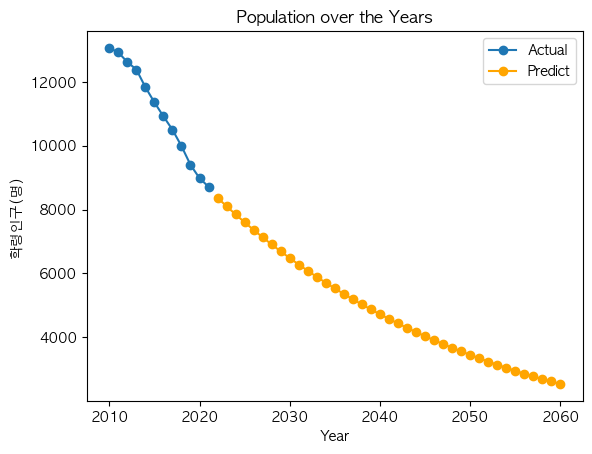

전라북도 고창군


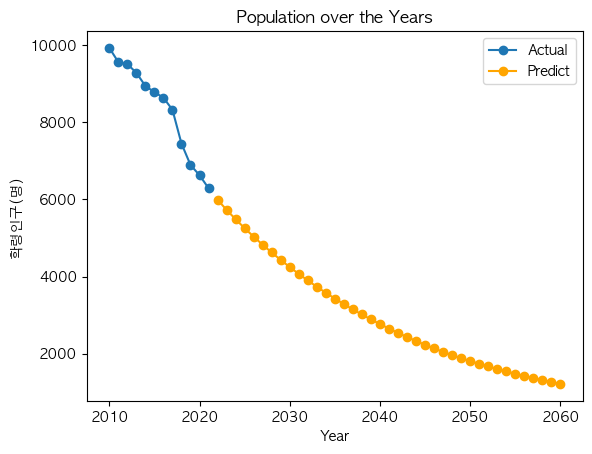

전라북도 김제시


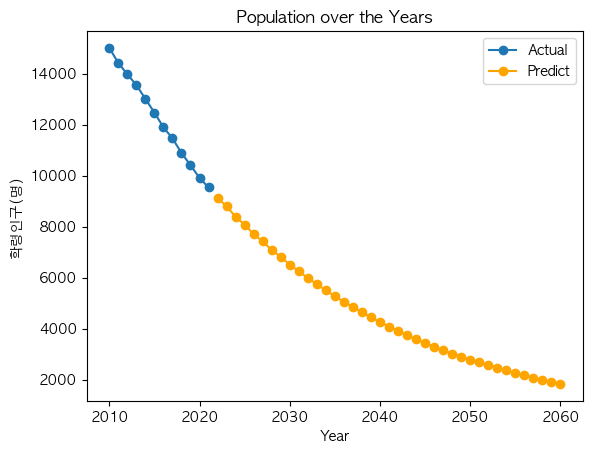

전라북도 남원시


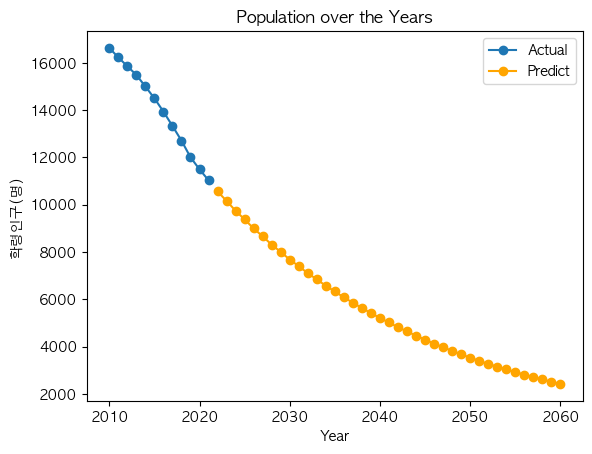

전라북도 무주군


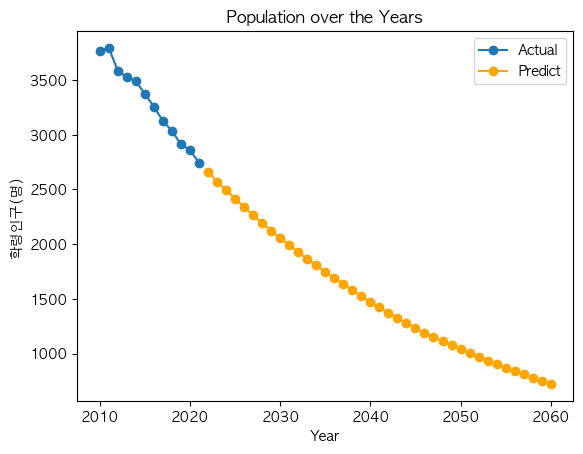

전라북도 부안군


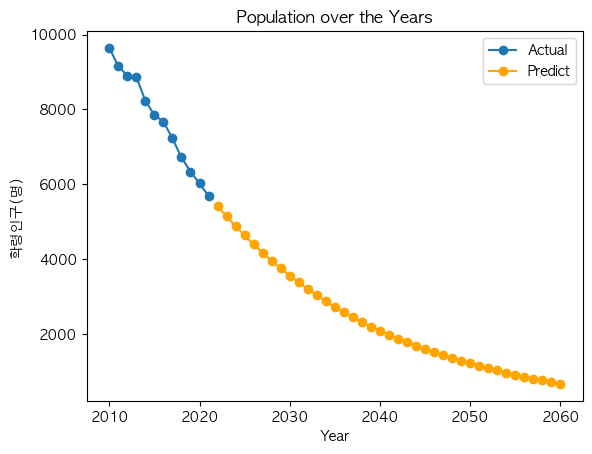

전라북도 순창군


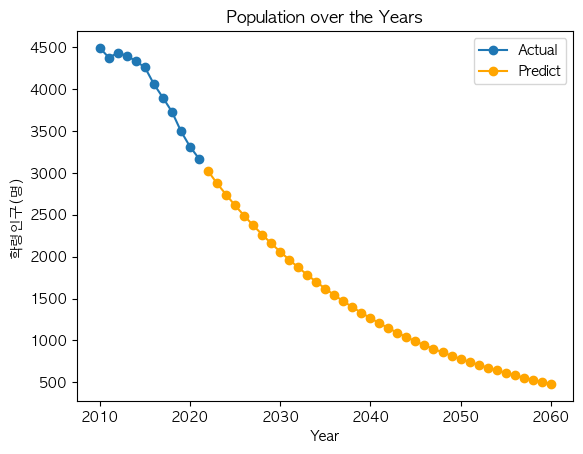

전라북도 완주군


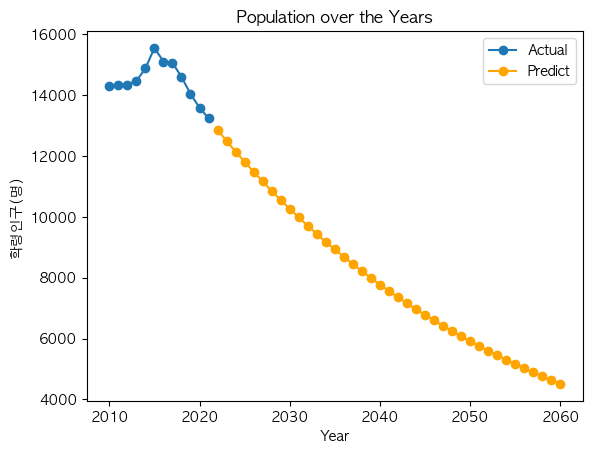

전라북도 임실군


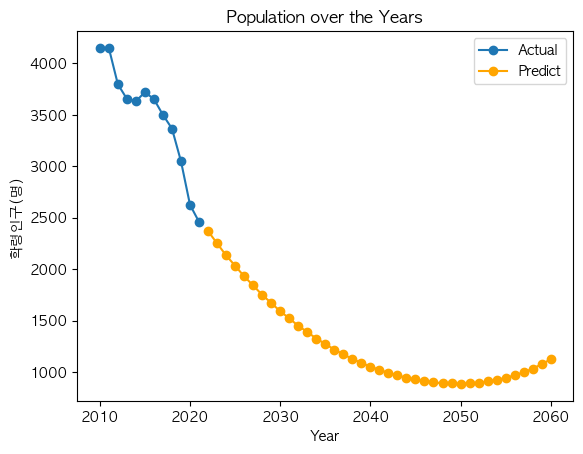

전라북도 장수군


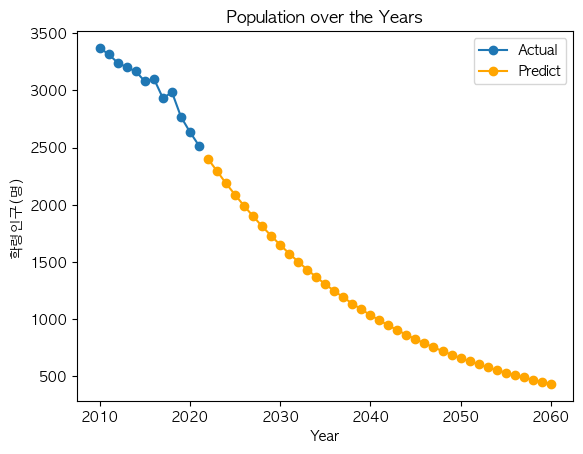

전라북도 진안군


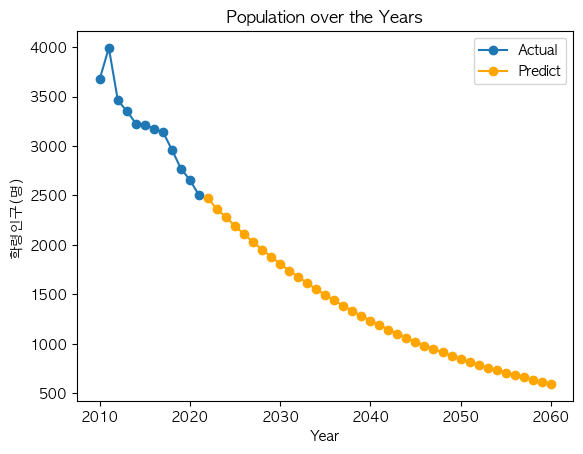

충청남도 계룡시


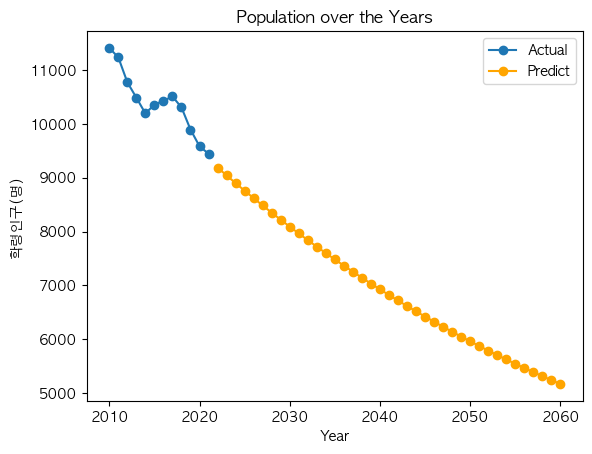

충청남도 공주시


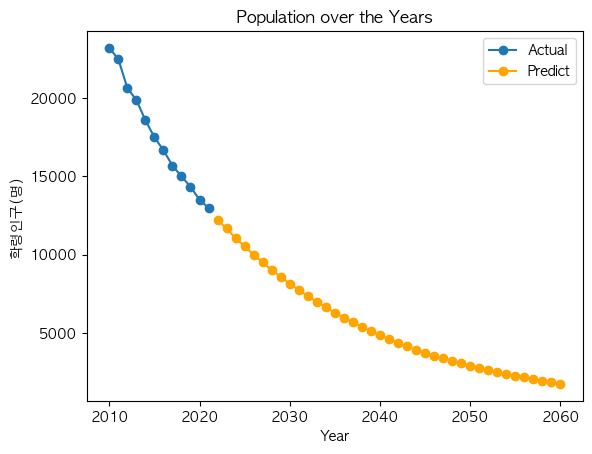

충청남도 금산군


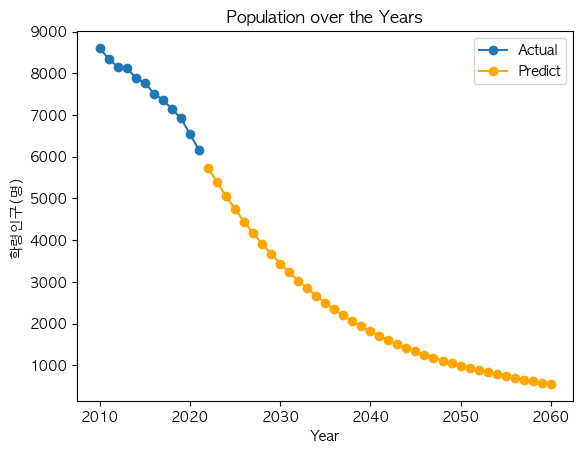

충청남도 보령시


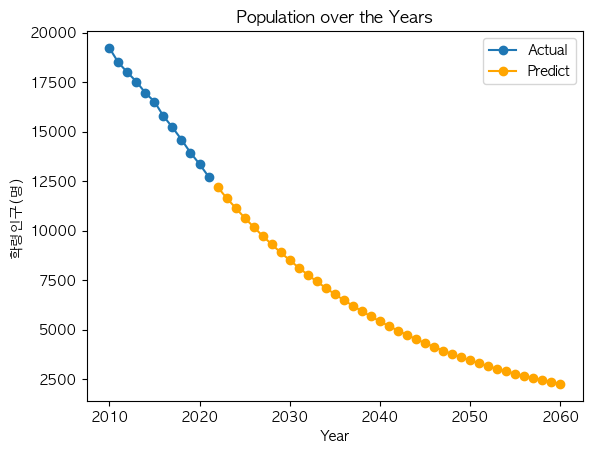

충청남도 부여군


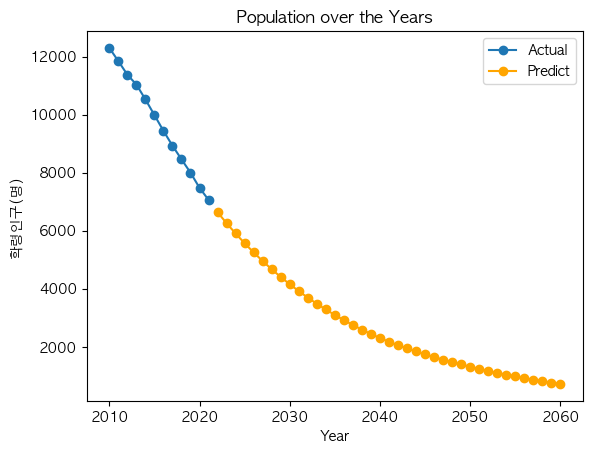

충청남도 서천군


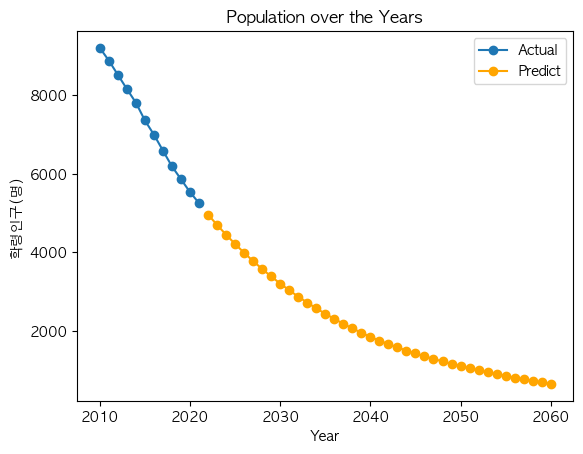

충청남도 예산군


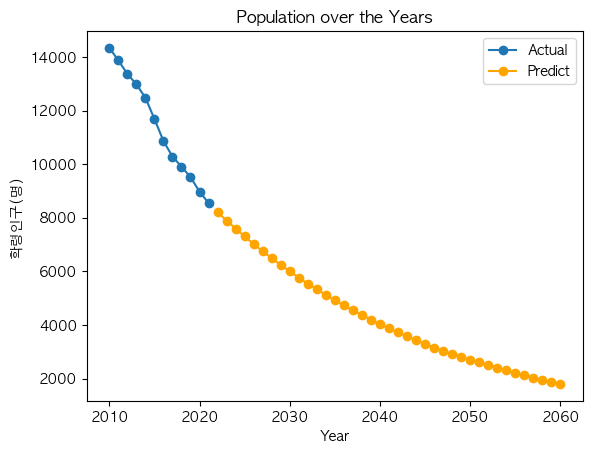

충청남도 청양군


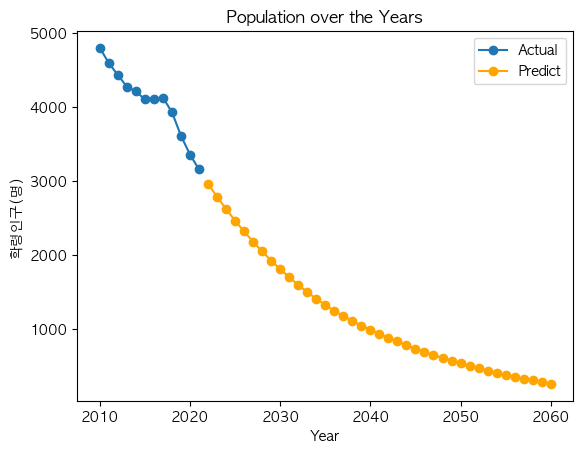

충청남도 태안군


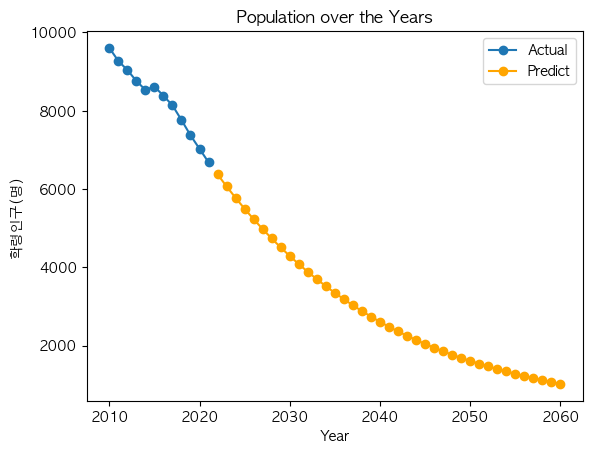

충청남도 홍성군


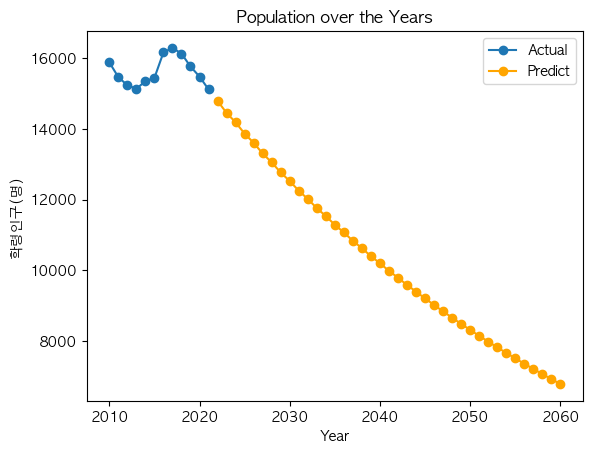

충청북도 괴산군


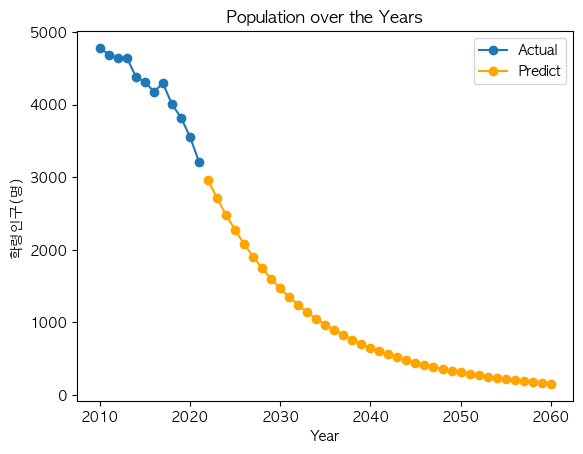

충청북도 단양군


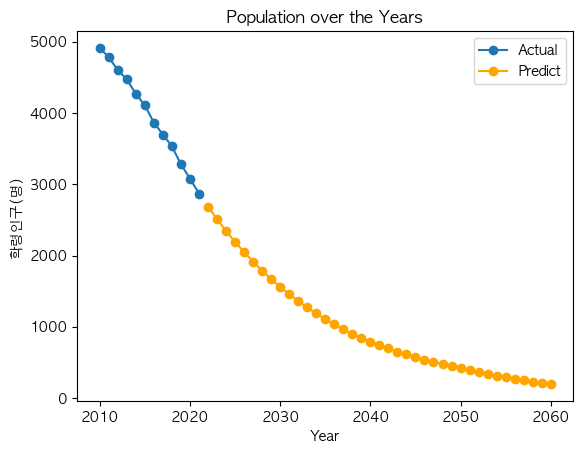

충청북도 보은군


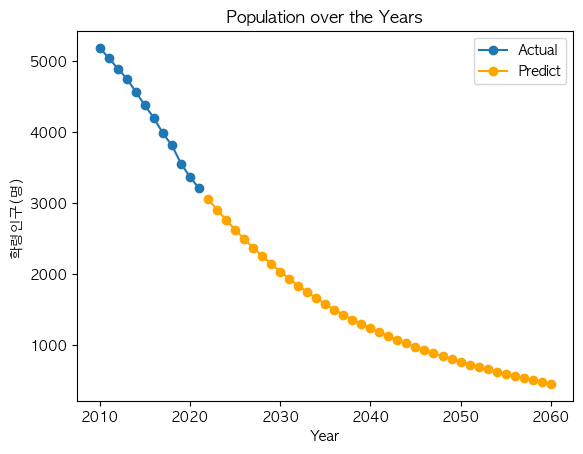

충청북도 영동군


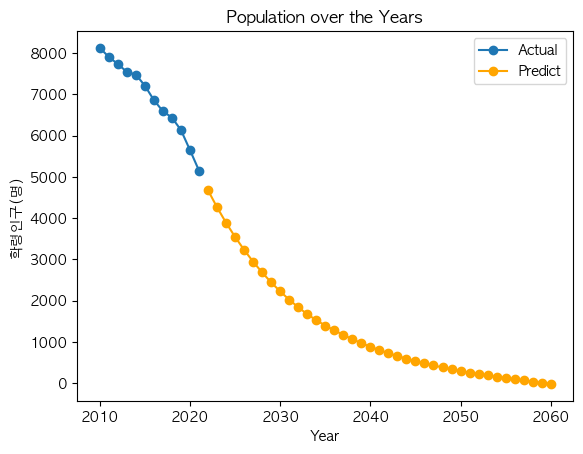

충청북도 옥천군


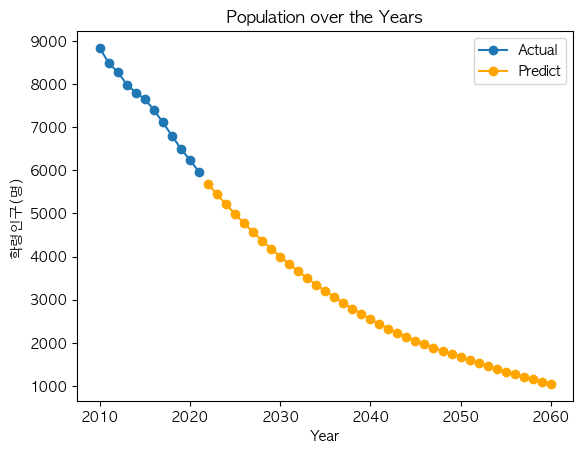

충청북도 음성군


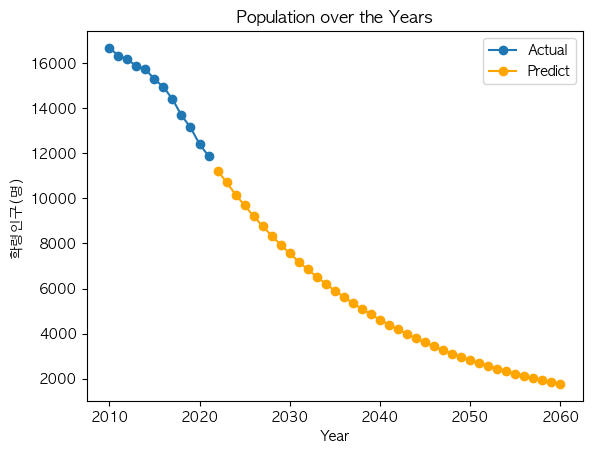

충청북도 증평군


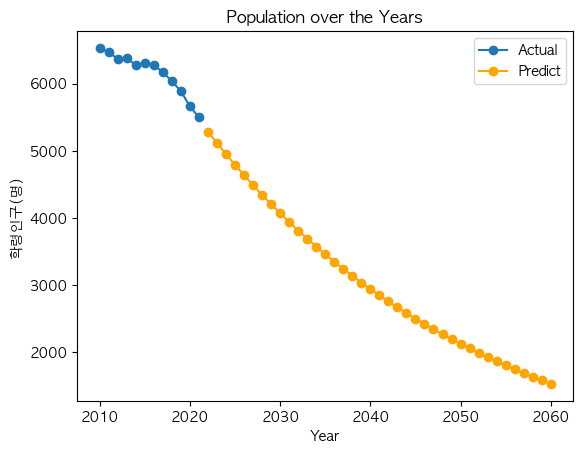

충청북도 진천군


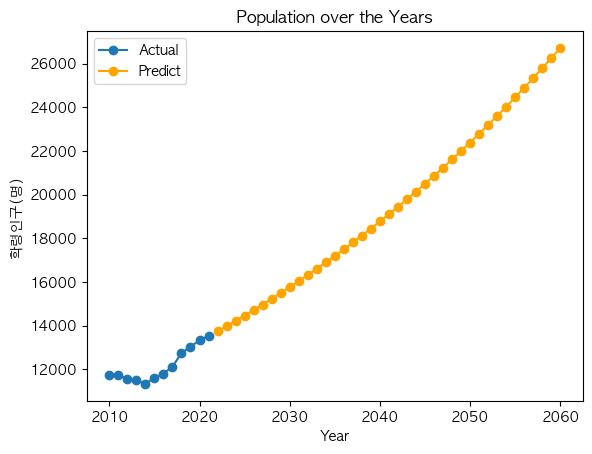

In [55]:
for i in range(len(cluster0)):
    print(str(cluster0[i]['행정구역'].unique()[0]))
  
    visualization_graph(cluster0[i])

# 도별로 예측 학령인구 visualization

In [56]:

merge_df0 = pd.concat(cluster0, axis=0, ignore_index=True)
merge_df1 = pd.concat(cluster1, axis=0, ignore_index=True)
result_merge_df =  pd.concat([merge_df0, merge_df1], axis=0, ignore_index=True)

result_merge_df[['시도', '시군구']] = result_merge_df['행정구역'].str.split(n=1, expand=True)

result_merge_df = result_merge_df[['시도','시군구','연도','학령인구(명)']]
result_merge_df['학령인구(명)'] = result_merge_df['학령인구(명)'].round()
result_merge_df['연도'] = result_merge_df['연도'].round()
result_merge_df = result_merge_df.sort_values(by=['시도', '시군구'])


result_merge_df

,시도,시군구,연도,학령인구(명)
5508,강원특별자치도,강릉시,2010.0,43102.0
5509,강원특별자치도,강릉시,2011.0,41960.0
5510,강원특별자치도,강릉시,2012.0,41589.0
5511,강원특별자치도,강릉시,2013.0,40758.0
5512,강원특별자치도,강릉시,2014.0,39345.0
...,...,...,...,...
11368,충청북도,충주시,2056.0,11733.0
11369,충청북도,충주시,2057.0,11535.0
11370,충청북도,충주시,2058.0,11342.0
11371,충청북도,충주시,2059.0,11153.0


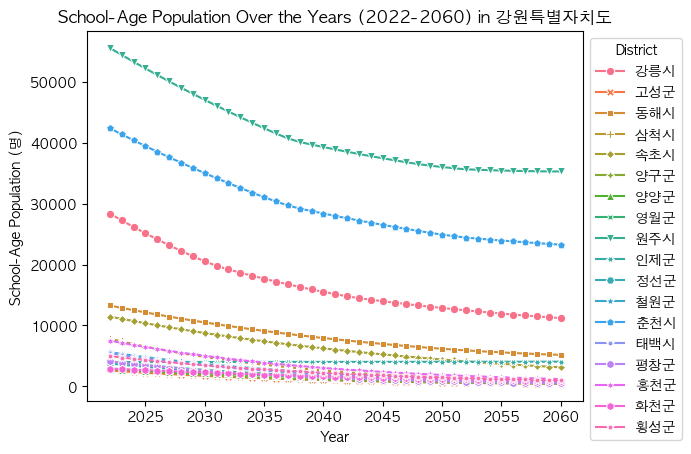

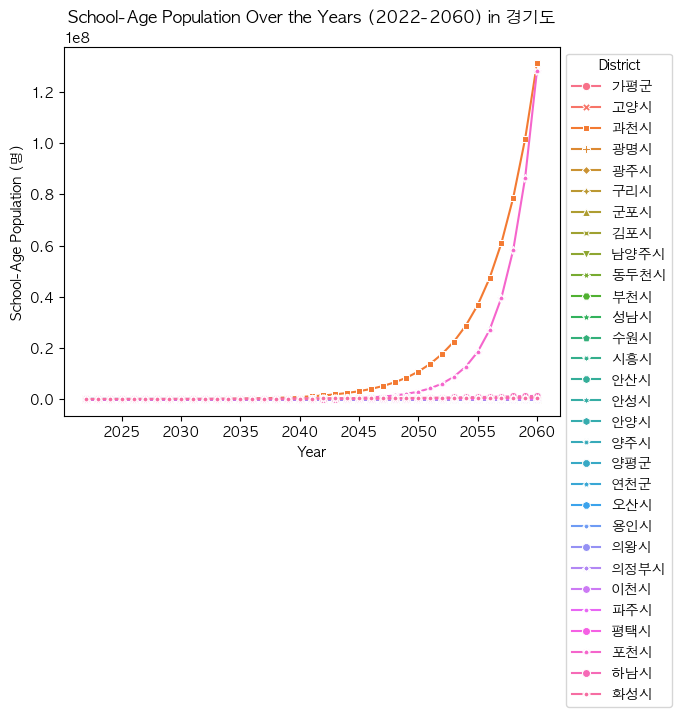

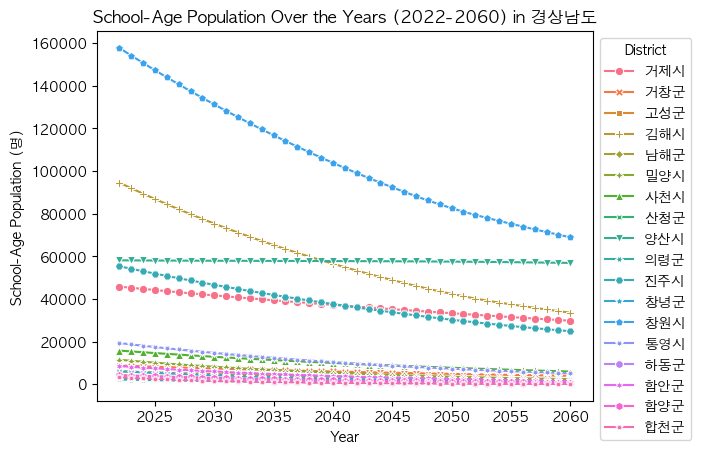

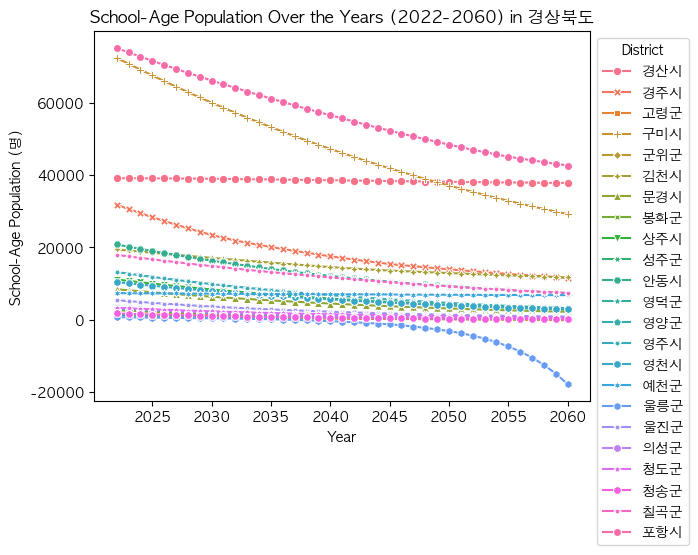

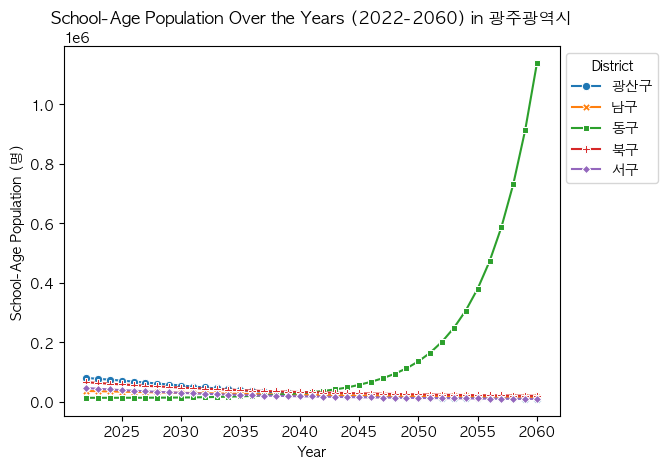

...

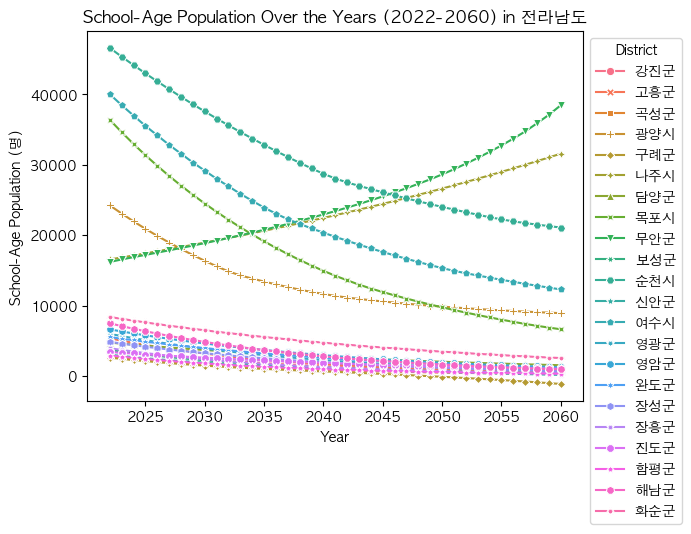

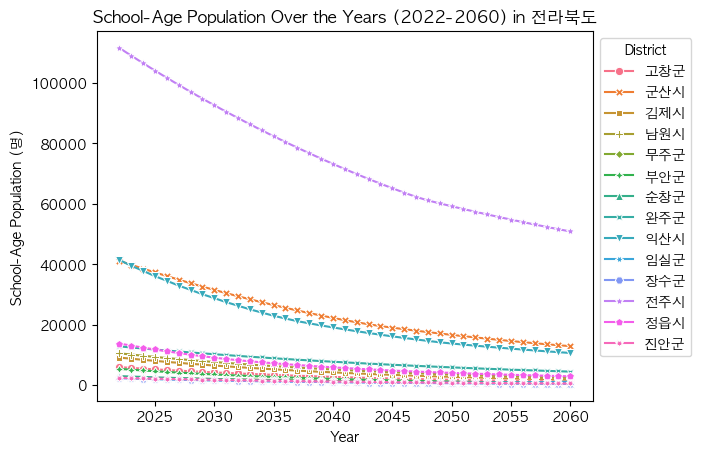

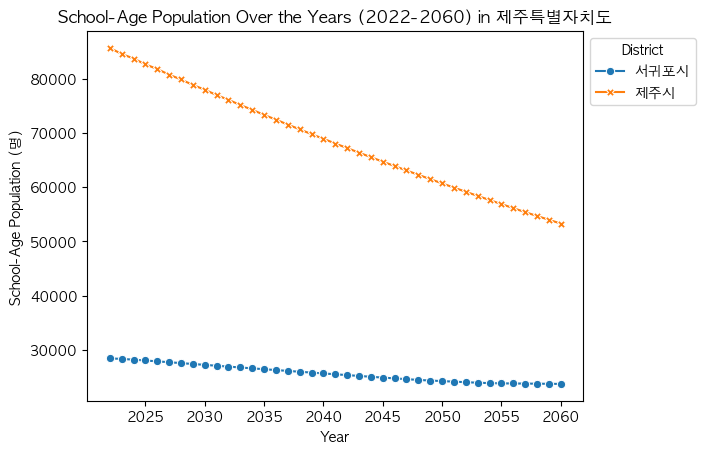

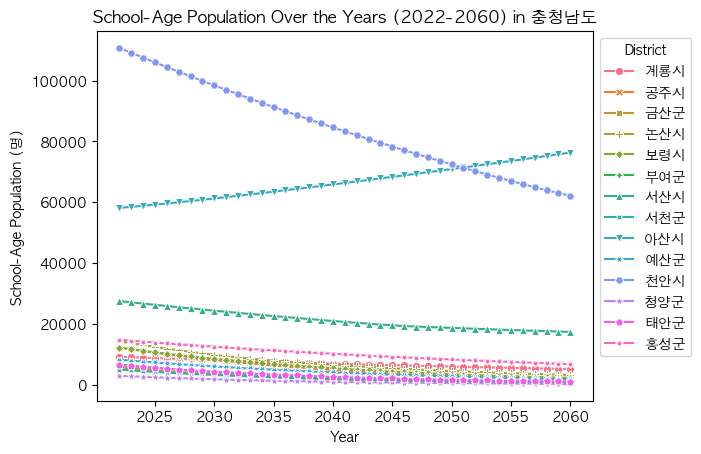

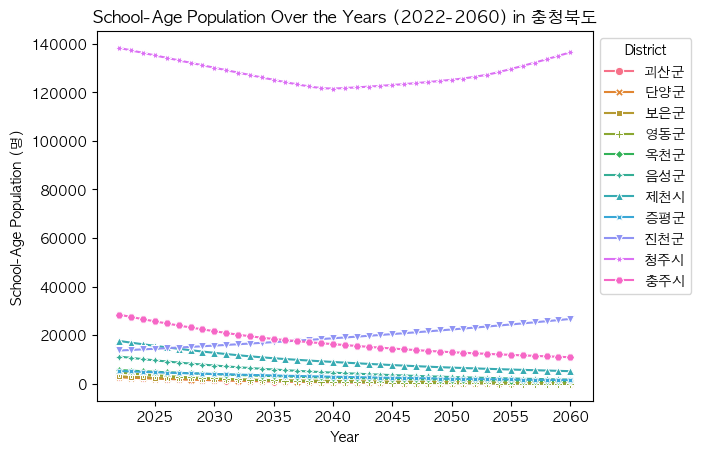

In [57]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming result_merge_df is your DataFrame

# Convert the '연도' column to int and filter for years 2022 and beyond
result_merge_df['연도'] = result_merge_df['연도'].astype(int)
filtered_df = result_merge_df[result_merge_df['연도'] >= 2022]

# Get unique cities in the '시도' column
unique_cities = filtered_df['시도'].unique()

# Create separate line plots for each city
for city in unique_cities:
    city_df = filtered_df[filtered_df['시도'] == city]

    # Create a line plot for the city and its districts
    #plt.figure(figsize=(12, 6))
    sns.lineplot(x='연도', y='학령인구(명)', hue='시군구', style='시군구', data=city_df, markers=True, dashes=False)
    
    plt.title(f'School-Age Population Over the Years (2022-2060) in {city}')
    plt.xlabel('Year')
    plt.ylabel('School-Age Population (명)')
    plt.legend(title='District', bbox_to_anchor=(1, 1), loc='upper left')
    plt.show()
